In short: the notebook ingests FTSE ESG data, cleans and engineers features, imputes missing values with a target-informed strategy, selects/reduces features, trains/tunes multiple regression models to predict each ESG pillar, rigorously evaluates them, and provides rich post-hoc explainability and a SHAP-vs-LIME comparison.

***
# importing libraries

In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("/Users/tobifadeyi/Documents/Thesis code/Raw Data/FTSE Combined with scores/combined_all_with_scores.csv")

density population plot

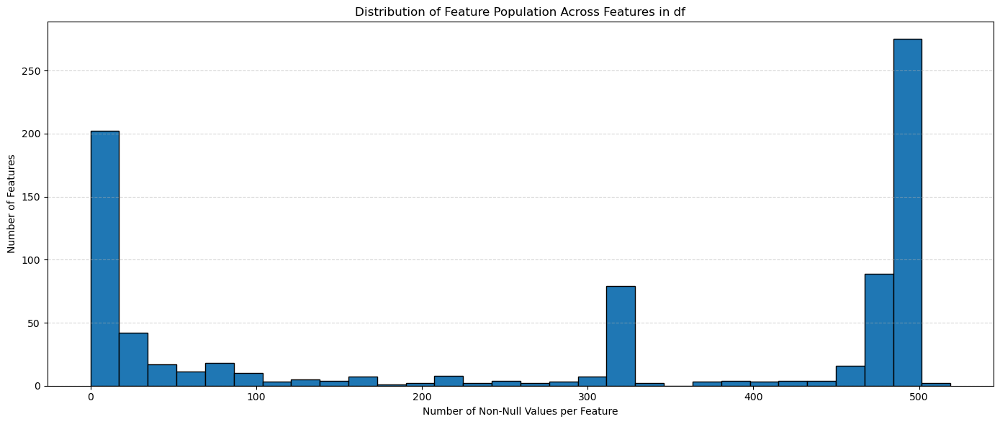

In [3]:
from matplotlib import pyplot as plt


plt.figure(figsize=(14, 6))
feature_counts = df.count()
feature_counts.plot(kind='hist', bins=30, edgecolor='black')
plt.xlabel('Number of Non-Null Values per Feature')
plt.ylabel('Number of Features')
plt.title('Distribution of Feature Population Across Features in df')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

Removing 100% missingness

In [4]:
missing_100 = df.columns[df.isnull().mean() == 1.0]
print(f"Number of columns with 100% missingness: {len(missing_100)}")
missing_100

Number of columns with 100% missingness: 87


Index(['Fleet Fuel Consumption_x', 'Lobbying Controversies',
       'Lobbying Contribution Amount', 'Recent Public Health Controversies',
       'Recent Critical Countries Controversies',
       'Military Weapons or Personnel Revenue', 'Firearms Producer Revenue',
       'Firearms Retailer Revenue', 'Alcohol Retailer Revenue',
       'Tobacco Retailer Revenue',
       'Military Weapons or Personnel Revenue Percent',
       'Firearms Producer Revenue Percent', 'Gambling Retailer Revenue',
       'Firearms Retailer Revenue Percent',
       'Thermal Coal-fired Power Generation Revenue',
       'Alcohol Retailer Revenue Percent', 'Nuclear Power Generation Revenue',
       'Tobacco Retailer Revenue Percent', 'Gambling Retailer Revenue Percent',
       'Oil Sands Producer Revenue',
       'Thermal Coal-fired Power Generation Revenue Percent',
       'Nuclear Power Generation Revenue Percent',
       'Arctic Oil Producer Revenue', 'Oil Sands Producer Revenue Percent',
       'Arctic Oil Produ

In [5]:
df = df.drop(columns=missing_100, errors='ignore')

importing datasets

In [6]:
gov_path = "/Users/tobifadeyi/Documents/Thesis code/Raw Data/FTSE Combined Data sets/extracted_governance_full.csv"
soc_path = "/Users/tobifadeyi/Documents/Thesis code/Raw Data/FTSE Combined Data sets/extracted_social_full.csv"
env_path = "/Users/tobifadeyi/Documents/Thesis code/Raw Data/FTSE Combined Data sets/extracted_environment_full.csv"


extracting column names

In [7]:
governance = pd.read_csv(gov_path)
social = pd.read_csv(soc_path)
environment = pd.read_csv(env_path)

gov_cols = list(governance.columns)
soc_cols = list(social.columns)
env_cols = list(environment.columns)

# Combine all columns (remove duplicates)
all_cols = list(dict.fromkeys(gov_cols + soc_cols + env_cols))

# Select these columns from df (if they exist)
cols_in_df = [col for col in all_cols if col in df.columns]
merged = df[cols_in_df]


dropping duplicate columns with invalid names

In [8]:
# Split the tab-separated string into a list of column names
cols_to_drop = [
	'ESG Score Grade_x', 'ESG Combined Score Grade_x', 'ESG Score_x', 'ESG Combined Score_x', 'ESG Controversies Score_x',
	'Social Pillar Score Grade_x', 'Governance Pillar Score Grade_x', 'Environmental Pillar Score Grade_x',
	'Social Pillar Score_x', 'Governance Pillar Score_x', 'Environmental Pillar Score_x',
	'Resource Use Score Grade_x', 'Emissions Score Grade_x', 'Environmental Innovation Score Grade_x',
	'Workforce Score Grade_x', 'Human Rights Score Grade_x', 'Community Score Grade_x',
	'Product Responsibility Score Grade_x', 'Management Score Grade_x', 'Shareholders Score Grade_x',
	'CSR Strategy Score Grade_x', 'Resource Use Score_x', 'Emissions Score_x', 'Environmental Innovation Score_x',
	'Workforce Score_x', 'Human Rights Score_x', 'Community Score_x', 'Product Responsibility Score_x',
	'Management Score_x', 'Shareholders Score_x', 'CSR Strategy Score_x', 'Instrument',
]
merged.drop(columns=cols_to_drop, inplace=True, errors='ignore')

/var/folders/fl/lv0hc01x58s_68_8g3k5dngc0000gn/T/ipykernel_50971/1482731155.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged.drop(columns=cols_to_drop, inplace=True, errors='ignore')


In [9]:
merged.drop_duplicates(inplace=True)

/var/folders/fl/lv0hc01x58s_68_8g3k5dngc0000gn/T/ipykernel_50971/3747040622.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged.drop_duplicates(inplace=True)


In [10]:
merged = merged.drop('Instrument', axis=1, errors='ignore')

In [11]:
merged_table = merged.copy()

In [ ]:
def robust_bool_to_numeric(series):
    """
    Converts a pandas Series with boolean-like values to 1/0, leaves others unchanged.
    """
    mapping = {
        'true': 1, '1': 1, 'yes': 1, True: 1,
        'false': 0, '0': 0, 'no': 0, False: 0
        , 'No': 0, 'NO': 0, 'Yes': 1, 'YES': 1
    }
    return series.apply(lambda x: mapping.get(str(x).strip().lower(), x) if pd.notnull(x) else x)

for col in merged_table.columns:
    unique = set(str(x).strip().lower() for x in merged_table[col].dropna().unique())
    # to only convert if column contains ONLy these values (and NaN)
    if unique <= {'true','false','1','0','yes','no','No','NO','Yes','YES', True, False}:
        merged_table[col] = robust_bool_to_numeric(merged_table[col])



mapping percentages

In [13]:
percent_map = {
    '100%': 1.0,
    '>50% to 100%': 0.75,
    '>20% to 50%': 0.35,
    '>10% to 20%': 0.15,
    '0 to 10%': 0.05,
    '>10% to 20%': 0.15,
    '>20% to 50%': 0.35,
    '>50% to 100%': 0.75,
}

for col in merged_table.columns:
    if set(str(x).strip() for x in merged_table[col].dropna().unique()).issubset(percent_map.keys()):
        merged_table[col] = merged_table[col].map(percent_map)


In [14]:
merged_table.select_dtypes(include='object').columns.tolist()

['CSR Sustainability External Auditor Name',
 'ESG Period Last Update Date',
 'Critical Country 1',
 'Critical Country 2',
 'Critical Country 3',
 'Critical Country 4',
 'Critical Country 5',
 'CO2 Estimation Method',
 'ISO 14000 or EMS']

In [15]:
possible_categorical = merged_table.select_dtypes(include='object').nunique()

In [16]:
cat_cols = possible_categorical[possible_categorical <= 100].index

In [17]:
for col in cat_cols:
	print(f"{col}: {merged_table[col].unique()}")

CSR Sustainability External Auditor Name: [nan 'IBIS ESG Consulting Africa (Pty) Ltd' 'Ernst & Young LLP'
 'Ernst & Young LLP (EY)' 'Carbon Trust' 'Deloitte LLP'
 'Carbon Footprint Ltd' 'Carbon Footprint Limited' 'Deloitte Advisory SpA'
 'EY Limited' 'EcoAct' 'PricewaterhouseCoopers LLP, UK' 'Bureau Veritas'
 'Bureau Veritas UK Limited' 'KPMG LLP' 'KPMG Audit LLP'
 'Corporate Citizenship' 'PricewaterhouseCoopers LLP'
 "Lloyd's Register Quality Assurance Ltd (LRQA)"
 "Lloyd's Register Quality Assurance Ltd"
 'DNV GL Business Assurance Services UK Limited'
 'DNV Business Assurance Services UK Limited' 'Denkstatt GmbH'
 'denkstatt GmbH' 'PricewaterhouseCoopers SA'
 'KPMG LLP,Carbon Smart Limited' 'Avieco' 'Ernst & young'
 'ERNST & YOUNG IRELAND' 'Environmental & Sustainability Solutions'
 'PricewaterhouseCoopers' 'VERIFAVIA SAS' 'NORMEC VERIFAVIA SAS'
 'Carbon Credentials Energy Services Ltd' 'KPMG LLP (Canada)'
 'KPMG Asesores S.L' 'Apex Companies, LLC'
 'Carbon Intelligence Pty Limited'

In [18]:
merged_table.loc[:, merged.dtypes == 'object']

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,CO2 Estimation Method,Particulate Matter Emissions Reduction,NOx and SOx Emissions Reduction,e-Waste Reduction,ISO 14000 or EMS,Staff Transportation Impact Reduction,Environmental Restoration Initiatives,Environmental Investments Initiatives,Environmental Partnerships,Policy Nuclear Safety
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Median,0.0,0.0,1.0,No,0.0,1.0,0.0,0.0,0.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Median,0.0,0.0,1.0,No,0.0,1.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Reported,0.0,0.0,1.0,No,0.0,1.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Reported,0.0,0.0,1.0,No,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Reported,0.0,0.0,0.0,No,0.0,0.0,0.0,1.0,0.0
515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Reported,0.0,0.0,0.0,No,0.0,0.0,0.0,1.0,0.0
516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Reported,0.0,0.0,0.0,No,0.0,0.0,1.0,1.0,0.0
517,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Reported,0.0,0.0,0.0,No,0.0,0.0,1.0,1.0,0.0


In [19]:
merged_table

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,Self-Reported Environmental Fines To Revenues in million,Environmental Restoration Initiatives,Accidental Spills,Environmental Expenditures,Environmental Investments Initiatives,Environmental Partnerships,Ozone-Depleting Substances To Revenues USD in million,SOx Emissions To Revenues USD in million,Accidental Spills To Revenues USD in million,Policy Nuclear Safety
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,1.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,1.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,NaN,404000000.0,1.0,1.0,NaN,NaN,NaN,0.0
517,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,NaN,504000000.0,1.0,1.0,NaN,NaN,NaN,0.0


In [20]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.max_colwidth')


Select columns with 10 or fewer unique values (likely categorical)


In [21]:
cat_cols = possible_categorical[possible_categorical <= 100].index
merged_table.loc[:, cat_cols]

,CSR Sustainability External Auditor Name,ESG Period Last Update Date,Critical Country 1,Critical Country 2,Critical Country 3,Critical Country 4,Critical Country 5,CO2 Estimation Method,ISO 14000 or EMS
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,2025-05-30,NaN,NaN,NaN,NaN,NaN,Median,No
2,NaN,2025-05-30,NaN,NaN,NaN,NaN,NaN,Median,No
3,NaN,2025-06-20,NaN,NaN,NaN,NaN,NaN,Reported,No
4,NaN,2025-06-20,NaN,NaN,NaN,NaN,NaN,Reported,No
...,...,...,...,...,...,...,...,...,...
514,Corporate Citizenship,2025-02-28,NaN,NaN,NaN,NaN,NaN,Reported,No
515,Corporate Citizenship,2025-06-06,NaN,NaN,NaN,NaN,NaN,Reported,No
516,Corporate Citizenship,2025-06-20,NaN,NaN,NaN,NaN,NaN,Reported,No
517,RSM UK Audit LLP,2025-07-25,NaN,NaN,NaN,NaN,NaN,Reported,No


In [22]:
merged.drop(columns=['ESG Period Last Update Date'], inplace=True, errors='ignore')
merged_table.drop(columns=['ESG Period Last Update Date'], inplace=True, errors='ignore')
merged_table.drop(columns=['CSR Sustainability External Auditor Name'], inplace=True, errors='ignore')
merged.drop(columns=['CSR Sustainability External Auditor Name'], inplace=True, errors='ignore')  

In [23]:
possible_categorical = merged_table.select_dtypes(include='object').nunique()
cat_cols = possible_categorical[possible_categorical <= 100].index
merged_table.loc[:, cat_cols]

,Critical Country 1,Critical Country 2,Critical Country 3,Critical Country 4,Critical Country 5,CO2 Estimation Method,ISO 14000 or EMS
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,Median,No
2,NaN,NaN,NaN,NaN,NaN,Median,No
3,NaN,NaN,NaN,NaN,NaN,Reported,No
4,NaN,NaN,NaN,NaN,NaN,Reported,No
...,...,...,...,...,...,...,...
514,NaN,NaN,NaN,NaN,NaN,Reported,No
515,NaN,NaN,NaN,NaN,NaN,Reported,No
516,NaN,NaN,NaN,NaN,NaN,Reported,No
517,NaN,NaN,NaN,NaN,NaN,Reported,No


In [24]:
merged_table

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,Self-Reported Environmental Fines To Revenues in million,Environmental Restoration Initiatives,Accidental Spills,Environmental Expenditures,Environmental Investments Initiatives,Environmental Partnerships,Ozone-Depleting Substances To Revenues USD in million,SOx Emissions To Revenues USD in million,Accidental Spills To Revenues USD in million,Policy Nuclear Safety
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,1.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,1.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,NaN,NaN,0.0,1.0,NaN,NaN,NaN,0.0
516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,NaN,404000000.0,1.0,1.0,NaN,NaN,NaN,0.0
517,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,NaN,504000000.0,1.0,1.0,NaN,NaN,NaN,0.0


In [25]:
# feature_cols = [col for col in df.columns if col not in exclude_cols]

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

In [27]:
missing_100_merged = merged.columns[merged.isnull().mean() == 1.0]
print(f"Number of columns with 100% missingness in merged: {len(missing_100_merged)}")
missing_100_merged

Number of columns with 100% missingness in merged: 0


Index([], dtype='object')

In [29]:
cleaned_merged = merged_table.copy()

In [30]:
# Removing features with >80% missing values
missing_threshold = 1.0
keep_cols = [col for col in cleaned_merged.columns if cleaned_merged[col].isnull().mean() < missing_threshold]
filtered_table = cleaned_merged[keep_cols]

print(f"Columns removed due to missingness: {set(cleaned_merged.columns) - set(filtered_table.columns)}")

#Removing features with low variance (all values the same, or only one unique non-null value)
low_variance_cols = [col for col in filtered_table.columns if filtered_table[col].nunique(dropna=True) <= 1]
filtered_table = filtered_table.drop(columns=low_variance_cols)

print(f"Columns removed due to low variance: {low_variance_cols}")

# Now filtered_table contains only features with reasonable data and some variation.


Columns removed due to missingness: set()
Columns removed due to low variance: ['Nomination Board Committee', 'Audit Board Committee', 'Board Structure Policy', 'Policy Board Experience', 'Nomination Committee Mgt Independence', 'Board Background and Skills', 'Hispanic or Latino - Ethnic Minorities Board Percentage_x', 'Exchange Rate to USD', 'Shareholder Rights Policy', 'Voting Cap', 'Voting Cap Percentage', 'Classified Board Structure', 'Supermajority Vote Requirement', 'Elimination of Cumulative Voting Rights', 'Hispanic or Latino - Ethnic Minorities Board Percentage_y', 'Training and Development Policy', 'Recent Diversity Opportunity Controversies', 'Recent Employee Health & Safety Controversies', 'BBBEE Level', 'Corruption Fines', 'Recent Lobbying Controversies', 'Critical Country 2', 'Critical Country 3', 'Critical Country 4', 'Critical Country 5', 'Recent Tax Fraud Controversies', 'Recent Intellectual Property Controversies', 'Recent Greenwashing Fines Controversies Count', 'Che

In [31]:
len(low_variance_cols)

65

In [32]:
# ESG Score	ESG Combined Score	ESG Controversies Score	Social Pillar Score Grade	Governance Pillar Score Grade	Environmental Pillar Score Grade	Social Pillar Score	Governance Pillar Score	Environmental Pillar Score	Resource Use Score Grade	Emissions Score Grade	Environmental Innovation Score Grade	Workforce Score Grade	Human Rights Score Grade	Community Score Grade	Product Responsibility Score Grade	Management Score Grade	Shareholders Score Grade	CSR Strategy Score Grade	Resource Use Score	Emissions Score	Environmental Innovation Score	Workforce Score	Human Rights Score	Community Score	Product Responsibility Score	Management Score	Shareholders Score	CSR Strategy Score

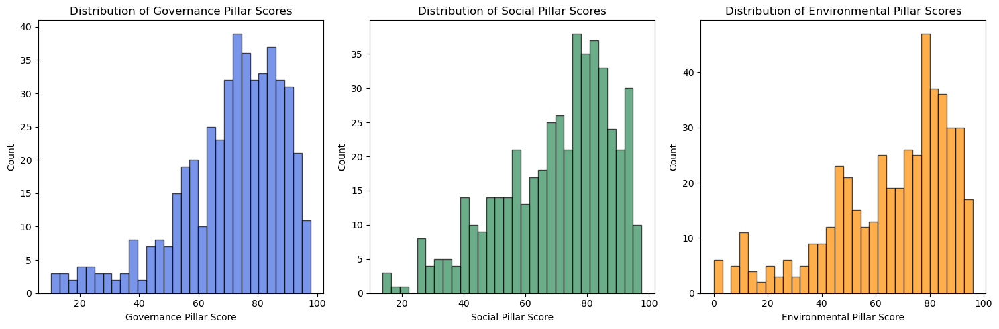

In [83]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(y_gov, bins=30, color='royalblue', edgecolor='black', alpha=0.7)
plt.title('Distribution of Governance Pillar Scores')
plt.xlabel('Governance Pillar Score')
plt.ylabel('Count')

plt.subplot(1, 3, 2)
plt.hist(y_soc, bins=30, color='seagreen', edgecolor='black', alpha=0.7)
plt.title('Distribution of Social Pillar Scores')
plt.xlabel('Social Pillar Score')
plt.ylabel('Count')

plt.subplot(1, 3, 3)
plt.hist(y_env, bins=30, color='darkorange', edgecolor='black', alpha=0.7)
plt.title('Distribution of Environmental Pillar Scores')
plt.xlabel('Environmental Pillar Score')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

In [82]:
from scipy.stats import skew, kurtosis

# Calculate skewness and kurtosis for each pillar score
gov_skew = skew(y_gov)
gov_kurt = kurtosis(y_gov)
soc_skew = skew(y_soc)
soc_kurt = kurtosis(y_soc)
env_skew = skew(y_env)
env_kurt = kurtosis(y_env)

print(f"Governance Pillar Score: skewness={gov_skew:.2f}, kurtosis={gov_kurt:.2f}")
print(f"Social Pillar Score:     skewness={soc_skew:.2f}, kurtosis={soc_kurt:.2f}")
print(f"Environmental Pillar Score: skewness={env_skew:.2f}, kurtosis={env_kurt:.2f}")

Governance Pillar Score: skewness=-1.08, kurtosis=1.00
Social Pillar Score:     skewness=-0.74, kurtosis=-0.13
Environmental Pillar Score: skewness=-0.96, kurtosis=0.25


In [41]:
# Reindex merged_table to match df if needed
cleaned_merged = merged_table.reindex(df.index)
for col in ['Social Pillar Score', 'Governance Pillar Score', 'Environmental Pillar Score']:
    if col in df.columns:
        merged_table[col] = df[col]


In [42]:
keep_clean = cleaned_merged.copy()

In [43]:
cleaned_merged = pd.get_dummies(cleaned_merged, columns=cat_cols, dummy_na=True, drop_first=False)

In [44]:
cleaned_merged

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,Critical Country 5_IR,Critical Country 5_nan,CO2 Estimation Method_Median,CO2 Estimation Method_Reported,CO2 Estimation Method_nan,ISO 14000 or EMS_Both,ISO 14000 or EMS_EMS,ISO 14000 or EMS_ISO 14000,ISO 14000 or EMS_No,ISO 14000 or EMS_nan
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,True,False,False,True,False,False,False,False,True
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,True,True,False,False,False,False,False,True,False
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,True,True,False,False,False,False,False,True,False
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,True,False,True,False,False,False,False,True,False
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,True,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,True,False,True,False,False,False,False,True,False
515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,True,False,True,False,False,False,False,True,False
516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,True,False,True,False,False,False,False,True,False
517,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,True,False,True,False,False,False,False,True,False


In [45]:
bool_cols = cleaned_merged.select_dtypes(include=['bool']).columns
cleaned_merged[bool_cols] = cleaned_merged[bool_cols].astype(int)


In [46]:
# cleaned_merged = merged_table.reindex(df.index)
# for col in ['Social Pillar Score', 'Governance Pillar Score', 'Environmental Pillar Score']:
#     if col in df.columns:
#         merged_table[col] = df[col]

gov_features = [col for col in governance if col in cleaned_merged.columns]
soc_features = [col for col in social if col in cleaned_merged.columns]
env_features = [col for col in environment if col in cleaned_merged.columns]

target_cols = {
    'Governance Pillar Score': gov_features,
    'Social Pillar Score': soc_features,
    'Environmental Pillar Score': env_features
}

corr_results = {}

for target, feats in target_cols.items():
    corr_dict = {}
    for feat in feats:
        # Only use numeric features
        if pd.api.types.is_numeric_dtype(cleaned_merged[feat]):
            valid = cleaned_merged[[feat, target]].dropna()
            if len(valid) > 2:
                corr_dict[feat] = valid[feat].corr(valid[target])
            else:
                corr_dict[feat] = np.nan
    corr_results[target] = pd.Series(corr_dict)

/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarn

In [48]:
cleaned_merged_another = cleaned_merged.copy()
cleaned_merged_another.to_csv("/Users/tobifadeyi/Documents/Thesis code/cleaned_merged_another.csv", index=False)

In [49]:
corr_threshold = 0.2 #arbitrary, can be adjusted

imputed_table = cleaned_merged.copy()

for target, feats in target_cols.items():
    corr_series = corr_results[target]
    for feat in feats:
        if pd.api.types.is_numeric_dtype(imputed_table[feat]):
            corr = corr_series.get(feat, np.nan)
            missing_count = imputed_table[feat].isna().sum()
            if pd.isna(corr) or missing_count == 0:
                continue  # (note) to ensure to skip if no correlation or nothing missing
            if abs(corr) >= corr_threshold:
                fill_val = imputed_table[feat].min() if corr > 0 else imputed_table[feat].max()
                imputed_table[feat] = imputed_table[feat].fillna(fill_val)
                print(f"{feat}: filled {missing_count} missing with {'min' if corr > 0 else 'max'} ({fill_val}) [corr={corr:.2f}]")
            else:
                fill_val = imputed_table[feat].median()
                imputed_table[feat] = imputed_table[feat].fillna(fill_val)
                print(f"{feat}: filled {missing_count} missing with median ({fill_val}) [corr={corr:.2f}, weak or undefined]")


Audit Oversight of Tax: filled 204 missing with min (0.0) [corr=0.28]
Named Position for Tax Oversight: filled 204 missing with median (0.0) [corr=0.19, weak or undefined]
Tax Breakdown by Country: filled 204 missing with min (0.0) [corr=0.28]
Tax Breakdown by Domestic or International: filled 204 missing with min (0.0) [corr=0.30]
Tax Data Verification: filled 204 missing with median (0.0) [corr=0.17, weak or undefined]
Tax Fairness Commitment: filled 204 missing with median (0.0) [corr=0.19, weak or undefined]
Tax in Audit Tor: filled 204 missing with median (0.0) [corr=0.13, weak or undefined]
Tax Oversight by Board: filled 204 missing with min (0.0) [corr=0.29]
Policy Tax Transparency: filled 204 missing with min (0.0) [corr=0.40]
Taxes Align to Revenues: filled 204 missing with min (0.0) [corr=0.38]
CSR Sustainability Committee: filled 44 missing with min (0.0) [corr=0.51]
Integrated Strategy in MD&A: filled 52 missing with median (1.0) [corr=0.02, weak or undefined]
Global Compac

In [50]:
imputed_table

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,Critical Country 5_IR,Critical Country 5_nan,CO2 Estimation Method_Median,CO2 Estimation Method_Reported,CO2 Estimation Method_nan,ISO 14000 or EMS_Both,ISO 14000 or EMS_EMS,ISO 14000 or EMS_ISO 14000,ISO 14000 or EMS_No,ISO 14000 or EMS_nan
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,1,0,0,0,0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,1,0,0,0,0,0,1,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,1,0,0,0,0,0,1,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
515,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
517,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0


/var/folders/fl/lv0hc01x58s_68_8g3k5dngc0000gn/T/ipykernel_50971/2292044580.py:48: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


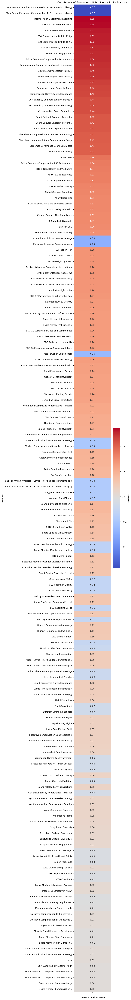


Top 10 features for Governance Pillar Score:
Total Senior Executives Compensation To Revenues in million_y   -0.572390
Total Senior Executives Compensation To Revenues in million_x   -0.572390
Internal Audit Department Reporting                              0.545637
CSR Sustainability Reporting                                     0.540179
Policy Executive Retention                                       0.519847
CEO Compensation Link to TSR_x                                   0.517984
CEO Compensation Link to TSR_y                                   0.517984
CSR Sustainability Committee                                     0.506923
Stakeholder Engagement                                           0.505036
Policy Executive Compensation Performance                        0.504792
dtype: float64


/var/folders/fl/lv0hc01x58s_68_8g3k5dngc0000gn/T/ipykernel_50971/2292044580.py:48: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


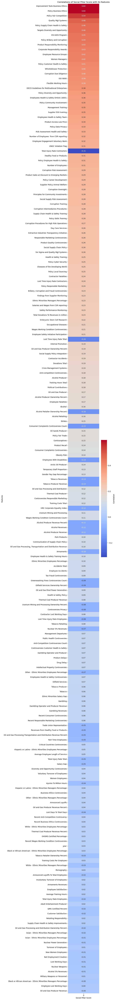


Top 10 features for Social Pillar Score:
Improvement Tools Business Ethics      0.597410
Policy Business Ethics                 0.595959
Policy Fair Competition                0.541846
Quality Mgt Systems                    0.481151
Policy Supply Chain Health & Safety    0.456126
Targets Diversity and Opportunity      0.455990
HIV-AIDS Program                       0.447361
Policy Bribery and Corruption          0.441942
Product Responsibility Monitoring      0.431938
Corporate Responsibility Awards        0.426131
dtype: float64


/var/folders/fl/lv0hc01x58s_68_8g3k5dngc0000gn/T/ipykernel_50971/2292044580.py:48: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


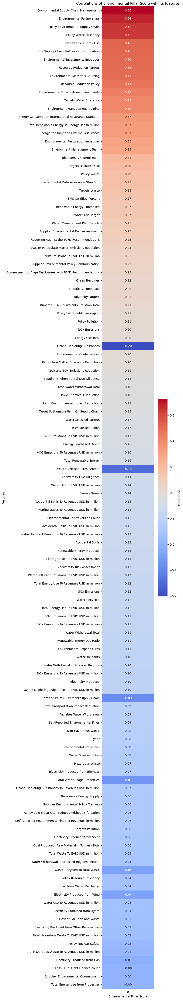


Top 10 features for Environmental Pillar Score:
Environmental Supply Chain Management       0.564363
Environmental Partnerships                  0.542712
Policy Environmental Supply Chain           0.521184
Policy Water Efficiency                     0.521142
Renewable Energy Use                        0.461755
Env Supply Chain Partnership Termination    0.457501
Environmental Investments Initiatives       0.456527
Resource Reduction Targets                  0.452775
Environmental Materials Sourcing            0.448078
Resource Reduction Policy                   0.437392
dtype: float64


In [ ]:
# Removing features with >90% missing values 
missing_threshold = 0.9
keep_cols = [col for col in imputed_table.columns if imputed_table[col].isnull().mean() < missing_threshold]
filtered_table = imputed_table[keep_cols]

# Removing low-variance features 
low_variance_cols = [col for col in filtered_table.columns if filtered_table[col].nunique(dropna=True) <= 1]
filtered_table = filtered_table.drop(columns=low_variance_cols)

# Preparing pillar-specific feature lists
gov_features = [col for col in governance if col in filtered_table.columns]
soc_features = [col for col in social if col in filtered_table.columns]
env_features = [col for col in environment if col in filtered_table.columns]

target_cols = {
    'Governance Pillar Score': gov_features,
    'Social Pillar Score': soc_features,
    'Environmental Pillar Score': env_features
}

corr_results = {}

for target, feats in target_cols.items():
    corr_dict = {}
    for feat in feats:
        # Only use numeric features
        if pd.api.types.is_numeric_dtype(filtered_table[feat]):
            valid = filtered_table[[feat, target]].dropna()
            if len(valid) > 2:
                corr_dict[feat] = valid[feat].corr(valid[target])
            else:
                corr_dict[feat] = np.nan
    corr_results[target] = pd.Series(corr_dict)

# Plot heatmap for each pillar 
for target, corr_series in corr_results.items():
    sorted_corr = corr_series.dropna().sort_values(key=abs, ascending=False)
    plt.figure(figsize=(4, max(6, len(sorted_corr) // 2)))
    sns.heatmap(
        sorted_corr.values.reshape(-1, 1), 
        annot=True, fmt=".2f",
        yticklabels=sorted_corr.index, cmap='coolwarm',
        cbar_kws={'label': 'Correlation'}
    )
    plt.title(f"Correlations of {target} with its features")
    plt.ylabel('Features')
    plt.xlabel(target)
    plt.tight_layout()
    plt.show()
 
    print(f"\nTop 10 features for {target}:")
    print(sorted_corr.head(10))


In [52]:
filtered_table

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,Critical Country 5_IR,Critical Country 5_nan,CO2 Estimation Method_Median,CO2 Estimation Method_Reported,CO2 Estimation Method_nan,ISO 14000 or EMS_Both,ISO 14000 or EMS_EMS,ISO 14000 or EMS_ISO 14000,ISO 14000 or EMS_No,ISO 14000 or EMS_nan
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,1,0,0,0,0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,1,0,0,0,0,0,1,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,1,0,0,0,0,0,1,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
515,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
517,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0


/var/folders/fl/lv0hc01x58s_68_8g3k5dngc0000gn/T/ipykernel_50971/2711936654.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


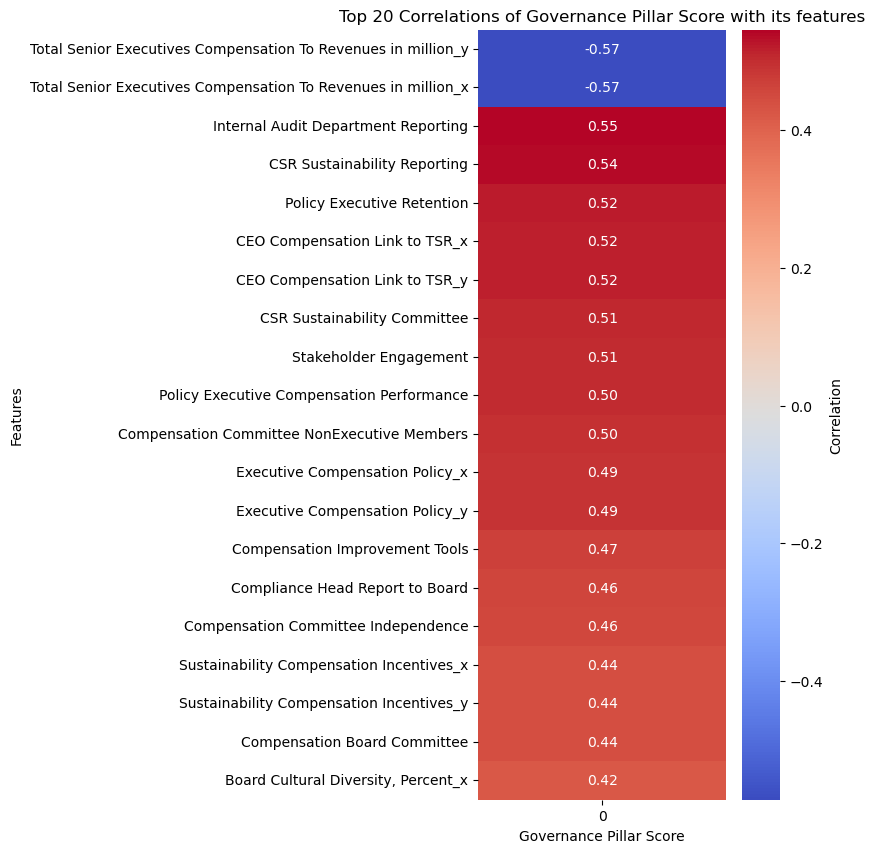

/var/folders/fl/lv0hc01x58s_68_8g3k5dngc0000gn/T/ipykernel_50971/2711936654.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()



Top 20 features for Governance Pillar Score:
Total Senior Executives Compensation To Revenues in million_y   -0.572390
Total Senior Executives Compensation To Revenues in million_x   -0.572390
Internal Audit Department Reporting                              0.545637
CSR Sustainability Reporting                                     0.540179
Policy Executive Retention                                       0.519847
CEO Compensation Link to TSR_x                                   0.517984
CEO Compensation Link to TSR_y                                   0.517984
CSR Sustainability Committee                                     0.506923
Stakeholder Engagement                                           0.505036
Policy Executive Compensation Performance                        0.504792
Compensation Committee NonExecutive Members                      0.496657
Executive Compensation Policy_x                                  0.489000
Executive Compensation Policy_y                                  0

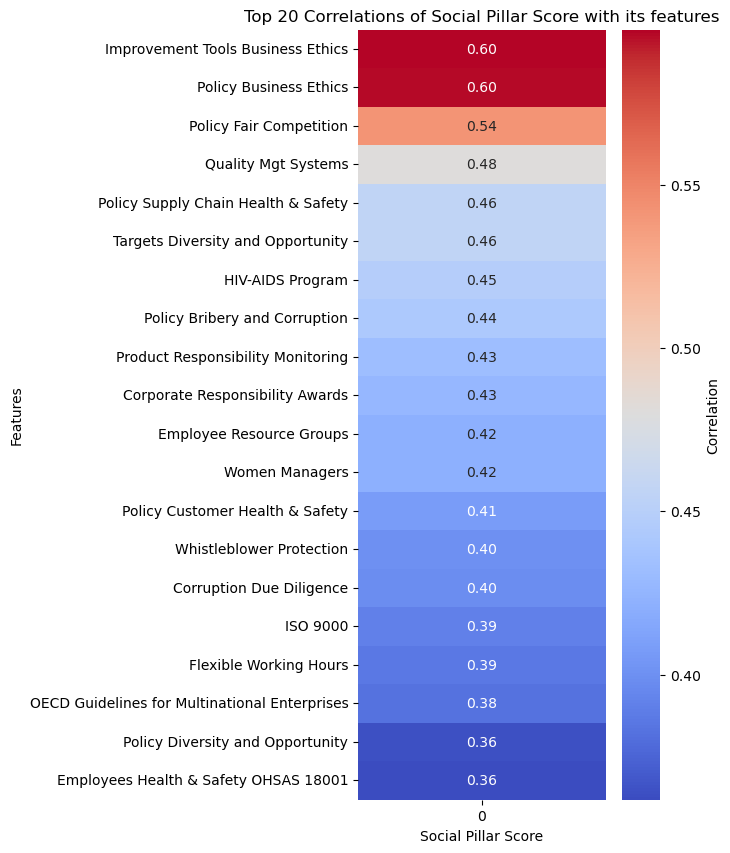


Top 20 features for Social Pillar Score:
Improvement Tools Business Ethics                0.597410
Policy Business Ethics                           0.595959
Policy Fair Competition                          0.541846
Quality Mgt Systems                              0.481151
Policy Supply Chain Health & Safety              0.456126
Targets Diversity and Opportunity                0.455990
HIV-AIDS Program                                 0.447361
Policy Bribery and Corruption                    0.441942
Product Responsibility Monitoring                0.431938
Corporate Responsibility Awards                  0.426131
Employee Resource Groups                         0.421494
Women Managers                                   0.421256
Policy Customer Health & Safety                  0.406794
Whistleblower Protection                         0.399908
Corruption Due Diligence                         0.397751
ISO 9000                                         0.390479
Flexible Working Hours        

/var/folders/fl/lv0hc01x58s_68_8g3k5dngc0000gn/T/ipykernel_50971/2711936654.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


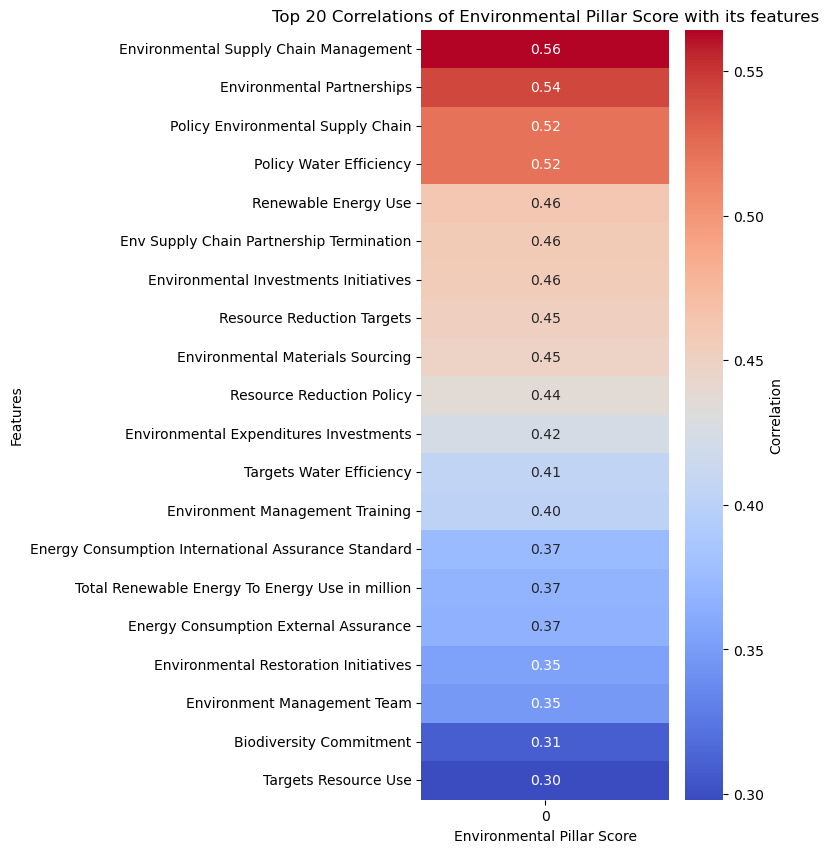


Top 20 features for Environmental Pillar Score:
Environmental Supply Chain Management                  0.564363
Environmental Partnerships                             0.542712
Policy Environmental Supply Chain                      0.521184
Policy Water Efficiency                                0.521142
Renewable Energy Use                                   0.461755
Env Supply Chain Partnership Termination               0.457501
Environmental Investments Initiatives                  0.456527
Resource Reduction Targets                             0.452775
Environmental Materials Sourcing                       0.448078
Resource Reduction Policy                              0.437392
Environmental Expenditures Investments                 0.423467
Targets Water Efficiency                               0.405726
Environment Management Training                        0.402828
Energy Consumption International Assurance Standard    0.374638
Total Renewable Energy To Energy Use in million        

In [53]:
corr_results = {}

for target, feats in target_cols.items():
    corr_dict = {}
    for feat in feats:
        if pd.api.types.is_numeric_dtype(filtered_table[feat]):
            valid = filtered_table[[feat, target]].dropna()
            if len(valid) > 2:
                corr_dict[feat] = valid[feat].corr(valid[target])
            else:
                corr_dict[feat] = np.nan
    corr_results[target] = pd.Series(corr_dict)

# Ploting heatmap for each pillar (top 20 features only)
top_n = 20
for target, corr_series in corr_results.items():
    sorted_corr = corr_series.dropna().sort_values(key=abs, ascending=False).head(top_n)
    plt.figure(figsize=(4, max(6, len(sorted_corr) // 2)))
    sns.heatmap(
        sorted_corr.values.reshape(-1, 1), 
        annot=True, fmt=".2f",
        yticklabels=sorted_corr.index, cmap='coolwarm',
        cbar_kws={'label': 'Correlation'}
    )
    plt.title(f"Top {top_n} Correlations of {target} with its features")
    plt.ylabel('Features')
    plt.xlabel(target)
    plt.tight_layout()
    plt.show()
    print(f"\nTop {top_n} features for {target}:")
    print(sorted_corr.head(top_n))


In [ ]:
numeric_cols = filtered_table.select_dtypes(include=[np.number]).columns


features_only = [col for col in numeric_cols if col not in target_cols.keys()]
# corr_matrix = imputed_table[features_only].corr()

corr_matrix = filtered_table[numeric_cols].corr()

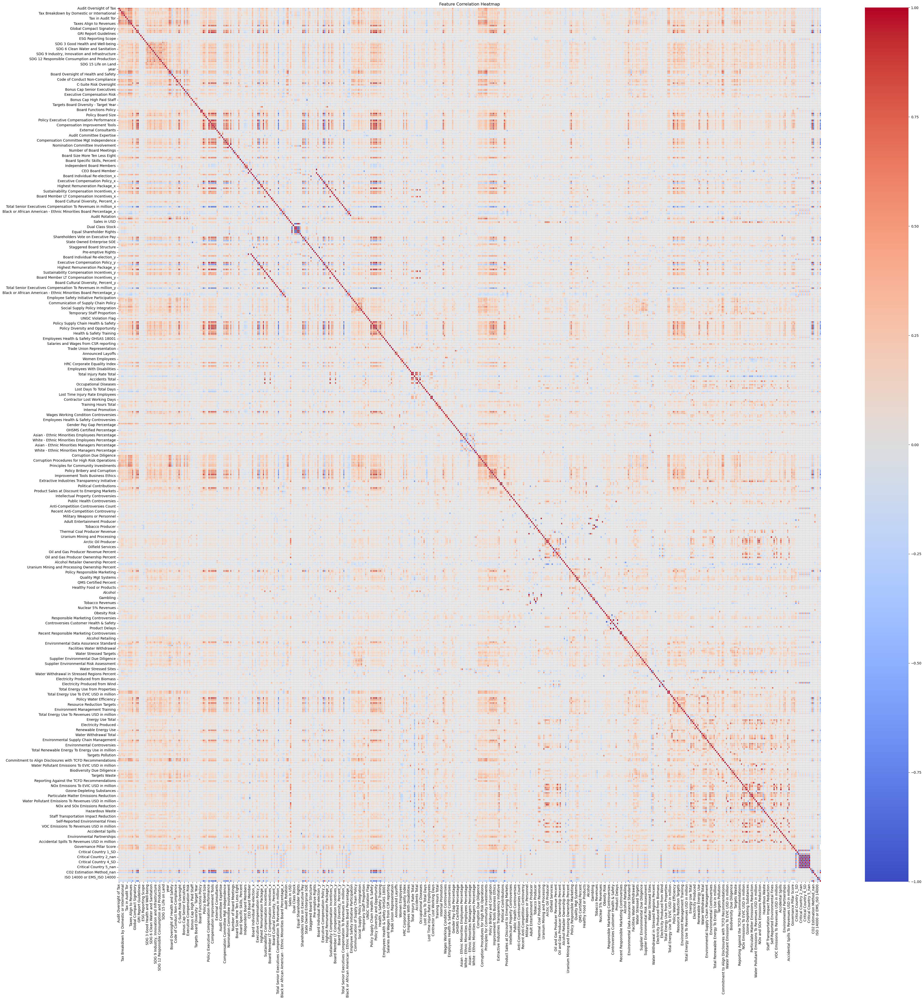

In [55]:
plt.figure(figsize=(min(40, len(numeric_cols)//2), min(40, len(numeric_cols)//2)))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Feature Correlation Heatmap')
plt.tight_layout()
plt.show()


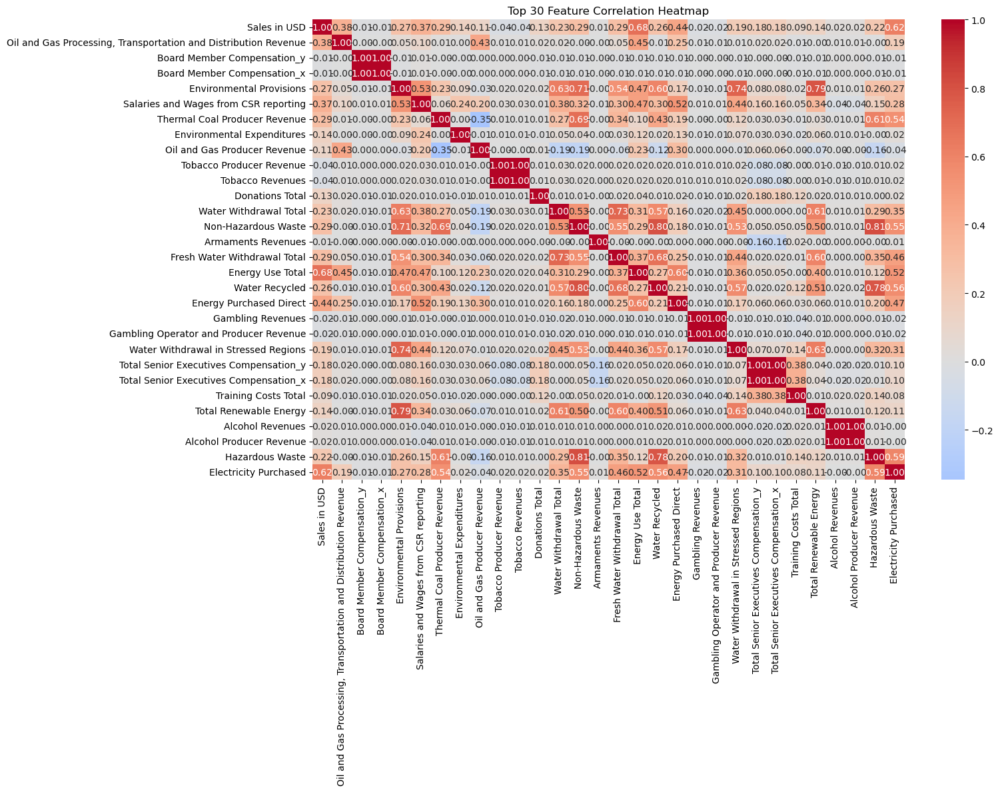

In [ ]:
# Ploting only top 30 features by variance
top_n = 30
top_features = filtered_table[numeric_cols].var().sort_values(ascending=False).head(top_n).index
corr_matrix_top = filtered_table[top_features].corr()

plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix_top, annot=True, fmt='.2f', cmap='coolwarm', center=0)
plt.title('Top 30 Feature Correlation Heatmap')
plt.tight_layout()
plt.show()


In [57]:
filtered_table

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,Critical Country 5_IR,Critical Country 5_nan,CO2 Estimation Method_Median,CO2 Estimation Method_Reported,CO2 Estimation Method_nan,ISO 14000 or EMS_Both,ISO 14000 or EMS_EMS,ISO 14000 or EMS_ISO 14000,ISO 14000 or EMS_No,ISO 14000 or EMS_nan
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,1,0,0,0,0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,1,0,0,0,0,0,1,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,1,0,0,0,0,0,1,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
515,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
517,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0


In [58]:
# to compute the full correlation matrix
corr_matrix = filtered_table.select_dtypes(include=[np.number]).corr().abs()

# we set self-correlations to zero so we don't accidentally drop a feature for being "identical to itself"
np.fill_diagonal(corr_matrix.values, 0)

# Finds columns with any correlation > 0.95
to_drop = set()
for col in corr_matrix.columns:
    # If this column is highly correlated with any later column, mark it for dropping
    high_corr = corr_matrix[col][corr_matrix[col] > 0.95].index
    to_drop.update(high_corr)

print(f"Dropping {len(to_drop)} highly correlated features:\n", to_drop)

reduced_table = filtered_table.drop(columns=to_drop)


Dropping 124 highly correlated features:
 {'Corporate Governance Board Committee', 'Executive Members Gender Diversity, Percent_x', 'Other - Ethnic Minorities Board Percentage_x', 'Policy Employee Health & Safety', 'Total Hazardous Waste To EVIC USD in million', 'CEO Chairman Duality', 'Controversies Customer Health & Safety', 'Flaring Gases To EVIC USD in million', 'Highest Remuneration Package_y', 'Product Delays', 'Ethnic Minorities Board Percentage_x', 'Employee Lost Working Days', 'Board Member Affiliations_x', 'Board Cultural Diversity, Percent_y', 'Chairman is ex-CEO_y', 'Mgt Compensation Controversies Count_x', 'Nomination Committee Independence', 'Total Senior Executives Compensation To Revenues in million_x', 'Donations Total', 'CEO Compensation Link to TSR_y', 'Policy Equal Voting Right', 'Compensation Improvement Tools', 'Total Donations To Revenues in million', 'Executive Compensation LT Objectives_y', 'Equal Voting Rights', 'White - Ethnic Minorities Board Percentage_y', 

In [59]:
filtered_table.columns

Index(['Audit Oversight of Tax', 'Named Position for Tax Oversight',
       'Tax Breakdown by Country',
       'Tax Breakdown by Domestic or International', 'Tax Data Verification',
       'Tax Fairness Commitment', 'Tax in Audit Tor', 'Tax Oversight by Board',
       'Policy Tax Transparency', 'Taxes Align to Revenues',
       ...
       'Critical Country 5_IR', 'Critical Country 5_nan',
       'CO2 Estimation Method_Median', 'CO2 Estimation Method_Reported',
       'CO2 Estimation Method_nan', 'ISO 14000 or EMS_Both',
       'ISO 14000 or EMS_EMS', 'ISO 14000 or EMS_ISO 14000',
       'ISO 14000 or EMS_No', 'ISO 14000 or EMS_nan'],
      dtype='object', length=516)

In [60]:
reduced_table

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,Critical Country 1_CU,Critical Country 1_SD,Critical Country 1_nan,CO2 Estimation Method_Median,CO2 Estimation Method_nan,ISO 14000 or EMS_Both,ISO 14000 or EMS_EMS,ISO 14000 or EMS_ISO 14000,ISO 14000 or EMS_No,ISO 14000 or EMS_nan
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,1,0,0,0,0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,1,0,0,0,0,1,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,1,0,0,0,0,1,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,0,0,1,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,0,0,1,0
515,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,0,0,1,0
516,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,0,0,1,0
517,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,0,0,1,0


In [61]:
reduced_table.describe()

,Audit Oversight of Tax,Named Position for Tax Oversight,Tax Breakdown by Country,Tax Breakdown by Domestic or International,Tax Data Verification,Tax Fairness Commitment,Tax in Audit Tor,Tax Oversight by Board,Policy Tax Transparency,Taxes Align to Revenues,...,Critical Country 1_CU,Critical Country 1_SD,Critical Country 1_nan,CO2 Estimation Method_Median,CO2 Estimation Method_nan,ISO 14000 or EMS_Both,ISO 14000 or EMS_EMS,ISO 14000 or EMS_ISO 14000,ISO 14000 or EMS_No,ISO 14000 or EMS_nan
count,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,...,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000
mean,0.375723,0.296724,0.208092,0.238921,0.148362,0.269750,0.157996,0.448940,0.485549,0.406551,...,0.019268,0.009634,0.971098,0.025048,0.096339,0.013487,0.011561,0.468208,0.421965,0.084778
std,0.484776,0.457255,0.406335,0.426836,0.355802,0.444258,0.365089,0.497866,0.500273,0.491664,...,0.137597,0.097773,0.167692,0.156422,0.295340,0.115461,0.107000,0.499470,0.494350,0.278820
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [62]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

In [63]:
#
gov_env_overlap = set(gov_cols) & set(env_cols)
gov_soc_overlap = set(gov_cols) & set(soc_cols)
# Find intersection between gov_cols, soc_cols, env_cols
gov_soc_env_overlap = set(gov_cols) & set(soc_cols) & set(env_cols)
print(f"Governance-Social Overlap: {gov_soc_overlap}")

Governance-Social Overlap: {'Instrument', 'year'}


In [68]:
# Governance
gov_cols_in_table = [c for c in gov_cols if c in reduced_table.columns]
X_gov = reduced_table[gov_cols_in_table].copy()
y_gov = reduced_table["Governance Pillar Score"].copy()
mask_gov = y_gov.notnull()
X_gov = X_gov.loc[mask_gov]
y_gov = y_gov.loc[mask_gov]

# Social
soc_cols_in_table = [c for c in soc_cols if c in reduced_table.columns]
X_soc = reduced_table[soc_cols_in_table].copy()
y_soc = reduced_table["Social Pillar Score"].copy()
mask_soc = y_soc.notnull()
X_soc = X_soc.loc[mask_soc]
y_soc = y_soc.loc[mask_soc]

# Environment
env_cols_in_table = [c for c in env_cols if c in reduced_table.columns]
X_env = reduced_table[env_cols_in_table].copy()
y_env = reduced_table["Environmental Pillar Score"].copy()
mask_env = y_env.notnull()
X_env = X_env.loc[mask_env]
y_env = y_env.loc[mask_env]

In [69]:
# Governance
y_gov = reduced_table["Governance Pillar Score"].copy()
mask_gov = y_gov.notnull()
X_gov = X_gov.loc[mask_gov]
y_gov = y_gov.loc[mask_gov]
if "Governance Pillar Score" in X_gov.columns:
    X_gov = X_gov.drop(columns=["Governance Pillar Score"])
X_gov_train, X_gov_test, y_gov_train, y_gov_test = train_test_split(
    X_gov, y_gov, test_size=0.2, random_state=42
)

# Social
y_soc = reduced_table["Social Pillar Score"].copy()
mask_soc = y_soc.notnull()
X_soc = X_soc.loc[mask_soc]
y_soc = y_soc.loc[mask_soc]
if "Social Pillar Score" in X_soc.columns:
    X_soc = X_soc.drop(columns=["Social Pillar Score"])
X_soc_train, X_soc_test, y_soc_train, y_soc_test = train_test_split(
    X_soc, y_soc, test_size=0.2, random_state=42
)

# Environment
y_env = reduced_table["Environmental Pillar Score"].copy()
mask_env = y_env.notnull()
X_env = X_env.loc[mask_env]
y_env = y_env.loc[mask_env]
if "Environmental Pillar Score" in X_env.columns:
    X_env = X_env.drop(columns=["Environmental Pillar Score"])
X_env_train, X_env_test, y_env_train, y_env_test = train_test_split(
    X_env, y_env, test_size=0.2, random_state=42
)

In [70]:
print(X_gov.shape)
print(X_gov_train.shape)

(475, 104)
(380, 104)


In [71]:
x_govvif = X_gov.copy()
y_govvif = y_gov.copy()

In [72]:
import numpy as np, pandas as pd, statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV
from sklearn.metrics import r2_score, root_mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor


In [73]:
x_govvif = X_gov.copy()
y_govvif = y_gov.copy()

# Encoding year with a base level to avoid dummy trap
X_gov = x_govvif.copy()
if 'year' in X_gov.columns:
    X_gov = pd.get_dummies(X_gov, columns=['year'], drop_first=True)

#  Aligning to rows with target
mask_gov = y_govvif.notna()
X_gov = X_gov.loc[mask_gov].copy()
y_gov = y_govvif.loc[mask_gov].copy()

#  Split the data first
Xtr_gov_raw, Xte_gov_raw, ytr_gov, yte_gov = train_test_split(X_gov, y_gov, test_size=0.2, random_state=42)

#  Detect binary after split and encoding
def is_binary_gov(s: pd.Series) -> bool:
    u = pd.unique(s.dropna())
    return set(u).issubset({0, 1})

bin_cols_gov = [c for c in Xtr_gov_raw.columns if is_binary_gov(Xtr_gov_raw[c])]
num_cols_gov = [c for c in Xtr_gov_raw.columns if c not in bin_cols_gov]

# Impute and scale consistently
imp_num_gov = SimpleImputer(strategy='median')
imp_bin_gov = SimpleImputer(strategy='most_frequent')
scaler_gov = StandardScaler()

Xtr_gov_num = pd.DataFrame(imp_num_gov.fit_transform(Xtr_gov_raw[num_cols_gov]), columns=num_cols_gov, index=Xtr_gov_raw.index)
Xte_gov_num = pd.DataFrame(imp_num_gov.transform(Xte_gov_raw[num_cols_gov]), columns=num_cols_gov, index=Xte_gov_raw.index)
Xtr_gov_num.loc[:, :] = scaler_gov.fit_transform(Xtr_gov_num.values)
Xte_gov_num.loc[:, :] = scaler_gov.transform(Xte_gov_num.values)

Xtr_gov_bin = pd.DataFrame(imp_bin_gov.fit_transform(Xtr_gov_raw[bin_cols_gov]), columns=bin_cols_gov, index=Xtr_gov_raw.index)
Xte_gov_bin = pd.DataFrame(imp_bin_gov.transform(Xte_gov_raw[bin_cols_gov]), columns=bin_cols_gov, index=Xte_gov_raw.index)

Xtr_gov_clean = pd.concat([Xtr_gov_num, Xtr_gov_bin], axis=1)
Xte_gov_clean = pd.concat([Xte_gov_num, Xte_gov_bin], axis=1)

# Dropping zero variance and duplicates on train, mirror to test
stds_gov = Xtr_gov_clean.std(ddof=0)
keep_gov = stds_gov[stds_gov > 0].index.tolist()
Xtr_gov_clean = Xtr_gov_clean[keep_gov]
Xte_gov_clean = Xte_gov_clean[keep_gov]
Xtr_gov_clean = Xtr_gov_clean.loc[:, ~Xtr_gov_clean.T.duplicated()]
Xte_gov_clean = Xte_gov_clean[Xtr_gov_clean.columns]

# VIF with constant and iterative trimming
def vif_table_gov(df_num: pd.DataFrame) -> pd.DataFrame:
    exog = sm.add_constant(df_num, has_constant='add')
    arr = exog.values.astype(float)
    names = df_num.columns.tolist()
    vifs = [variance_inflation_factor(arr, i+1) for i in range(df_num.shape[1])]
    return pd.DataFrame({'feature': names, 'VIF': vifs})

def drop_until_vif_gov(df_num: pd.DataFrame, cap=8.0):
    df = df_num.copy()
    while True:
        vdf = vif_table_gov(df).sort_values('VIF', ascending=False)
        if vdf['VIF'].iloc[0] <= cap or len(df.columns) <= 1:
            return df, vdf
        worst = vdf.iloc[0]['feature']
        df = df.drop(columns=[worst])

Xtr_gov_vif, vif_gov_final = drop_until_vif_gov(Xtr_gov_clean, cap=8.0)
Xte_gov_vif = Xte_gov_clean[Xtr_gov_vif.columns]

# Sanity check conditioning
_, s_gov, _ = np.linalg.svd(Xtr_gov_vif.values, full_matrices=False)
print('Condition number:', float(s_gov.max() / s_gov.min()))
print('Columns kept:', len(Xtr_gov_vif.columns))

# Fit models with hyperparameters (GOVERNANCE) and renaming to avoid confusion
gov_lr = LinearRegression().fit(Xtr_gov_vif, ytr_gov)
y_pred_gov_ols = gov_lr.predict(Xte_gov_vif)

gov_lasso = LassoCV(
    alphas=np.logspace(-4, 2, 200),
    cv=10,
    random_state=42,
    max_iter=200000,
    n_jobs=-1
).fit(Xtr_gov_vif, ytr_gov)
y_pred_gov_lasso_hypertuned = gov_lasso.predict(Xte_gov_vif)

gov_ridge = RidgeCV(
    alphas=np.logspace(-4, 4, 200),
    cv=10,
    scoring='neg_mean_squared_error'
).fit(Xtr_gov_vif, ytr_gov)
y_pred_gov_ridge_hypertuned = gov_ridge.predict(Xte_gov_vif)

# Backward-compat (to keep old names if used elsewhere)
lr_gov = gov_lr
lasso_gov = gov_lasso
ridge_gov = gov_ridge
y_pred_ols_gov = y_pred_gov_ols
y_pred_lasso_gov_hypertuned = y_pred_gov_lasso_hypertuned
y_pred_ridge_gov_hypertuned = y_pred_gov_ridge_hypertuned

# Reporting with GOV tags
gov_tag = "[GOV]"
for name, pred in [
    (f"{gov_tag} OLS", y_pred_gov_ols),
    (f"{gov_tag} LassoCV (alpha={gov_lasso.alpha_:.5f})", y_pred_gov_lasso_hypertuned),
    (f"{gov_tag} RidgeCV (alpha={gov_ridge.alpha_:.5f})", y_pred_gov_ridge_hypertuned),
]:
    print(f'{name}: R2={r2_score(yte_gov, pred):.3f}, RMSE={float(root_mean_squared_error(yte_gov, pred)):.3f}')


Condition number: 208.24406791472117
Columns kept: 99
[GOV] OLS: R2=0.614, RMSE=11.097
[GOV] LassoCV (alpha=0.05941): R2=0.674, RMSE=10.192
[GOV] RidgeCV (alpha=6.08022): R2=0.676, RMSE=10.173


In [74]:
# RandomForest search space for Governance
# Fix: we use scipy.stats distributions for RandomizedSearchCV
from scipy.stats import randint, uniform, loguniform

from sklearn.model_selection import RandomizedSearchCV

rf_gov_params = {
    'n_estimators': randint(200, 1200),
    'max_depth': randint(2, 30),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10),
    'max_features': uniform(0.2, 0.8),
    'bootstrap': [True, False]
}
rf_gov_base = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_gov_search = RandomizedSearchCV(
    rf_gov_base,
    rf_gov_params,
    n_iter=60,
    scoring='neg_root_mean_squared_error',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
rf_gov_search.fit(Xtr_gov_vif, ytr_gov)
rf_gov = rf_gov_search.best_estimator_

# XGBoost search space for Governance
xgb_gov_params = {
    'n_estimators': randint(200, 1200),
    'learning_rate': loguniform(1e-3, 3e-1),
    'max_depth': randint(2, 12),
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5),
    'min_child_weight': randint(1, 10),
    'reg_lambda': loguniform(1e-3, 10.0),
    'reg_alpha': loguniform(1e-4, 1.0),
    'gamma': loguniform(1e-4, 1.0),
}
xgb_gov_base = XGBRegressor(random_state=42, tree_method='hist')
xgb_gov_search = RandomizedSearchCV(
    xgb_gov_base,
    xgb_gov_params,
    n_iter=60,
    scoring='neg_root_mean_squared_error',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
xgb_gov_search.fit(Xtr_gov_vif, ytr_gov)
xgb_gov = xgb_gov_search.best_estimator_

# 9) Evaluate tuned models
for name, model, search in [
    ('RandomForest_GOV', rf_gov, rf_gov_search),
    ('XGBoost_GOV', xgb_gov, xgb_gov_search),
]:
    pred = model.predict(Xte_gov_vif)
    r2 = r2_score(yte_gov, pred)
    rmse = root_mean_squared_error(yte_gov, pred)
    cv_rmse = -search.best_score_
    print(f'\n{name} best params: {search.best_params_}')
    print(f'{name} CV RMSE: {cv_rmse:.3f}')
    print(f'{name}: R2={r2:.3f}, Test RMSE={rmse:.3f}')


Fitting 5 folds for each of 60 candidates, totalling 300 fits
Fitting 5 folds for each of 60 candidates, totalling 300 fits

RandomForest_GOV best params: {'bootstrap': False, 'max_depth': 26, 'max_features': 0.2371603301759982, 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 220}
RandomForest_GOV CV RMSE: 9.577
RandomForest_GOV: R2=0.679, Test RMSE=10.114

XGBoost_GOV best params: {'colsample_bytree': 0.5257393756249946, 'gamma': 0.0013019246714361576, 'learning_rate': 0.1777807487915871, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 252, 'reg_alpha': 0.00907425628898386, 'reg_lambda': 8.761971101023693, 'subsample': 0.6210276357557503}
XGBoost_GOV CV RMSE: 8.731
XGBoost_GOV: R2=0.707, Test RMSE=9.663


In [75]:
x_socvif = X_soc.copy()
y_socvif = y_soc.copy()

# 0) Encode year with a base level to avoid dummy trap
X_soc = x_socvif.copy()
if 'year' in X_soc.columns:
    X_soc = pd.get_dummies(X_soc, columns=['year'], drop_first=True)

# 1) Align to rows with target
mask_soc = y_socvif.notna()
X_soc = X_soc.loc[mask_soc].copy()
y_soc = y_socvif.loc[mask_soc].copy()

# Split first
Xtr_soc_raw, Xte_soc_raw, ytr_soc, yte_soc = train_test_split(X_soc, y_soc, test_size=0.2, random_state=42)

# Detect binary after split and encoding
def is_binary_soc(s: pd.Series) -> bool:
    u = pd.unique(s.dropna())
    return set(u).issubset({0, 1})

bin_cols_soc = [c for c in Xtr_soc_raw.columns if is_binary_soc(Xtr_soc_raw[c])]
num_cols_soc = [c for c in Xtr_soc_raw.columns if c not in bin_cols_soc]

# Impute and scale consistently
imp_num_soc = SimpleImputer(strategy='median')
imp_bin_soc = SimpleImputer(strategy='most_frequent')
scaler_soc = StandardScaler()

Xtr_soc_num = pd.DataFrame(imp_num_soc.fit_transform(Xtr_soc_raw[num_cols_soc]), columns=num_cols_soc, index=Xtr_soc_raw.index)
Xte_soc_num = pd.DataFrame(imp_num_soc.transform(Xte_soc_raw[num_cols_soc]), columns=num_cols_soc, index=Xte_soc_raw.index)
Xtr_soc_num.loc[:, :] = scaler_soc.fit_transform(Xtr_soc_num.values)
Xte_soc_num.loc[:, :] = scaler_soc.transform(Xte_soc_num.values)

Xtr_soc_bin = pd.DataFrame(imp_bin_soc.fit_transform(Xtr_soc_raw[bin_cols_soc]), columns=bin_cols_soc, index=Xtr_soc_raw.index)
Xte_soc_bin = pd.DataFrame(imp_bin_soc.transform(Xte_soc_raw[bin_cols_soc]), columns=bin_cols_soc, index=Xte_soc_raw.index)

Xtr_soc_clean = pd.concat([Xtr_soc_num, Xtr_soc_bin], axis=1)
Xte_soc_clean = pd.concat([Xte_soc_num, Xte_soc_bin], axis=1)

# 5) Drop zero variance and duplicates on train, mirror to test
stds_soc = Xtr_soc_clean.std(ddof=0)
keep_soc = stds_soc[stds_soc > 0].index.tolist()
Xtr_soc_clean = Xtr_soc_clean[keep_soc]
Xte_soc_clean = Xte_soc_clean[keep_soc]
Xtr_soc_clean = Xtr_soc_clean.loc[:, ~Xtr_soc_clean.T.duplicated()]
Xte_soc_clean = Xte_soc_clean[Xtr_soc_clean.columns]

# 6) VIF with constant and iterative trimming
def vif_table_soc(df_num: pd.DataFrame) -> pd.DataFrame:
    exog = sm.add_constant(df_num, has_constant='add')
    arr = exog.values.astype(float)
    names = df_num.columns.tolist()
    vifs = [variance_inflation_factor(arr, i+1) for i in range(df_num.shape[1])]
    return pd.DataFrame({'feature': names, 'VIF': vifs})

def drop_until_vif_soc(df_num: pd.DataFrame, cap=8.0):
    df = df_num.copy()
    while True:
        vdf = vif_table_soc(df).sort_values('VIF', ascending=False)
        if vdf['VIF'].iloc[0] <= cap or len(df.columns) <= 1:
            return df, vdf
        worst = vdf.iloc[0]['feature']
        df = df.drop(columns=[worst])

Xtr_soc_vif, vif_soc_final = drop_until_vif_soc(Xtr_soc_clean, cap=8.0)
Xte_soc_vif = Xte_soc_clean[Xtr_soc_vif.columns]

# 7) Sanity check conditioning
_, s_soc, _ = np.linalg.svd(Xtr_soc_vif.values, full_matrices=False)
print('Condition number:', float(s_soc.max() / s_soc.min()))
print('Columns kept:', len(Xtr_soc_vif.columns))

# 8) Fit models with hyperparameters (SOCIAL) and rename to avoid confusion
soc_lr = LinearRegression().fit(Xtr_soc_vif, ytr_soc)
y_pred_soc_ols = soc_lr.predict(Xte_soc_vif)

soc_lasso = LassoCV(
    alphas=np.logspace(-4, 2, 200),
    cv=10,
    random_state=42,
    max_iter=200000,
    n_jobs=-1
).fit(Xtr_soc_vif, ytr_soc)
y_pred_soc_lasso_hypertuned = soc_lasso.predict(Xte_soc_vif)

soc_ridge = RidgeCV(
    alphas=np.logspace(-4, 4, 200),
    cv=10,
    scoring='neg_mean_squared_error'
).fit(Xtr_soc_vif, ytr_soc)
y_pred_soc_ridge_hypertuned = soc_ridge.predict(Xte_soc_vif)

# Backward-compat (keep old names if used elsewhere)
lr_soc = soc_lr
lasso_soc = soc_lasso
ridge_soc = soc_ridge
y_pred_ols_soc = y_pred_soc_ols
y_pred_lasso_soc_hypertuned = y_pred_soc_lasso_hypertuned
y_pred_ridge_soc_hypertuned = y_pred_soc_ridge_hypertuned

# Report with clear SOC tags
soc_tag = "[SOC]"
for name, pred in [
    (f"{soc_tag} OLS", y_pred_soc_ols),
    (f"{soc_tag} LassoCV (alpha={soc_lasso.alpha_:.5f})", y_pred_soc_lasso_hypertuned),
    (f"{soc_tag} RidgeCV (alpha={soc_ridge.alpha_:.5f})", y_pred_soc_ridge_hypertuned),
]:
    print(f'{name}: R2={r2_score(yte_soc, pred):.3f}, RMSE={float(root_mean_squared_error(yte_soc, pred)):.3f}')


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


Condition number: 142.16092925558402
Columns kept: 151
[SOC] OLS: R2=0.577, RMSE=11.425
[SOC] LassoCV (alpha=0.10353): R2=0.715, RMSE=9.371
[SOC] RidgeCV (alpha=20.25502): R2=0.644, RMSE=10.481


In [76]:
# RandomForest search space for Social
rf_soc_params = {
    'n_estimators': randint(200, 1200),
    'max_depth': randint(2, 30),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10),
    'max_features': uniform(0.2, 0.8),
    'bootstrap': [True, False]
}
rf_soc_base = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_soc_search = RandomizedSearchCV(
    rf_soc_base,
    rf_soc_params,
    n_iter=60,
    scoring='neg_root_mean_squared_error',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
rf_soc_search.fit(Xtr_soc_vif, ytr_soc)
rf_soc = rf_soc_search.best_estimator_

# XGBoost search space for Social
xgb_soc_params = {
    'n_estimators': randint(200, 1200),
    'learning_rate': loguniform(1e-3, 3e-1),
    'max_depth': randint(2, 12),
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5),
    'min_child_weight': randint(1, 10),
    'reg_lambda': loguniform(1e-3, 10.0),
    'reg_alpha': loguniform(1e-4, 1.0),
    'gamma': loguniform(1e-4, 1.0),
}
xgb_soc_base = XGBRegressor(random_state=42, tree_method='hist')
xgb_soc_search = RandomizedSearchCV(
    xgb_soc_base,
    xgb_soc_params,
    n_iter=60,
    scoring='neg_root_mean_squared_error',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
xgb_soc_search.fit(Xtr_soc_vif, ytr_soc)
xgb_soc = xgb_soc_search.best_estimator_

# 9) Evaluate tuned models
for name, model, search in [
    ('RandomForest_SOC', rf_soc, rf_soc_search),
    ('XGBoost_SOC', xgb_soc, xgb_soc_search),
]:
    pred = model.predict(Xte_soc_vif)
    r2 = r2_score(yte_soc, pred)
    rmse = root_mean_squared_error(yte_soc, pred)
    cv_rmse = -search.best_score_
    print(f'\n{name} best params: {search.best_params_}')
    print(f'{name} CV RMSE: {cv_rmse:.3f}')
    print(f'{name}: R2={r2:.3f}, Test RMSE={rmse:.3f}')


Fitting 5 folds for each of 60 candidates, totalling 300 fits
Fitting 5 folds for each of 60 candidates, totalling 300 fits

RandomForest_SOC best params: {'bootstrap': False, 'max_depth': 9, 'max_features': 0.41977743439205134, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 938}
RandomForest_SOC CV RMSE: 7.447
RandomForest_SOC: R2=0.839, Test RMSE=7.051

XGBoost_SOC best params: {'colsample_bytree': 0.6831809216468459, 'gamma': 0.006672367170464205, 'learning_rate': 0.08810003129071789, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 443, 'reg_alpha': 0.0234238498471129, 'reg_lambda': 0.0015339162591163618, 'subsample': 0.8037724259507192}
XGBoost_SOC CV RMSE: 6.600
XGBoost_SOC: R2=0.848, Test RMSE=6.839


In [77]:
x_envvif = X_env.copy()
y_envvif = y_env.copy()

# Encode year with a base level to avoid dummy trap
X_env = x_envvif.copy()
if 'year' in X_env.columns:
    X_env = pd.get_dummies(X_env, columns=['year'], drop_first=True)

# Align to rows with target
mask_env = y_envvif.notna()
X_env = X_env.loc[mask_env].copy()
y_env = y_envvif.loc[mask_env].copy()

# Split first
Xtr_env_raw, Xte_env_raw, ytr_env, yte_env = train_test_split(X_env, y_env, test_size=0.2, random_state=42)

# Detect binary after split and encoding
def is_binary_env(s: pd.Series) -> bool:
    u = pd.unique(s.dropna())
    return set(u).issubset({0, 1})

bin_cols_env = [c for c in Xtr_env_raw.columns if is_binary_env(Xtr_env_raw[c])]
num_cols_env = [c for c in Xtr_env_raw.columns if c not in bin_cols_env]

# Impute and scale consistently
imp_num_env = SimpleImputer(strategy='median')
imp_bin_env = SimpleImputer(strategy='most_frequent')
scaler_env = StandardScaler()

Xtr_env_num = pd.DataFrame(imp_num_env.fit_transform(Xtr_env_raw[num_cols_env]), columns=num_cols_env, index=Xtr_env_raw.index)
Xte_env_num = pd.DataFrame(imp_num_env.transform(Xte_env_raw[num_cols_env]), columns=num_cols_env, index=Xte_env_raw.index)
Xtr_env_num.loc[:, :] = scaler_env.fit_transform(Xtr_env_num.values)
Xte_env_num.loc[:, :] = scaler_env.transform(Xte_env_num.values)

Xtr_env_bin = pd.DataFrame(imp_bin_env.fit_transform(Xtr_env_raw[bin_cols_env]), columns=bin_cols_env, index=Xtr_env_raw.index)
Xte_env_bin = pd.DataFrame(imp_bin_env.transform(Xte_env_raw[bin_cols_env]), columns=bin_cols_env, index=Xte_env_raw.index)

Xtr_env_clean = pd.concat([Xtr_env_num, Xtr_env_bin], axis=1)
Xte_env_clean = pd.concat([Xte_env_num, Xte_env_bin], axis=1)

# Drop zero variance and duplicates on train, mirror to test
stds_env = Xtr_env_clean.std(ddof=0)
keep_env = stds_env[stds_env > 0].index.tolist()
Xtr_env_clean = Xtr_env_clean[keep_env]
Xte_env_clean = Xte_env_clean[keep_env]
Xtr_env_clean = Xtr_env_clean.loc[:, ~Xtr_env_clean.T.duplicated()]
Xte_env_clean = Xte_env_clean[Xtr_env_clean.columns]

# VIF with constant and iterative trimming
def vif_table_env(df_num: pd.DataFrame) -> pd.DataFrame:
    exog = sm.add_constant(df_num, has_constant='add')
    arr = exog.values.astype(float)
    names = df_num.columns.tolist()
    vifs = [variance_inflation_factor(arr, i+1) for i in range(df_num.shape[1])]
    return pd.DataFrame({'feature': names, 'VIF': vifs})

def drop_until_vif_env(df_num: pd.DataFrame, cap=8.0):
    df = df_num.copy()
    while True:
        vdf = vif_table_env(df).sort_values('VIF', ascending=False)
        if vdf['VIF'].iloc[0] <= cap or len(df.columns) <= 1:
            return df, vdf
        worst = vdf.iloc[0]['feature']
        df = df.drop(columns=[worst])

Xtr_env_vif, vif_env_final = drop_until_vif_env(Xtr_env_clean, cap=8.0)
Xte_env_vif = Xte_env_clean[Xtr_env_vif.columns]

# Sanity check conditioning
_, s_env, _ = np.linalg.svd(Xtr_env_vif.values, full_matrices=False)
print('Condition number:', float(s_env.max() / s_env.min()))
print('Columns kept:', len(Xtr_env_vif.columns))

#  models fitting with hyperparameters (ENVIRONMENTAL) and rename to avoid confusion
env_lr = LinearRegression().fit(Xtr_env_vif, ytr_env)
y_pred_env_ols = env_lr.predict(Xte_env_vif)

env_lasso = LassoCV(
    alphas=np.logspace(-4, 2, 200),
    cv=10,
    random_state=42,
    max_iter=200000,
    n_jobs=-1
).fit(Xtr_env_vif, ytr_env)
y_pred_env_lasso_hypertuned = env_lasso.predict(Xte_env_vif)

env_ridge = RidgeCV(
    alphas=np.logspace(-4, 4, 200),
    cv=10,
    scoring='neg_mean_squared_error'
).fit(Xtr_env_vif, ytr_env)
y_pred_env_ridge_hypertuned = env_ridge.predict(Xte_env_vif)

# Backward-compat (to keep old names if used elsewhere)
lr_env = env_lr
lasso_env = env_lasso
ridge_env = env_ridge
y_pred_ols_env = y_pred_env_ols
y_pred_lasso_env_hypertuned = y_pred_env_lasso_hypertuned
y_pred_ridge_env_hypertuned = y_pred_env_ridge_hypertuned

# Report with  ENV tags
env_tag = "[ENV]"
for name, pred in [
    (f"{env_tag} OLS", y_pred_env_ols),
    (f"{env_tag} LassoCV (alpha={env_lasso.alpha_:.5f})", y_pred_env_lasso_hypertuned),
    (f"{env_tag} RidgeCV (alpha={env_ridge.alpha_:.5f})", y_pred_env_ridge_hypertuned),
]:
    print(f'{name}: R2={r2_score(yte_env, pred):.3f}, RMSE={float(root_mean_squared_error(yte_env, pred)):.3f}')


Condition number: 60.137400839615495
Columns kept: 89
[ENV] OLS: R2=0.223, RMSE=18.893
[ENV] LassoCV (alpha=0.11895): R2=0.409, RMSE=16.475
[ENV] RidgeCV (alpha=16.83180): R2=0.424, RMSE=16.267


In [78]:
# RandomForest search space for Environment
rf_env_params = {
    'n_estimators': randint(200, 1200),
    'max_depth': randint(2, 30),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10),
    'max_features': uniform(0.2, 0.8),
    'bootstrap': [True, False]
}
rf_env_base = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_env_search = RandomizedSearchCV(
    rf_env_base,
    rf_env_params,
    n_iter=60,
    scoring='neg_root_mean_squared_error',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
rf_env_search.fit(Xtr_env_vif, ytr_env)
rf_env = rf_env_search.best_estimator_

# XGBoost search space for Environment
xgb_env_params = {
    'n_estimators': randint(200, 1200),
    'learning_rate': loguniform(1e-3, 3e-1),
    'max_depth': randint(2, 12),
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5),
    'min_child_weight': randint(1, 10),
    'reg_lambda': loguniform(1e-3, 10.0),
    'reg_alpha': loguniform(1e-4, 1.0),
    'gamma': loguniform(1e-4, 1.0),
}
xgb_env_base = XGBRegressor(random_state=42, tree_method='hist')
xgb_env_search = RandomizedSearchCV(
    xgb_env_base,
    xgb_env_params,
    n_iter=60,
    scoring='neg_root_mean_squared_error',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
xgb_env_search.fit(Xtr_env_vif, ytr_env)
xgb_env = xgb_env_search.best_estimator_

# Evaluate tuned models
for name, model, search in [
    ('RandomForest_ENV', rf_env, rf_env_search),
    ('XGBoost_ENV', xgb_env, xgb_env_search),
]:
    pred = model.predict(Xte_env_vif)
    r2 = r2_score(yte_env, pred)
    rmse = root_mean_squared_error(yte_env, pred)
    cv_rmse = -search.best_score_
    print(f'\n{name} best params: {search.best_params_}')
    print(f'{name} CV RMSE: {cv_rmse:.3f}')
    print(f'{name}: R2={r2:.3f}, Test RMSE={rmse:.3f}')


Fitting 5 folds for each of 60 candidates, totalling 300 fits
Fitting 5 folds for each of 60 candidates, totalling 300 fits

RandomForest_ENV best params: {'bootstrap': False, 'max_depth': 9, 'max_features': 0.41977743439205134, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 938}
RandomForest_ENV CV RMSE: 10.040
RandomForest_ENV: R2=0.677, Test RMSE=12.183

XGBoost_ENV best params: {'colsample_bytree': 0.520364401159485, 'gamma': 0.26414496454242237, 'learning_rate': 0.05534085180686909, 'max_depth': 11, 'min_child_weight': 5, 'n_estimators': 750, 'reg_alpha': 0.002427824470026098, 'reg_lambda': 0.07222628076034487, 'subsample': 0.8248868413213817}
XGBoost_ENV CV RMSE: 8.908
XGBoost_ENV: R2=0.683, Test RMSE=12.067


Predicted vs Actual scatter plots for recent models, grouped by Gov/Soc/Env


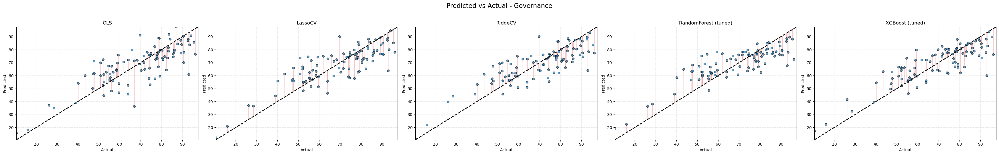

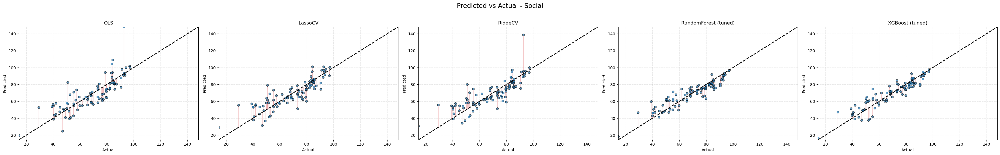

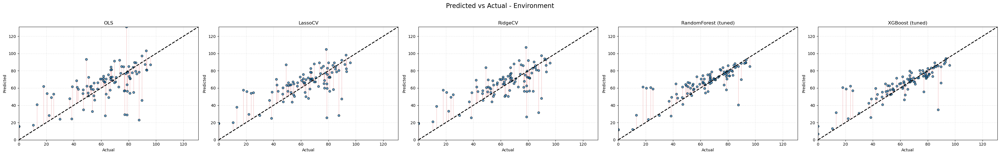

In [79]:

def make_preds_dict(y_true, Xte, models_spec):
    preds = {}
    for name, varnames in models_spec.items():
        for v in varnames:
            if v in globals():
                try:
                    p = globals()[v]
                    # If it's already a vector of predictions
                    if hasattr(p, 'shape') and len(getattr(p, 'shape', [])) == 1 and len(p) == len(y_true):
                        preds[name] = p
                        break
                    # Otherwise assume it's a model; predict
                    if hasattr(p, 'predict'):
                        preds[name] = p.predict(Xte)
                        break
                except Exception:
                    continue
    return preds

def plot_group(title, y_true, preds_dict):
    n = len(preds_dict)
    if n == 0:
        print(f"No predictions available for {title}.")
        return
    cols = min(5, n)
    rows = (n + cols - 1) // cols
   
    fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 5.5 * rows))
    axes = axes.flatten() if n > 1 else [axes]

    all_preds = np.concatenate([np.asarray(v).ravel() for v in preds_dict.values()])
    lo = float(min(np.asarray(y_true).min(), all_preds.min()))
    hi = float(max(np.asarray(y_true).max(), all_preds.max()))

    for ax, (name, y_pred) in zip(axes, preds_dict.items()):
        x = np.asarray(y_true).ravel()
        yhat = np.asarray(y_pred).ravel()

        # Residual lines from predicted to actual (vertical lines to the 45° line)
        ax.vlines(x, yhat, x, colors='tab:red', alpha=0.25, linewidth=1)

        ax.scatter(x, yhat, alpha=0.7, edgecolor='k', s=30, zorder=2)
        ax.plot([lo, hi], [lo, hi], 'k--', lw=2)  # 45° reference line
        ax.set_title(name)
        ax.set_xlabel('Actual')
        ax.set_ylabel('Predicted')
        ax.set_xlim(lo, hi)
        ax.set_ylim(lo, hi)
        ax.grid(True, linestyle='--', alpha=0.3)

    for j in range(len(preds_dict), len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(f"Predicted vs Actual - {title}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Governance
gov_models_spec = {
    "OLS": ["y_pred_gov_ols", "lr_gov", "gov_lr"],
    "LassoCV": ["y_pred_lasso_gov_hypertuned", "lasso_gov", "gov_lasso"],
    "RidgeCV": ["y_pred_ridge_gov_hypertuned", "ridge_gov", "gov_ridge"],
    "RandomForest (tuned)": ["rf_gov"],
    "XGBoost (tuned)": ["xgb_gov"],
}
gov_preds = make_preds_dict(yte_gov, Xte_gov_vif, gov_models_spec)
plot_group("Governance", yte_gov, gov_preds)

# Social
soc_models_spec = {
    "OLS": ["y_pred_soc_ols", "lr_soc"],
    "LassoCV": ["y_pred_lasso_soc_hypertuned", "lasso_soc"],
    "RidgeCV": ["y_pred_soc_ridge_hypertuned", "ridge_soc"],
    "RandomForest (tuned)": ["rf_soc"],
    "XGBoost (tuned)": ["xgb_soc"],
}
soc_preds = make_preds_dict(yte_soc, Xte_soc_vif, soc_models_spec)
plot_group("Social", yte_soc, soc_preds)

# Environment
env_models_spec = {
    "OLS": ["y_pred_env_ols", "lr_env"],
    "LassoCV": ["y_pred_lasso_env_hypertuned", "lasso_env"],
    "RidgeCV": ["y_pred_ridge_env_hypertuned", "ridge_env"],
    "RandomForest (tuned)": ["rf_env"],
    "XGBoost (tuned)": ["xgb_env"],
}
env_preds = make_preds_dict(yte_env, Xte_env_vif, env_models_spec)
plot_group("Environment", yte_env, env_preds)

In [80]:
# Test-set bootstrap CIs + paired permutation tests (Gov/Soc/Env)
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error

rng = np.random.default_rng(42)

def rmse(y_true, y_pred):
    return float(np.sqrt(mean_squared_error(y_true, y_pred)))

def bootstrap_ci(y_true, y_pred, metric_fn, n_boot=2000, ci=0.95, random_state=42):
    rng = np.random.default_rng(random_state)
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    n = len(y_true)
    stats = np.empty(n_boot, dtype=float)
    idx = np.arange(n)
    for b in range(n_boot):
        bs = rng.choice(idx, size=n, replace=True)
        stats[b] = metric_fn(y_true[bs], y_pred[bs])
    lo = np.quantile(stats, (1 - ci) / 2)
    hi = np.quantile(stats, 1 - (1 - ci) / 2)
    return float(np.mean(stats)), float(lo), float(hi)

def paired_permutation_test(y_true, pred_a, pred_b, metric_fn, n_perm=5000, higher_is_better=True, random_state=42):
    """
    Test H0: models are indistinguishable. For each permutation, randomly swap predictions for each sample.
    Returns (observed_delta, p_value) where delta is in the 'better-is-higher' sense.
    """
    rng = np.random.default_rng(random_state)
    y = np.asarray(y_true).ravel()
    a = np.asarray(pred_a).ravel()
    b = np.asarray(pred_b).ravel()

    def score_diff(pa, pb):
        sa = metric_fn(y, pa)
        sb = metric_fn(y, pb)
        return (sa - sb) if higher_is_better else (sb - sa)  # positive => A better

    obs = score_diff(a, b)

    n = len(y)
    ge = 0
    for _ in range(n_perm):
        swap = rng.integers(0, 2, size=n, dtype=bool)
        pa = np.where(swap, b, a)
        pb = np.where(swap, a, b)
        perm_diff = score_diff(pa, pb)
        if perm_diff >= obs:
            ge += 1
    pval = (ge + 1) / (n_perm + 1)
    return float(obs), float(pval)

def summarize_group(title, y_true, Xte, preds_dict, ci=0.95, n_boot=2000, n_perm=5000):
    if y_true is None or len(np.asarray(y_true)) == 0 or len(preds_dict) == 0:
        print(f"[{title}] Missing data or predictions.")
        return

    print(f"\n=== {title} | Test set: n={len(y_true)} samples ===")
    results = {}
    for name, yhat in preds_dict.items():
        yhat = np.asarray(yhat).ravel()
        r2_m, r2_lo, r2_hi = bootstrap_ci(y_true, yhat, r2_score, n_boot=n_boot, ci=ci, random_state=42)
        rm_m, rm_lo, rm_hi = bootstrap_ci(y_true, yhat, rmse, n_boot=n_boot, ci=ci, random_state=42)
        results[name] = {
            "R2": (r2_m, r2_lo, r2_hi),
            "RMSE": (rm_m, rm_lo, rm_hi)
        }
        print(f"- {name}: R² = {r2_m:.3f} [{r2_lo:.3f}–{r2_hi:.3f}], RMSE = {rm_m:.3f} [{rm_lo:.3f}–{rm_hi:.3f}]")

    # Identify best linear and best ensemble by RMSE
    linear_names = [n for n in results if "OLS" in n or "Lasso" in n or "Ridge" in n]
    ensemble_names = [n for n in results if "RandomForest" in n or "XGBoost" in n]

    if len(linear_names) and len(ensemble_names):
        best_linear = min(linear_names, key=lambda n: results[n]["RMSE"][0])
        best_ens = min(ensemble_names, key=lambda n: results[n]["RMSE"][0])

        print(f"\n[{title}] Best linear: {best_linear}, Best ensemble: {best_ens}")

        # Build predictions (use existing vectors or re-predict for ensembles)
        y_true_arr = np.asarray(y_true).ravel()
        yhat_lin = preds_dict[best_linear].ravel()
        # Recompute ensemble predictions in case dict held a model; otherwise already a vector
        if hasattr(preds_dict[best_ens], "predict"):
            yhat_ens = preds_dict[best_ens].predict(Xte).ravel()
        else:
            yhat_ens = np.asarray(preds_dict[best_ens]).ravel()

        # Permutation tests: R2 (higher better) and RMSE (lower better)
        d_r2, p_r2 = paired_permutation_test(y_true_arr, yhat_ens, yhat_lin, r2_score, n_perm=n_perm, higher_is_better=True, random_state=42)
        d_rm, p_rm = paired_permutation_test(y_true_arr, yhat_ens, yhat_lin, rmse, n_perm=n_perm, higher_is_better=False, random_state=42)

        print(f"[{title}] Ensemble vs Linear (permutation tests):")
        print(f"  ΔR² = {d_r2:+.3f}, p={p_r2:.4f}  (positive favors ensemble)")
        print(f"  ΔRMSE = {d_rm:+.3f}, p={p_rm:.4f}  (negative favors ensemble)")
    else:
        print(f"[{title}] Not enough model families to run comparisons.")

# Collect predictions using your earlier helper (if present); else fall back to variables/models
def collect_preds_with_fallback(y_true, Xte, spec):
    preds = {}
    # Prefer the previously-defined make_preds_dict if available
    if "make_preds_dict" in globals():
        preds = make_preds_dict(y_true, Xte, spec)
    else:
        # Minimal fallback: try to resolve names to vectors or models
        for label, varnames in spec.items():
            for v in varnames:
                if v in globals():
                    obj = globals()[v]
                    try:
                        if hasattr(obj, "predict"):
                            preds[label] = obj.predict(Xte)
                        else:
                            arr = np.asarray(obj).ravel()
                            if len(arr) == len(y_true):
                                preds[label] = arr
                        break
                    except Exception:
                        continue
    return preds

# Governance
gov_models_spec = {
    "OLS": ["y_pred_gov_ols", "lr_gov", "gov_lr"],
    "LassoCV": ["y_pred_lasso_gov_hypertuned", "lasso_gov", "gov_lasso"],
    "RidgeCV": ["y_pred_ridge_gov_hypertuned", "ridge_gov", "gov_ridge"],
    "RandomForest (tuned)": ["rf_gov"],
    "XGBoost (tuned)": ["xgb_gov"],
}
gov_preds = collect_preds_with_fallback(globals().get("yte_gov"), globals().get("Xte_gov_vif"), gov_models_spec)
summarize_group("Governance", globals().get("yte_gov"), globals().get("Xte_gov_vif"), gov_preds, ci=0.95, n_boot=2000, n_perm=5000)

# Social
soc_models_spec = {
    "OLS": ["y_pred_soc_ols", "lr_soc"],
    "LassoCV": ["y_pred_lasso_soc_hypertuned", "lasso_soc"],
    "RidgeCV": ["y_pred_soc_ridge_hypertuned", "ridge_soc"],
    "RandomForest (tuned)": ["rf_soc"],
    "XGBoost (tuned)": ["xgb_soc"],
}
soc_preds = collect_preds_with_fallback(globals().get("yte_soc"), globals().get("Xte_soc_vif"), soc_models_spec)
summarize_group("Social", globals().get("yte_soc"), globals().get("Xte_soc_vif"), soc_preds, ci=0.95, n_boot=2000, n_perm=5000)

# Environment
env_models_spec = {
    "OLS": ["y_pred_env_ols", "lr_env"],
    "LassoCV": ["y_pred_lasso_env_hypertuned", "lasso_env"],
    "RidgeCV": ["y_pred_ridge_env_hypertuned", "ridge_env"],
    "RandomForest (tuned)": ["rf_env"],
    "XGBoost (tuned)": ["xgb_env"],
}
env_preds = collect_preds_with_fallback(globals().get("yte_env"), globals().get("Xte_env_vif"), env_models_spec)
summarize_group("Environment", globals().get("yte_env"), globals().get("Xte_env_vif"), env_preds, ci=0.95, n_boot=2000, n_perm=5000)


=== Governance | Test set: n=95 samples ===
- OLS: R² = 0.597 [0.398–0.753], RMSE = 11.061 [9.448–12.700]
- LassoCV: R² = 0.661 [0.505–0.784], RMSE = 10.157 [8.841–11.459]
- RidgeCV: R² = 0.663 [0.516–0.782], RMSE = 10.138 [8.884–11.440]
- RandomForest (tuned): R² = 0.667 [0.525–0.782], RMSE = 10.074 [8.723–11.424]
- XGBoost (tuned): R² = 0.697 [0.553–0.808], RMSE = 9.607 [8.217–11.158]

[Governance] Best linear: RidgeCV, Best ensemble: XGBoost (tuned)
[Governance] Ensemble vs Linear (permutation tests):
  ΔR² = +0.032, p=0.1362  (positive favors ensemble)
  ΔRMSE = +0.509, p=0.1362  (negative favors ensemble)

=== Social | Test set: n=95 samples ===
- OLS: R² = 0.560 [0.268–0.750], RMSE = 11.393 [8.821–14.549]
- LassoCV: R² = 0.709 [0.601–0.796], RMSE = 9.339 [7.949–10.810]
- RidgeCV: R² = 0.633 [0.429–0.775], RMSE = 10.438 [8.268–12.968]
- RandomForest (tuned): R² = 0.836 [0.773–0.888], RMSE = 6.999 [5.938–8.050]
- XGBoost (tuned): R² = 0.845 [0.782–0.895], RMSE = 6.811 [5.820–7.813


=== Governance Metrics (sorted by MAE) ===


,R2,RMSE,MAE,MAPE_%,sMAPE_%
Model,,,,,
XGBoost (tuned),0.707217,9.663439,7.597307,12.772411,12.120893
LassoCV,0.674310,10.192031,8.141086,13.105975,12.702532
RidgeCV,0.675550,10.172613,8.178053,13.313492,12.840980
RandomForest (tuned),0.679248,10.114477,8.267999,14.298709,13.262031
OLS,0.613913,11.096885,8.791049,14.102381,13.856446


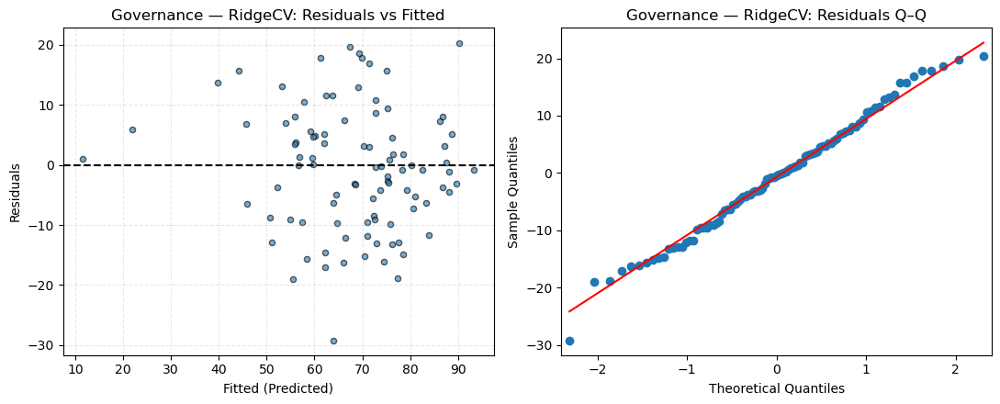

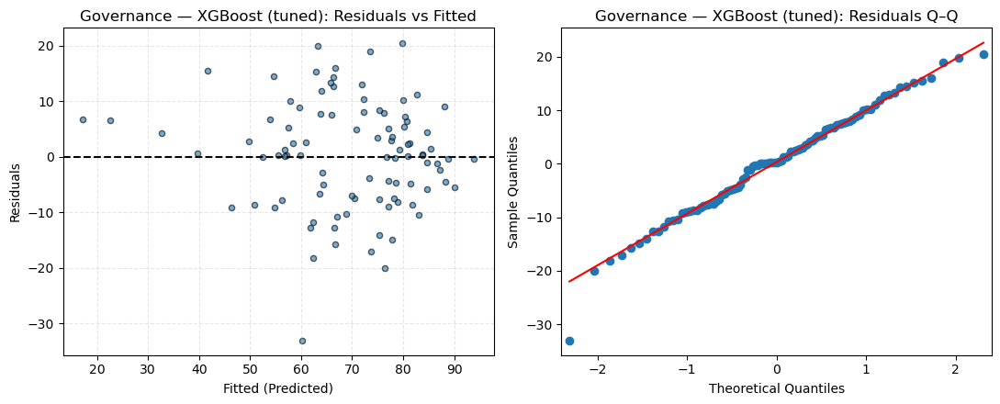


=== Governance Mean Bias (Pred - True) by Score Segment ===


,Bias Low (<50),Bias Mid (50–80),Bias High (>80)
Model,,,
OLS,10.071867,0.555340,-7.143904
LassoCV,10.040941,1.240714,-7.964849
RidgeCV,10.860825,0.924993,-8.224176
RandomForest (tuned),13.121745,3.337819,-8.644970
XGBoost (tuned),9.334719,2.557474,-7.350134



[Governance] Mean bias for high scores (>80): RidgeCV: -8.22 vs. XGBoost (tuned): -7.35

=== Social Metrics (sorted by MAE) ===


,R2,RMSE,MAE,MAPE_%,sMAPE_%
Model,,,,,
XGBoost (tuned),0.848358,6.839059,5.269942,9.134769,8.788898
RandomForest (tuned),0.838810,7.051080,5.448811,9.387963,8.877660
LassoCV,0.715274,9.371307,7.201484,12.973602,12.045516
RidgeCV,0.643873,10.480670,7.787088,13.815496,12.697382
OLS,0.576774,11.425427,8.242666,13.518327,12.923085


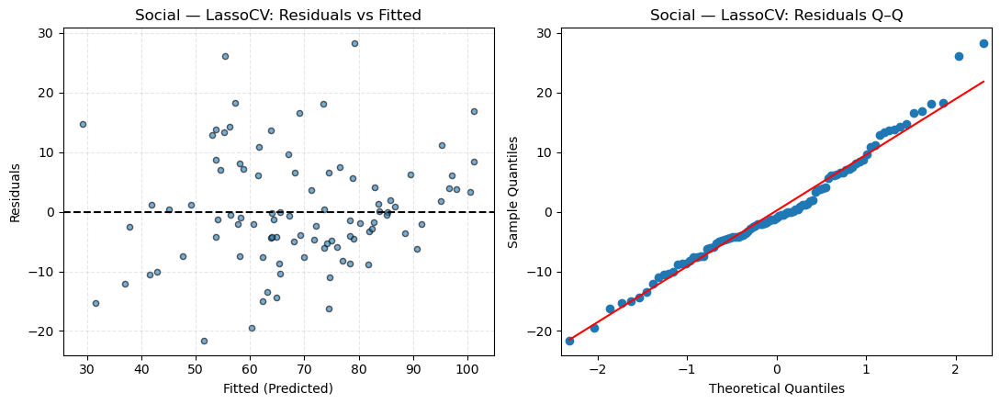

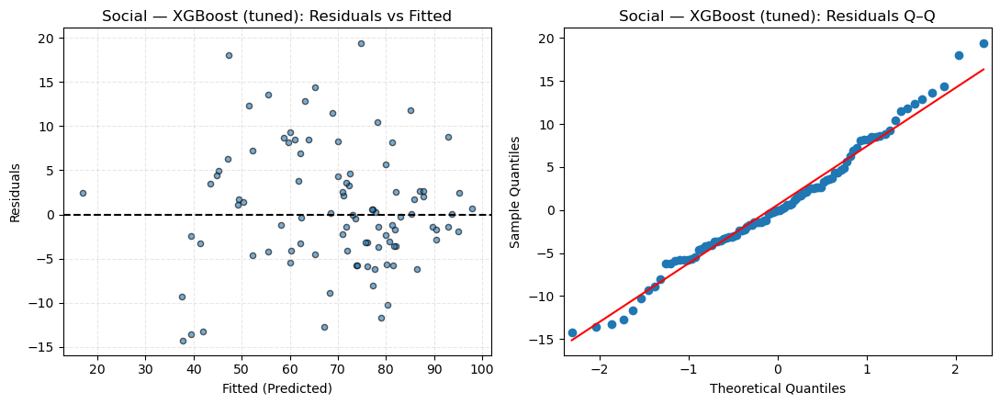


=== Social Mean Bias (Pred - True) by Score Segment ===


,Bias Low (<50),Bias Mid (50–80),Bias High (>80)
Model,,,
OLS,5.448936,-2.379246,2.152946
LassoCV,6.788520,-1.205060,-0.790728
RidgeCV,7.785398,-1.297433,-0.158600
RandomForest (tuned),6.146436,1.049796,-3.874744
XGBoost (tuned),4.135183,1.269414,-2.240536



[Social] Mean bias for high scores (>80): LassoCV: -0.79 vs. XGBoost (tuned): -2.24

=== Environment Metrics (sorted by MAE) ===


,R2,RMSE,MAE,MAPE_%,sMAPE_%
Model,,,,,
XGBoost (tuned),0.682827,12.067206,7.595467,18.576045,18.305153
RandomForest (tuned),0.676712,12.182990,8.000499,19.240174,18.703232
RidgeCV,0.423648,16.266823,12.101168,25.845491,25.445527
LassoCV,0.408803,16.474979,12.215759,26.161392,25.620179
OLS,0.222565,18.892569,13.961856,28.709049,28.707740


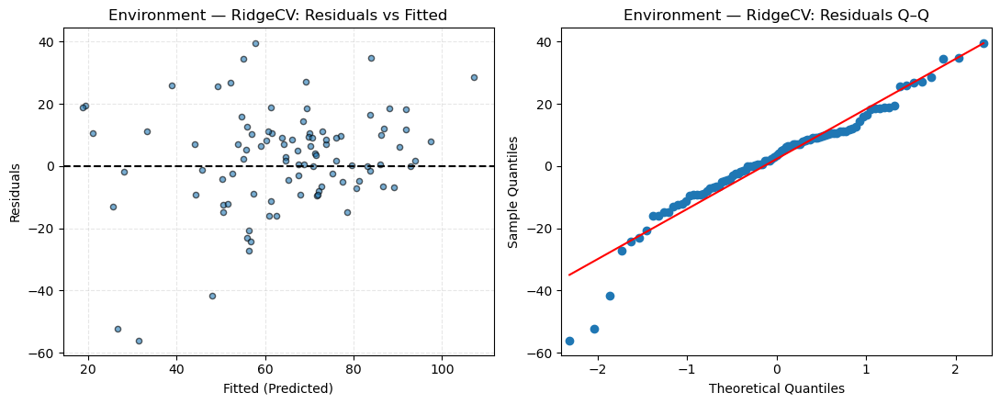

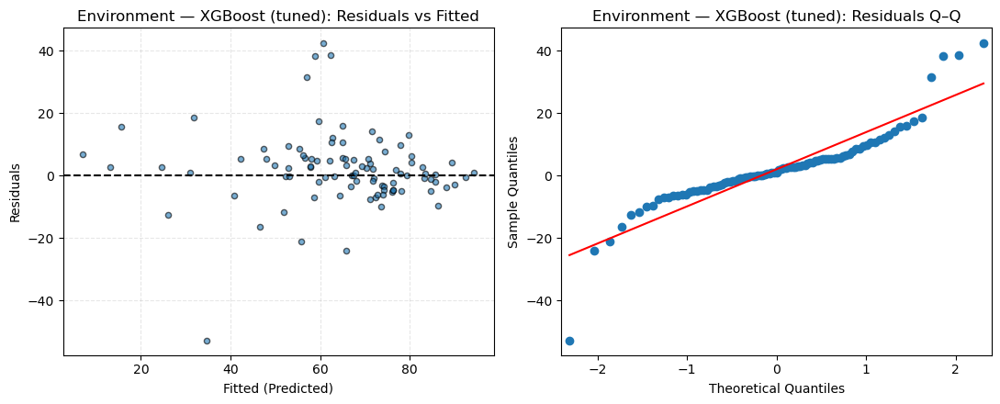


=== Environment Mean Bias (Pred - True) by Score Segment ===


,Bias Low (<50),Bias Mid (50–80),Bias High (>80)
Model,,,
OLS,16.111201,0.657578,-10.659584
LassoCV,16.946339,1.825591,-9.888212
RidgeCV,16.261417,1.276996,-9.234616
RandomForest (tuned),13.333808,2.628445,-5.454668
XGBoost (tuned),12.423445,1.150793,-6.140267



[Environment] Mean bias for high scores (>80): RidgeCV: -9.23 vs. XGBoost (tuned): -6.14


In [81]:
# New1: we added MAE and MAPE + residual/Q-Q plots + bias analysis (Gov/Soc/Env)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import statsmodels.api as sm

#  Metrics 
def rmse_metric(y_true, y_pred):
    return float(np.sqrt(mean_squared_error(y_true, y_pred)))

def mae_metric(y_true, y_pred):
    return float(mean_absolute_error(y_true, y_pred))

def mape_metric(y_true, y_pred, eps=1e-6):
    yt = np.asarray(y_true, float).ravel()
    yp = np.asarray(y_pred, float).ravel()
    mask = np.abs(yt) > eps
    if not mask.any():
        return np.nan
    return float(np.mean(np.abs((yp[mask] - yt[mask]) / yt[mask])) * 100)

def smape_metric(y_true, y_pred, eps=1e-6):
    yt = np.asarray(y_true, float).ravel()
    yp = np.asarray(y_pred, float).ravel()
    return float(100 * np.mean(2 * np.abs(yp - yt) / (np.abs(yt) + np.abs(yp) + eps)))

# Diagnostics 
def residual_plots(title, model_name, y_true, y_pred):
    yt = pd.Series(y_true).astype(float).reset_index(drop=True)
    yp = pd.Series(y_pred).astype(float).reset_index(drop=True)
    resid = yp - yt

    fig, axes = plt.subplots(1, 2, figsize=(11, 4.5))
    # Residuals vs Fitted
    axes[0].scatter(yp, resid, alpha=0.6, edgecolor='k', s=20)
    axes[0].axhline(0, color='k', linestyle='--', linewidth=1.5)
    axes[0].set_title(f'{title} — {model_name}: Residuals vs Fitted')
    axes[0].set_xlabel('Fitted (Predicted)')
    axes[0].set_ylabel('Residuals')
    axes[0].grid(True, linestyle='--', alpha=0.3)

    # Q–Q plot of residuals
    sm.qqplot(resid, line='s', ax=axes[1])
    axes[1].set_title(f'{title} — {model_name}: Residuals Q–Q')
    plt.tight_layout()
    plt.show()

def metrics_table(y_true, preds_dict):
    rows = []
    for name, yhat in preds_dict.items():
        yhat = np.asarray(yhat).ravel()
        rows.append({
            'Model': name,
            'R2': r2_score(y_true, yhat),
            'RMSE': rmse_metric(y_true, yhat),
            'MAE': mae_metric(y_true, yhat),
            'MAPE_%': mape_metric(y_true, yhat),
            'sMAPE_%': smape_metric(y_true, yhat)
        })
    dfm = pd.DataFrame(rows).set_index('Model').sort_values('MAE')
    return dfm

def best_linear_and_ensemble(metrics_df):
    # Split by naming (consistent with your labels)
    linear_mask = metrics_df.index.str.contains('OLS|Lasso|Ridge', case=False, regex=True)
    ens_mask = metrics_df.index.str.contains('RandomForest|XGBoost', case=False, regex=True)
    best_lin = metrics_df[linear_mask].sort_values('RMSE').head(1)
    best_ens = metrics_df[ens_mask].sort_values('RMSE').head(1)
    return (None if best_lin.empty else best_lin.index[0],
            None if best_ens.empty else best_ens.index[0])

def bias_summary(y_true, preds_dict, high_thr=80.0, mid_lo=50.0, mid_hi=80.0):
    yt = pd.Series(y_true).astype(float)
    bins = {
        'Low (<50)': yt < mid_lo,
        'Mid (50–80)': (yt >= mid_lo) & (yt <= mid_hi),
        'High (>80)': yt > high_thr
    }
    rows = []
    for name, yhat in preds_dict.items():
        yhat = pd.Series(yhat, index=yt.index).astype(float)
        err = yhat - yt  # positive => overprediction
        rec = {'Model': name}
        for label, m in bins.items():
            if m.any():
                rec[f'Bias {label}'] = float(err[m].mean())
            else:
                rec[f'Bias {label}'] = np.nan
        rows.append(rec)
    dfb = pd.DataFrame(rows).set_index('Model')
    return dfb

def ensure_preds(group_preds, y_true, X_test, spec_name):
    if group_preds and len(group_preds):
        return group_preds
    # fallback if needed
    if 'collect_preds_with_fallback' in globals():
        return collect_preds_with_fallback(y_true, X_test, spec_name)
    if 'make_preds_dict' in globals():
        return make_preds_dict(y_true, X_test, spec_name)
    raise RuntimeError('No predictions available.')

def run_group(title, y_true, X_test, preds_dict):
    if y_true is None or preds_dict is None or len(preds_dict) == 0:
        print(f'[{title}] Missing y_true or predictions.')
        return

    # Metrics (adds MAE/MAPE)
    mtab = metrics_table(y_true, preds_dict)
    print(f'\n=== {title} Metrics (sorted by MAE) ===')
    display(mtab)

    # Pick best linear + best ensemble by MAE for diagnostics
    best_lin, best_ens = best_linear_and_ensemble(mtab)

    # Residual diagnostics (two plots per best model)
    for name in [best_lin, best_ens]:
        if name and name in preds_dict:
            residual_plots(title, name, y_true, preds_dict[name])

    #  Bias analysis (by true-score bins)
    btab = bias_summary(y_true, preds_dict, high_thr=80.0, mid_lo=50.0, mid_hi=80.0)
    print(f'\n=== {title} Mean Bias (Pred - True) by Score Segment ===')
    display(btab)

    #  Concise bias headline for high scores
    def bias_line(model_name):
        if model_name and model_name in btab.index:
            val = btab.loc[model_name, 'Bias High (>80)']
            if pd.notna(val):
                return f'{model_name}: {val:+.2f}'
        return f'{model_name}: n/a'

    print(f'\n[{title}] Mean bias for high scores (>80): '
          f'{bias_line(best_lin)} vs. {bias_line(best_ens)}')

# -------- Run for each group using existing variables/dicts --------
# Governance
gov_spec = {
    "OLS": ["y_pred_gov_ols", "lr_gov", "gov_lr"],
    "LassoCV": ["y_pred_lasso_gov_hypertuned", "lasso_gov", "gov_lasso"],
    "RidgeCV": ["y_pred_ridge_gov_hypertuned", "ridge_gov", "gov_ridge"],
    "RandomForest (tuned)": ["rf_gov"],
    "XGBoost (tuned)": ["xgb_gov"],
}
gov_preds = ensure_preds(globals().get('gov_preds'), globals().get('yte_gov'), globals().get('Xte_gov_vif'), gov_spec)
run_group('Governance', globals().get('yte_gov'), globals().get('Xte_gov_vif'), gov_preds)

# Social
soc_spec = {
    "OLS": ["y_pred_soc_ols", "lr_soc"],
    "LassoCV": ["y_pred_lasso_soc_hypertuned", "lasso_soc"],
    "RidgeCV": ["y_pred_soc_ridge_hypertuned", "ridge_soc"],
    "RandomForest (tuned)": ["rf_soc"],
    "XGBoost (tuned)": ["xgb_soc"],
}
soc_preds = ensure_preds(globals().get('soc_preds'), globals().get('yte_soc'), globals().get('Xte_soc_vif'), soc_spec)
run_group('Social', globals().get('yte_soc'), globals().get('Xte_soc_vif'), soc_preds)

# Environment
env_spec = {
    "OLS": ["y_pred_env_ols", "lr_env"],
    "LassoCV": ["y_pred_lasso_env_hypertuned", "lasso_env"],
    "RidgeCV": ["y_pred_ridge_env_hypertuned", "ridge_env"],
    "RandomForest (tuned)": ["rf_env"],
    "XGBoost (tuned)": ["xgb_env"],
}
env_preds = ensure_preds(globals().get('env_preds'), globals().get('yte_env'), globals().get('Xte_env_vif'), env_spec)
run_group('Environment', globals().get('yte_env'), globals().get('Xte_env_vif'), env_preds)

# Interpretations


[Governance] Explaining RandomForest with 95 test rows and 99 features.


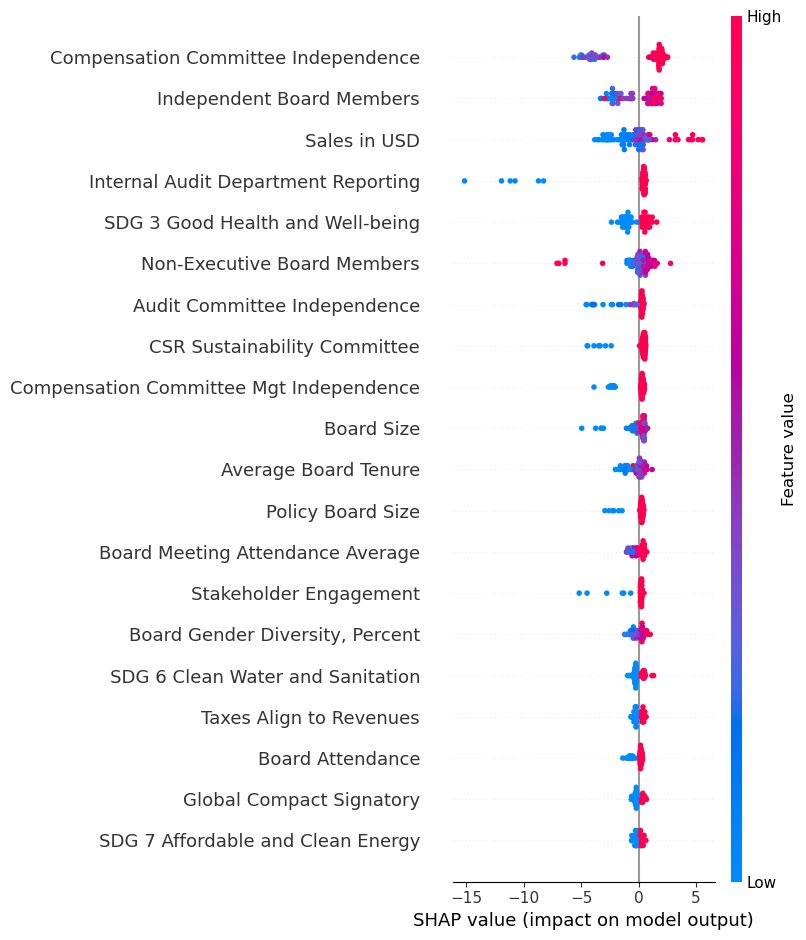

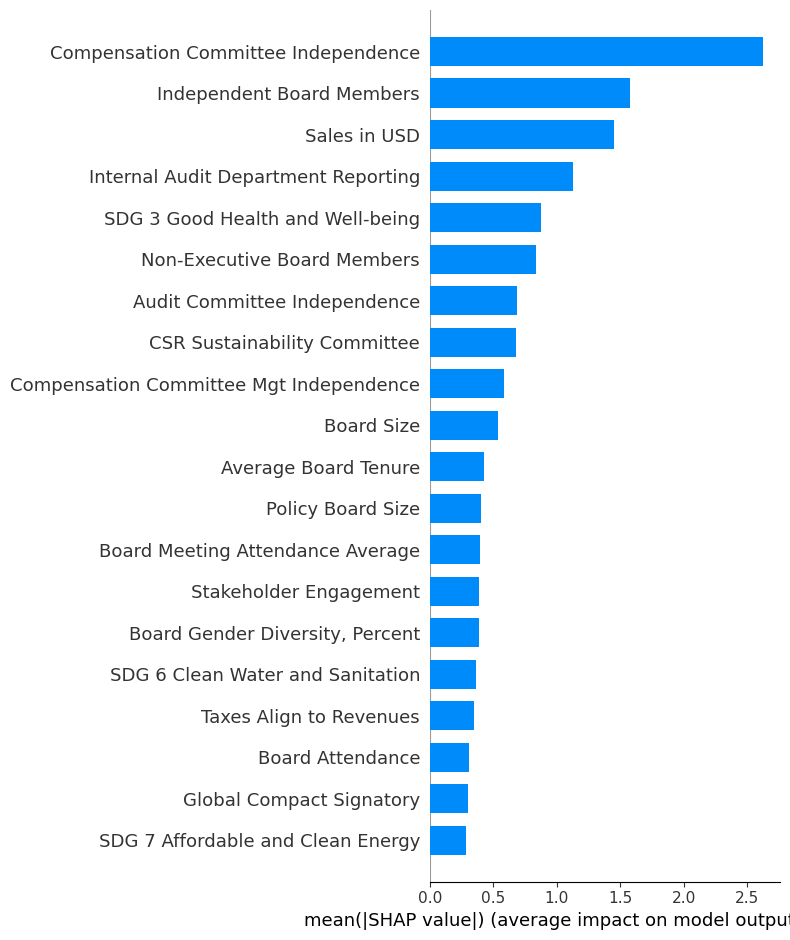

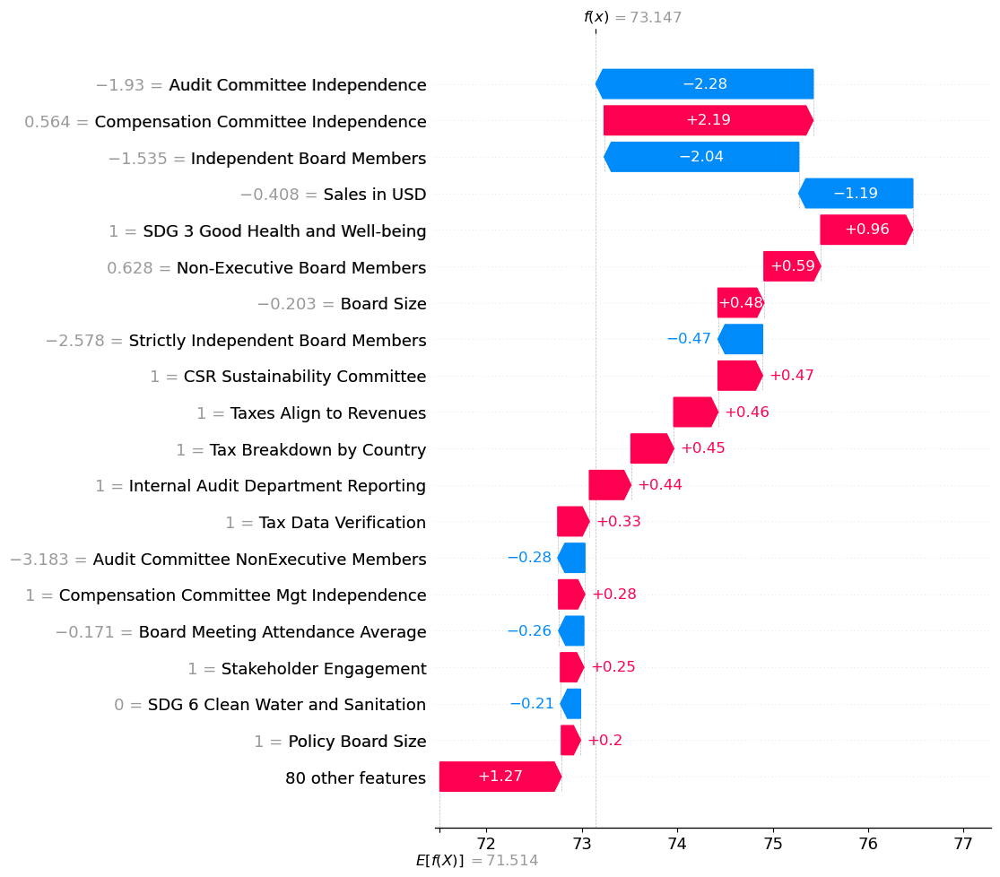


[Governance] Explaining XGBoost with 95 test rows and 99 features.


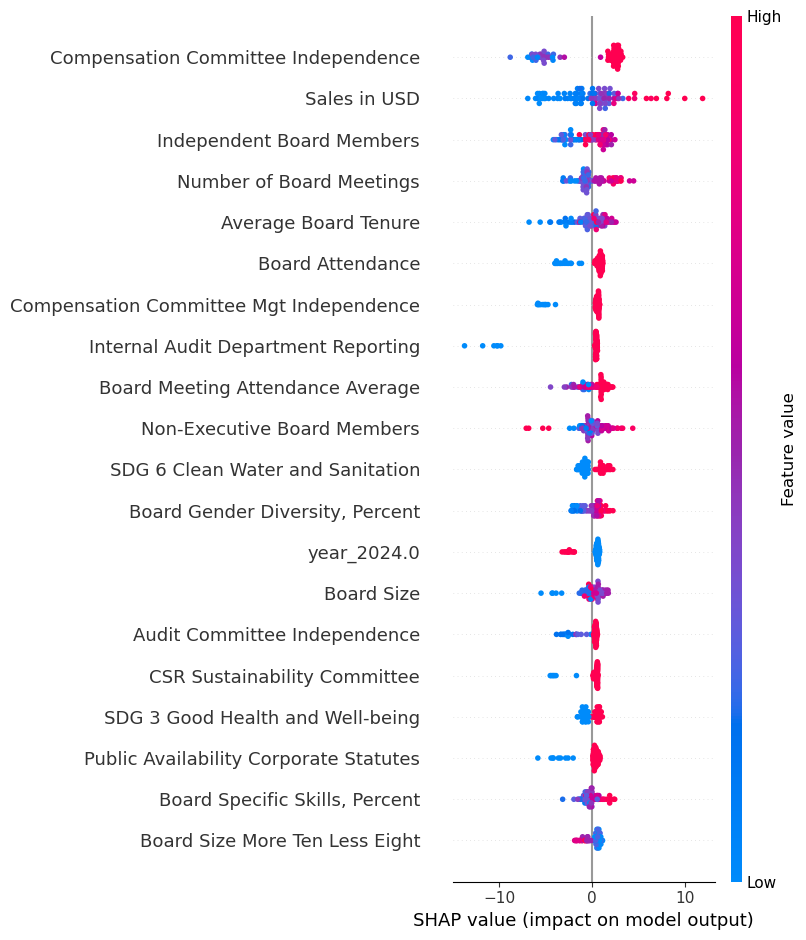

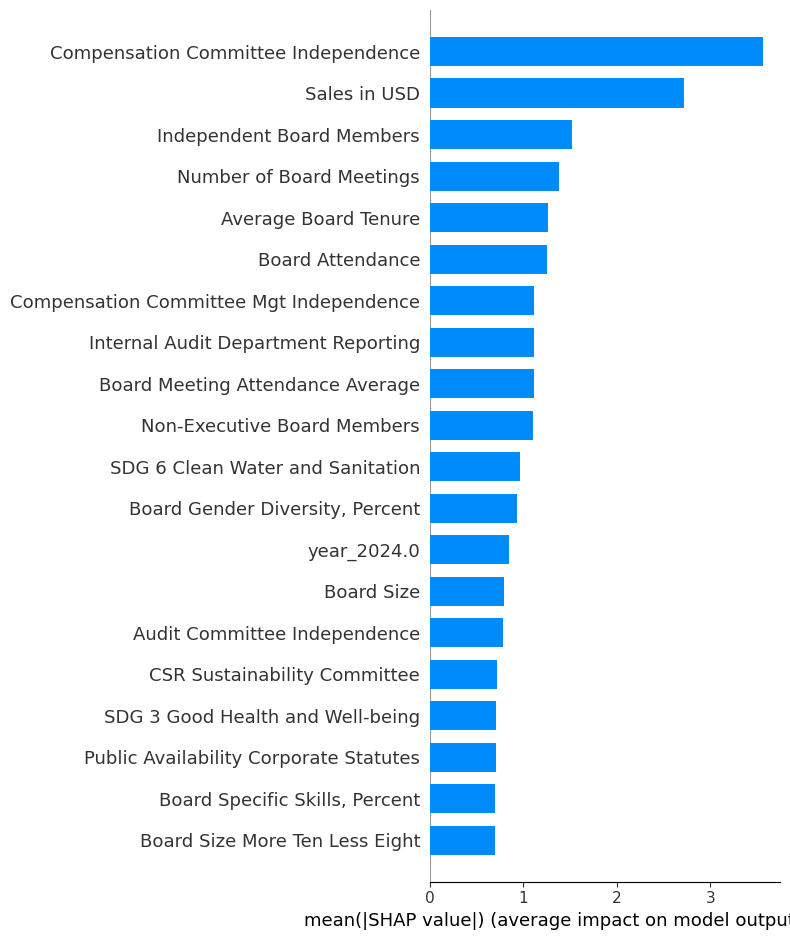

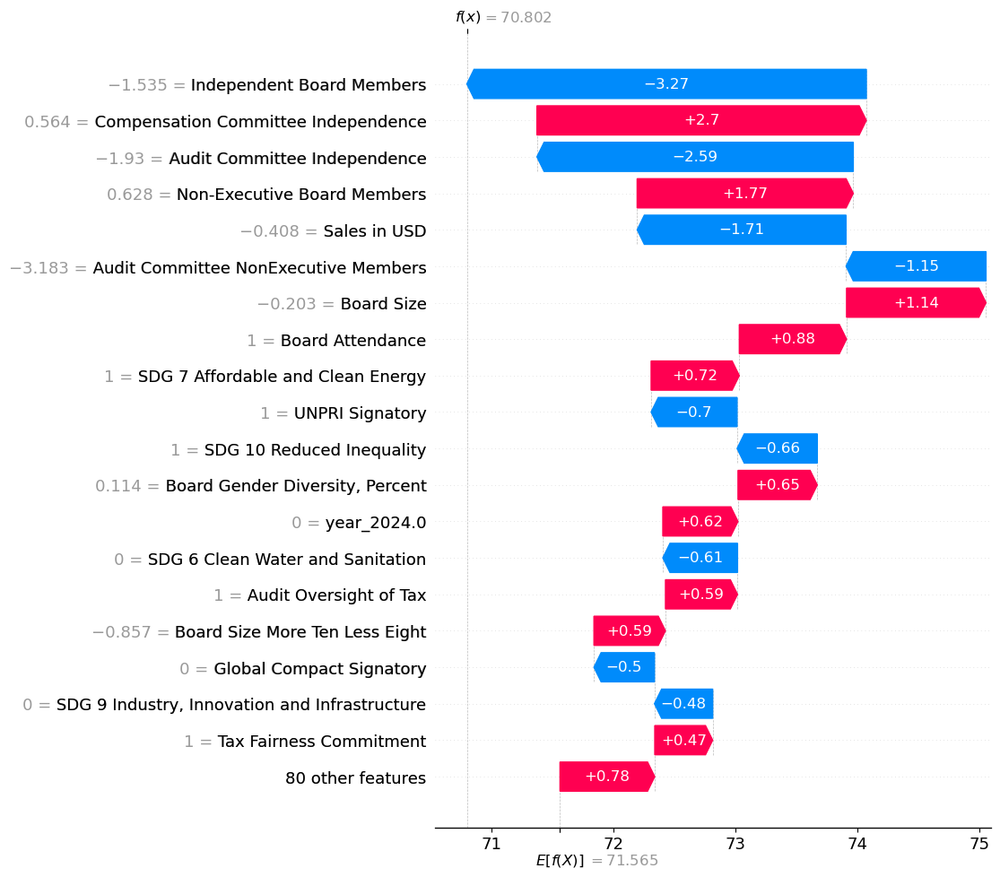


[Social] Explaining RandomForest with 95 test rows and 151 features.


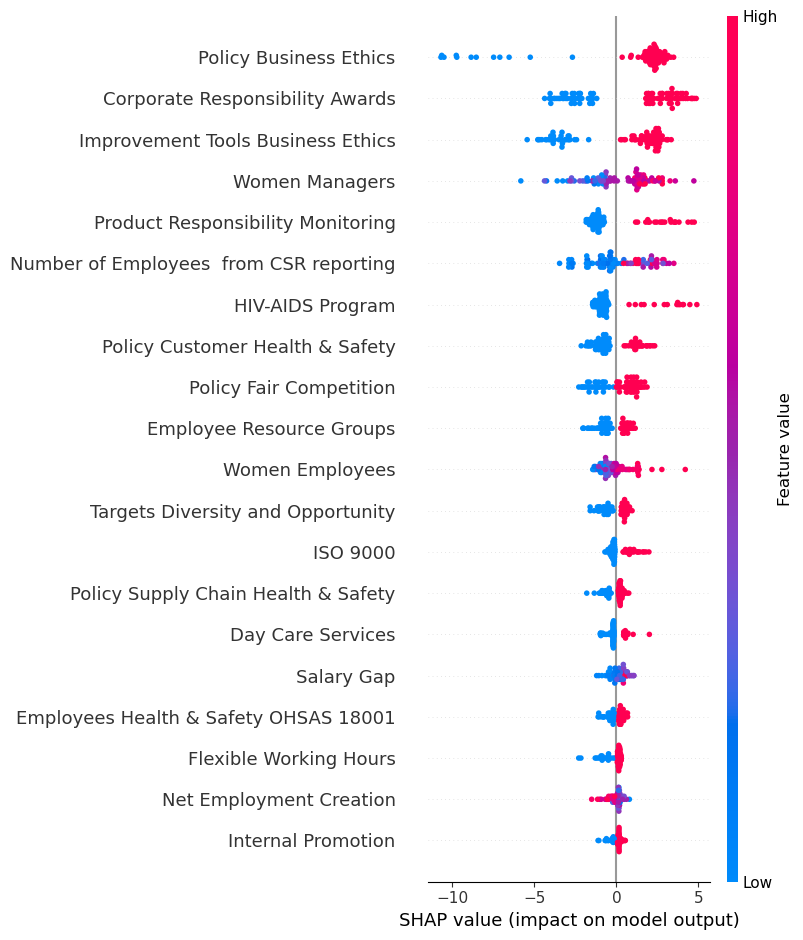

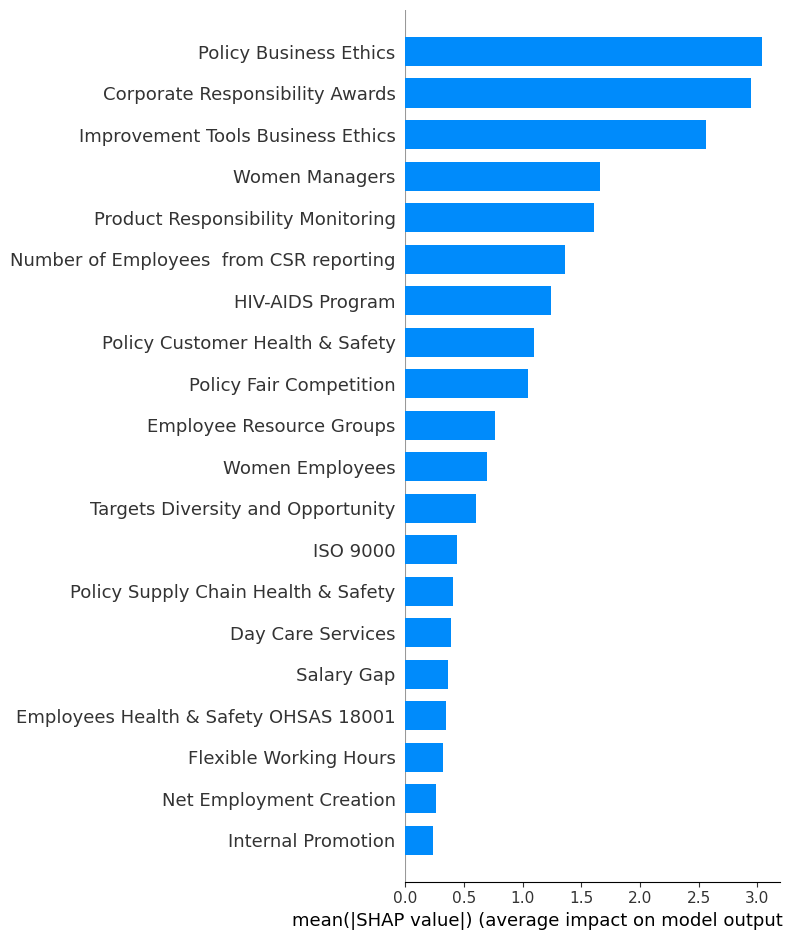

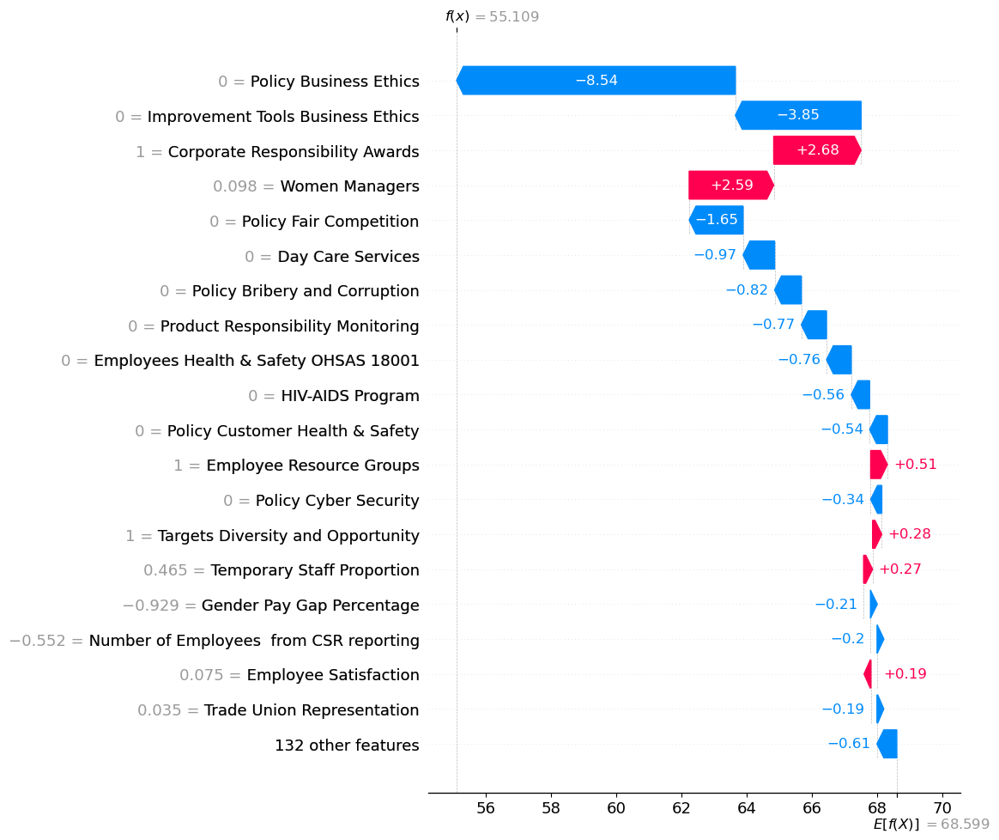


[Social] Explaining XGBoost with 95 test rows and 151 features.


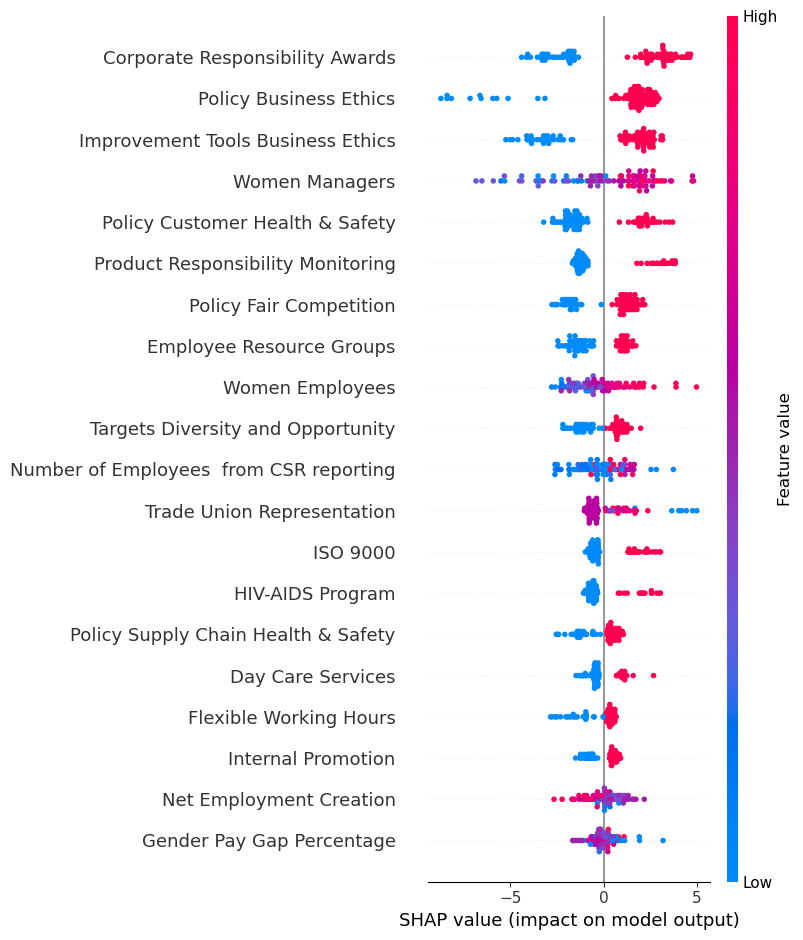

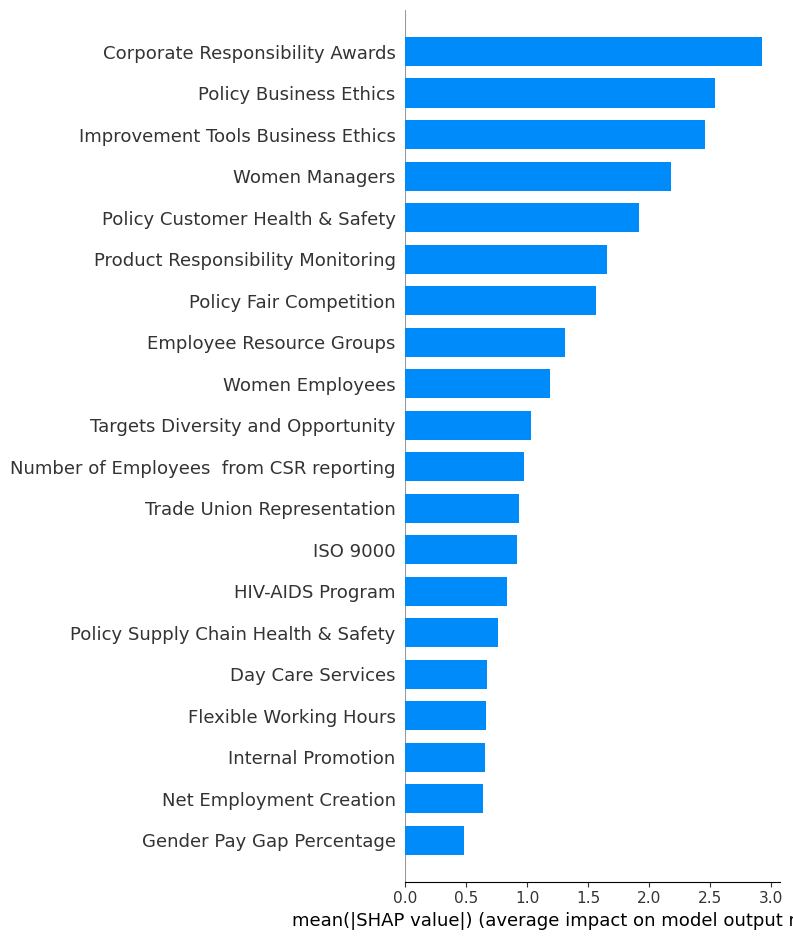

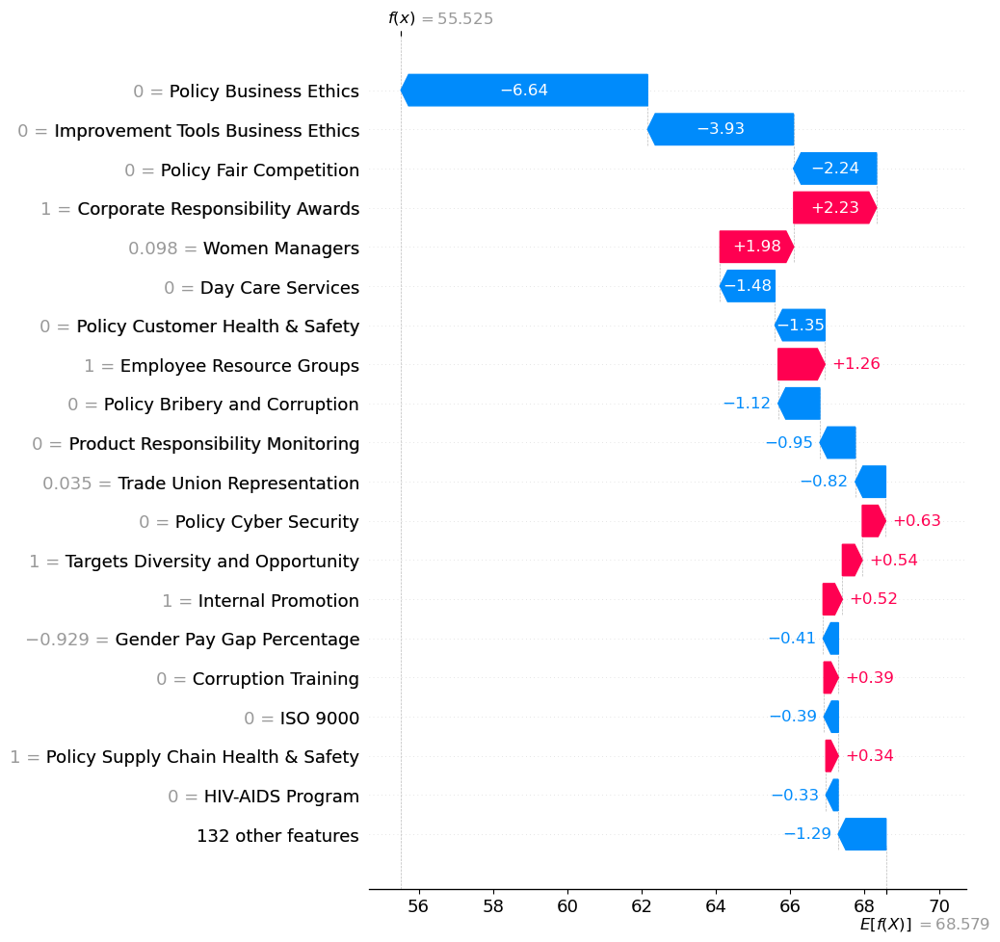


[Environment] Explaining RandomForest with 95 test rows and 89 features.


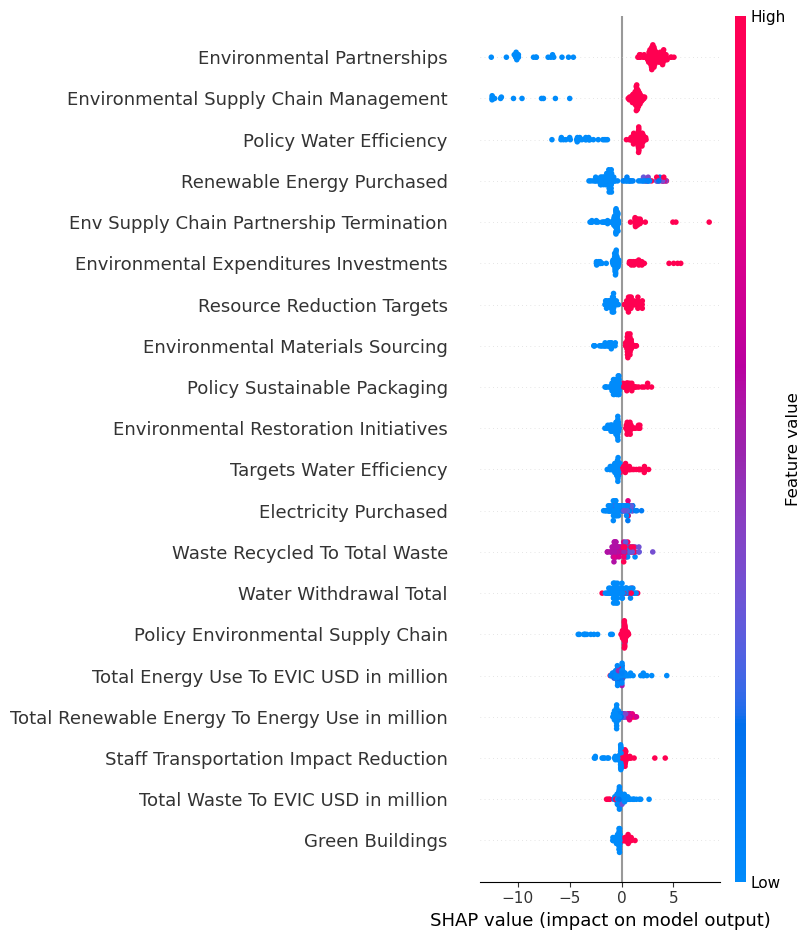

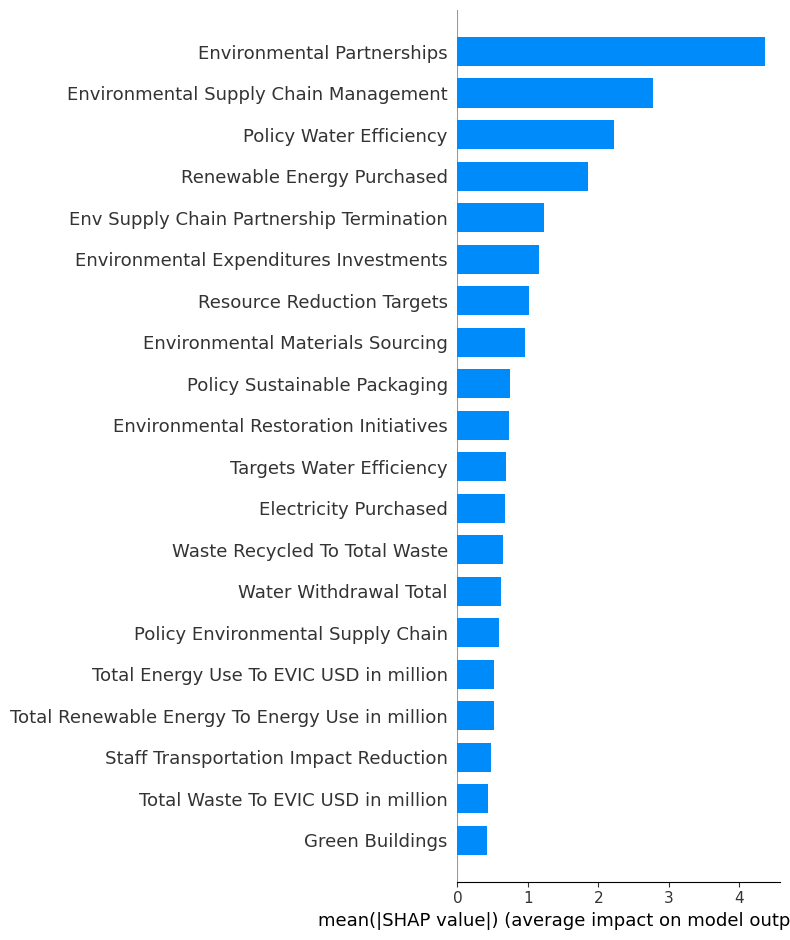

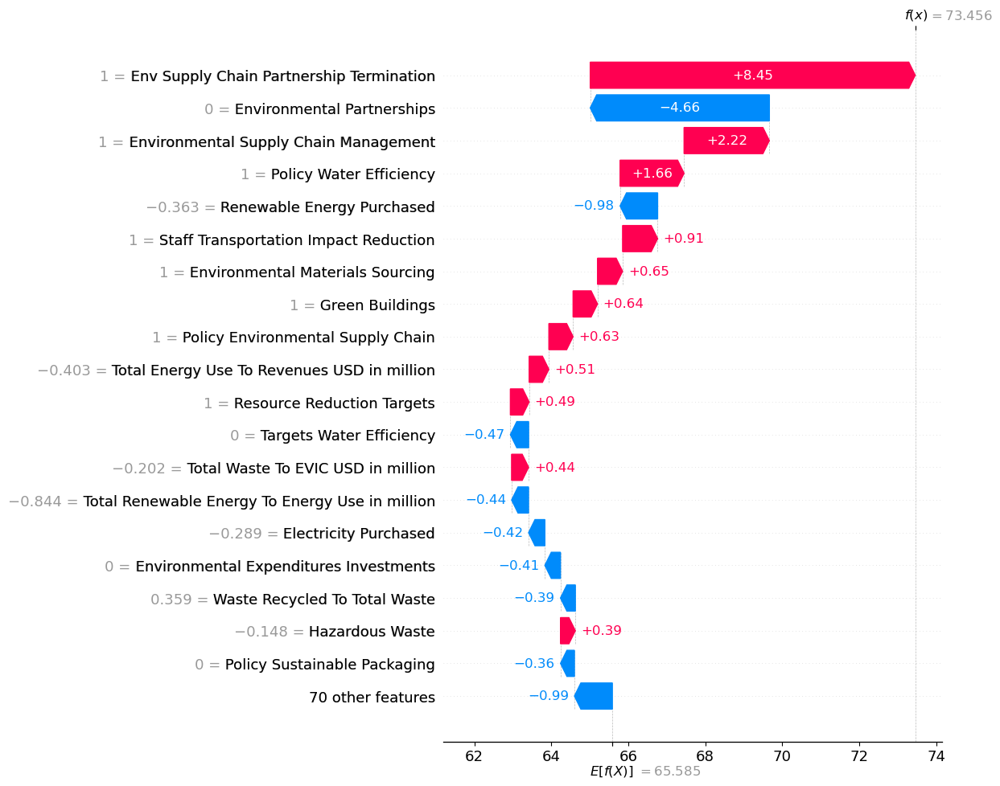


[Environment] Explaining XGBoost with 95 test rows and 89 features.


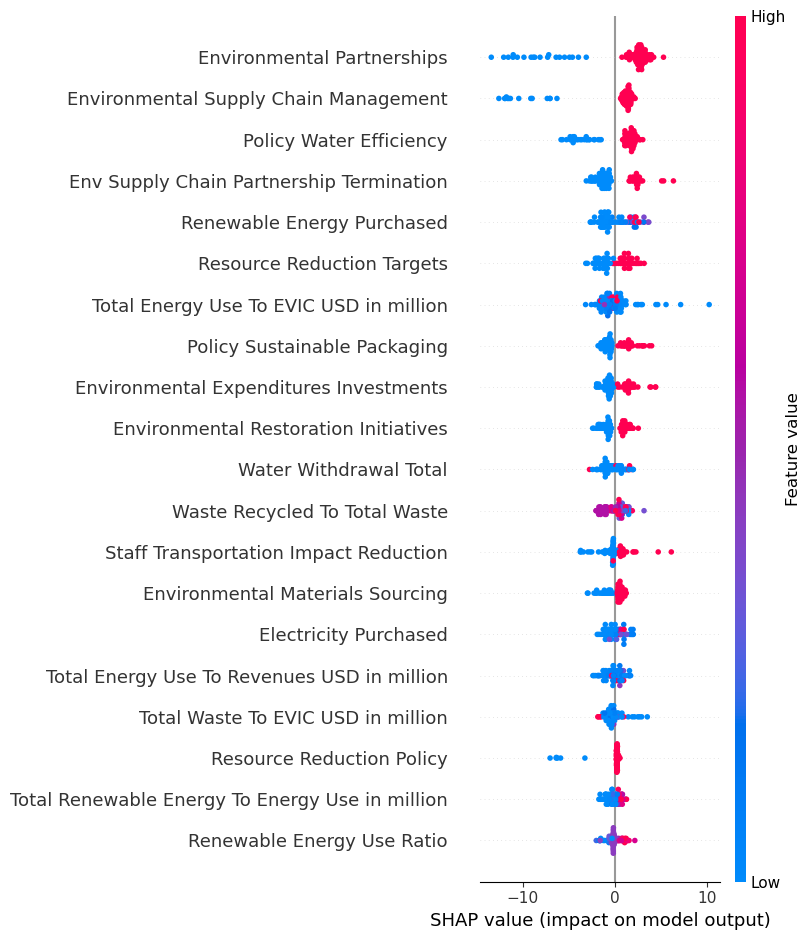

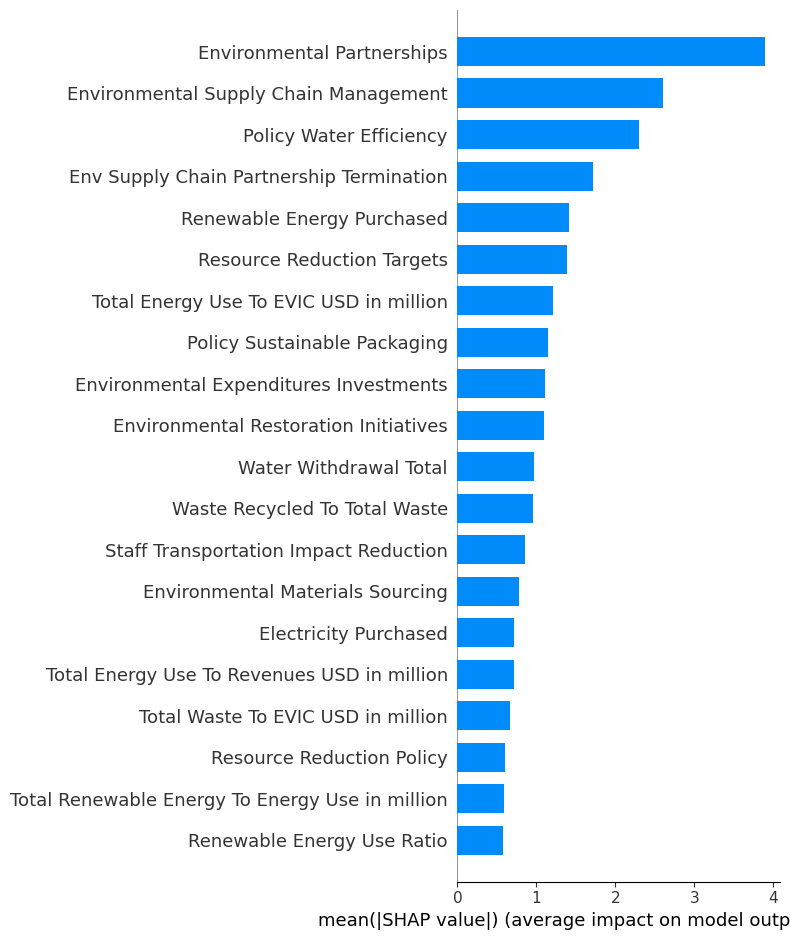

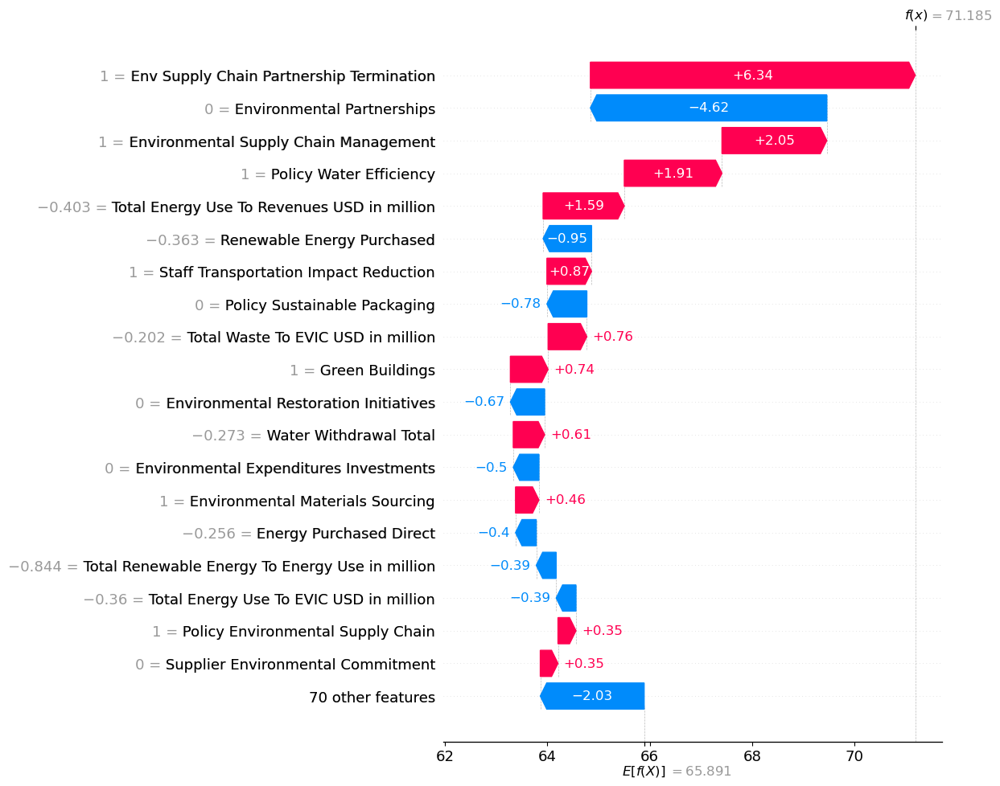

In [82]:
import shap

# Apply SHAP to RandomForest and XGBoost models for Governance, Social, and Environment


def _sample_background(X, n=256, random_state=42):
    try:
        # shap has a helper in newer versions
        return shap.sample(X, min(n, len(X)), random_state)
    except Exception:
        return X.sample(n=min(n, len(X)), random_state=random_state, replace=False)

def explain_tree_models(group_name, X_train, X_test, models, background_size=256, max_display=20):
    if X_train is None or X_test is None or len(X_test) == 0:
        print(f"[{group_name}] Missing or empty data. Skipping.")
        return

    # Ensure column alignment/order matches training
    try:
        X_test = X_test[X_train.columns]
    except Exception:
        pass

    X_bg = _sample_background(X_train, n=background_size)

    for model_name, model in models.items():
        if model is None:
            print(f"[{group_name}] {model_name} model not found. Skipping.")
            continue

        print(f"\n[{group_name}] Explaining {model_name} with {X_test.shape[0]} test rows and {X_test.shape[1]} features.")
        try:
            explainer = shap.Explainer(model, X_bg)
        except Exception:
            # Fallback for older SHAP versions / tree-specific settings
            explainer = shap.TreeExplainer(
                model,
                data=X_bg,
                feature_perturbation="interventional",
                model_output="raw"
            )

        # Disable additivity check to avoid ExplainerError due to approximations
        shap_values = explainer(X_test, check_additivity=False)

        # Global importance - dot plot
        shap.summary_plot(shap_values, X_test, plot_type="dot", max_display=max_display, show=True)

        # Bar plot (mean |SHAP|)
        shap.summary_plot(shap_values, X_test, plot_type="bar", max_display=max_display, show=True)

        # Local explanation for first test sample
        try:
            shap.plots.waterfall(shap_values[0], max_display=max_display, show=True)
        except Exception:
            # Fallback for older SHAP versions
            shap.plots._waterfall.waterfall_legacy(
                explainer.expected_value,
                shap_values.values[0],
                X_test.iloc[0],
                feature_names=X_test.columns,
                max_display=max_display,
                show=True
            )


# Prepare model and data mappings from existing variables
gov_models = {
    "RandomForest": globals().get("rf_gov"),
    "XGBoost": globals().get("xgb_gov"),
}
soc_models = {
    "RandomForest": globals().get("rf_soc"),
    "XGBoost": globals().get("xgb_soc"),
}
env_models = {
    "RandomForest": globals().get("rf_env"),
    "XGBoost": globals().get("xgb_env"),
}

# Use VIF-cleaned train/test matrices built earlier
explain_tree_models(
    "Governance",
    globals().get("Xtr_gov_vif"),
    globals().get("Xte_gov_vif"),
    gov_models,
    background_size=256,
    max_display=20
)

explain_tree_models(
    "Social",
    globals().get("Xtr_soc_vif"),
    globals().get("Xte_soc_vif"),
    soc_models,
    background_size=256,
    max_display=20
)

explain_tree_models(
    "Environment",
    globals().get("Xtr_env_vif"),
    globals().get("Xte_env_vif"),
    env_models,
    background_size=256,
    max_display=20
)

LIME explanations for RandomForest and XGBoost models in Governance, Social, and Environment groups



[Governance] LIME for RandomForest on 5 test instances.
  idx=499 | y_true=74.181 | y_pred=79.919
   Top contributions:
     Sales in USD > 0.06: +5.8503
     -0.78 < Compensation Committee Independence <= 0.56: +5.5616
     SDG 3 Good Health and Well-being <= 0.00: -2.3426
     Veto Power or Golden share <= 0.00: +1.7274
     State Owned Enterprise SOE <= 0.00: -1.2994
     Median Salary Gap <= -0.13: +1.2211
     Board Meeting Attendance Average <= -0.25: -1.0586
     Minimum Number of Shares to Vote <= 0.00: +0.9191
     Chief Legal Officer Report to Board <= 0.00: -0.7588
     Current CEO Chairman Duality <= 0.00: +0.6614


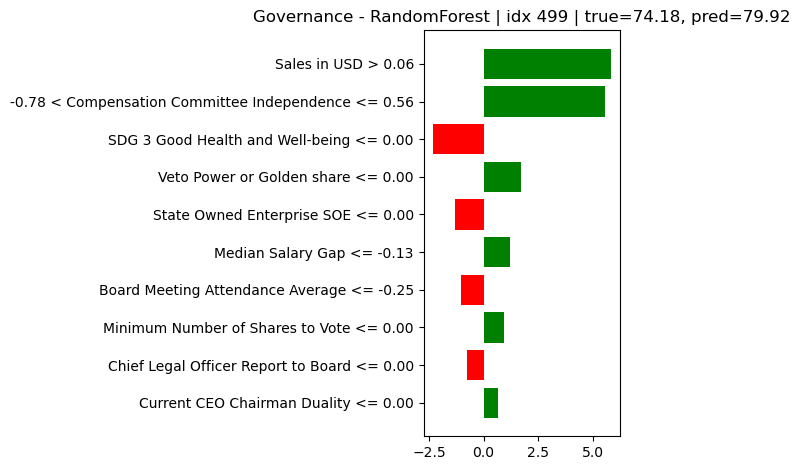

  idx=267 | y_true=71.647 | y_pred=78.376
   Top contributions:
     -0.78 < Compensation Committee Independence <= 0.56: +5.4584
     Minimum Number of Shares to Vote <= 0.00: +3.9207
     Current CEO Chairman Duality <= 0.00: -2.8071
     Board Size <= -0.67: -2.0427
     0.00 < SDG 3 Good Health and Well-being <= 1.00: +1.8805
     Veto Power or Golden share <= 0.00: +1.5679
     Median Salary Gap <= -0.13: +1.0398
     State Owned Enterprise SOE <= 0.00: +0.9386
     Targets Board Diversity - Target Set Year <= 0.12: +0.8867
     Pre-emptive Rights <= 0.00: -0.7511


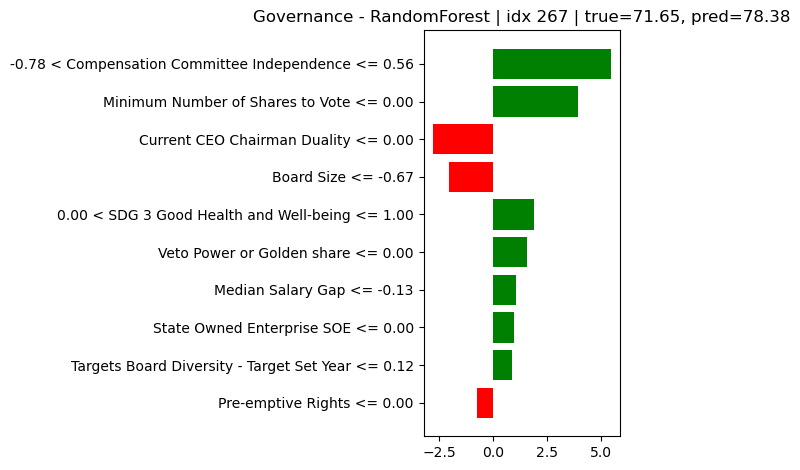

  idx=507 | y_true=76.788 | y_pred=75.968
   Top contributions:
     -0.78 < Compensation Committee Independence <= 0.56: +5.3070
     0.00 < SDG 3 Good Health and Well-being <= 1.00: +1.9448
     Current CEO Chairman Duality <= 0.00: +1.7931
     Targets Board Diversity - Target Year <= 0.01: +1.6815
     Median Salary Gap <= -0.13: +1.3755
     -0.43 < Sales in USD <= -0.35: -1.0634
     0.00 < Taxes Align to Revenues <= 1.00: +1.0428
     Chief Legal Officer Report to Board <= 0.00: +1.0113
     Anti Takeover Devices Above Two <= -0.67: -0.8361
     Minimum Number of Shares to Vote <= 0.00: +0.4645


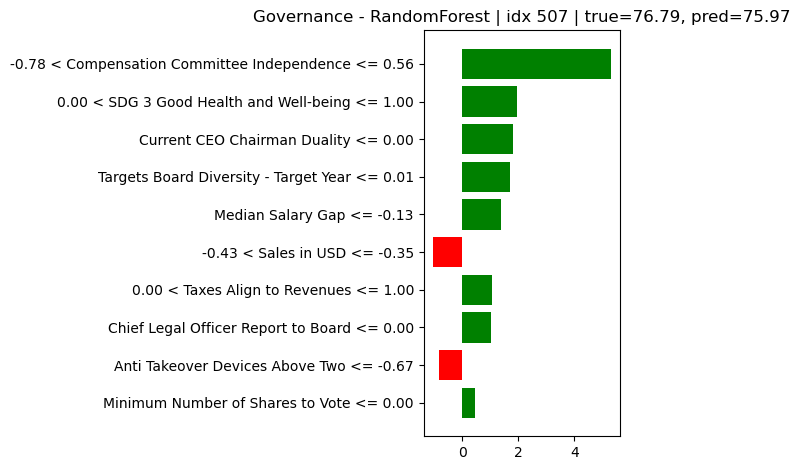

  idx=457 | y_true=54.597 | y_pred=76.581
   Top contributions:
     -0.78 < Compensation Committee Independence <= 0.56: +6.2169
     Sales in USD <= -0.43: -4.0211
     Veto Power or Golden share <= 0.00: +2.1142
     0.02 < Independent Board Members <= 0.65: +1.9881
     Median Salary Gap <= -0.13: +1.6435
     0.00 < SDG 3 Good Health and Well-being <= 1.00: +1.5862
     Targets Board Diversity - Target Year <= 0.01: -1.2152
     -0.20 < Board Size <= 0.74: +1.2069
     Minimum Number of Shares to Vote <= 0.00: -0.8792
     Current CEO Chairman Duality <= 0.00: +0.6479


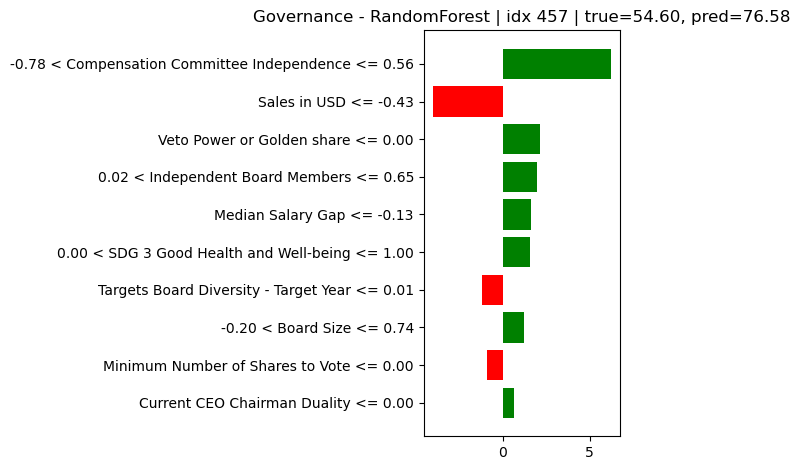

  idx=402 | y_true=65.905 | y_pred=73.141
   Top contributions:
     -0.78 < Compensation Committee Independence <= 0.56: +5.4515
     Current CEO Chairman Duality <= 0.00: +4.7495
     State Owned Enterprise SOE <= 0.00: +4.1810
     Independent Board Members <= -0.67: -1.9136
     0.00 < SDG 3 Good Health and Well-being <= 1.00: +1.6780
     Median Salary Gap <= -0.13: +1.6602
     Veto Power or Golden share <= 0.00: +1.5419
     Chief Legal Officer Report to Board <= 0.00: +1.4840
     Targets Board Diversity - Target Set Year <= 0.12: -1.3786
     -0.67 < Board Size <= -0.20: +1.1448


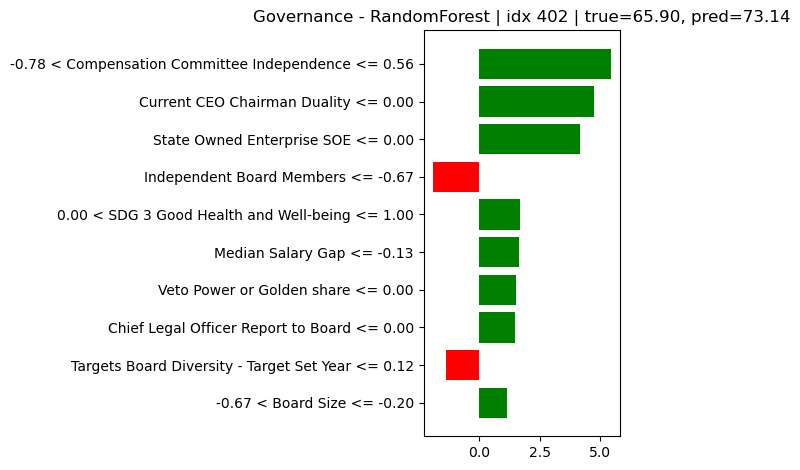


[Governance] LIME for XGBoost on 5 test instances.
  idx=499 | y_true=74.181 | y_pred=77.817
   Top contributions:
     Sales in USD > 0.06: +10.4070
     -0.78 < Compensation Committee Independence <= 0.56: +5.0438
     -0.63 < Number of Board Meetings <= -0.20: -3.8016
     Bonus Cap Senior Executives Percent <= -0.11: -3.7361
     C-Suite Risk Oversight <= 0.00: -3.1079
     Current CEO Chairman Duality <= 0.00: -2.7589
     Chief Legal Officer Report to Board <= 0.00: -2.1671
     State Owned Enterprise SOE <= 0.00: +2.0481
     SDG 3 Good Health and Well-being <= 0.00: -1.6081
     Minimum Number of Shares to Vote <= 0.00: +0.5921


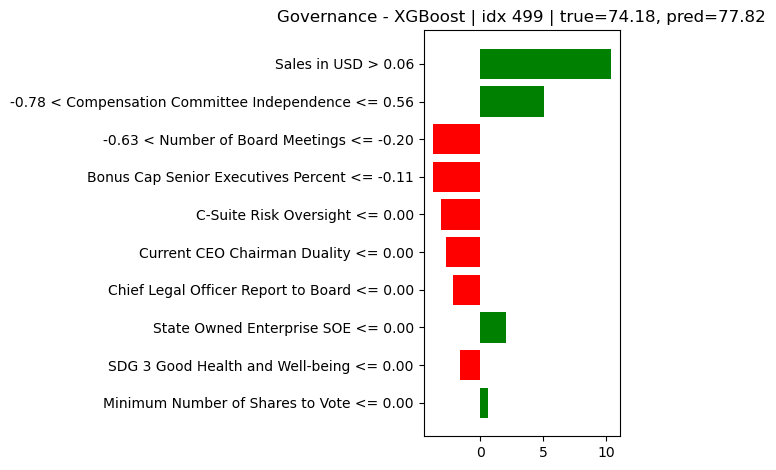

  idx=267 | y_true=71.647 | y_pred=82.751
   Top contributions:
     -0.78 < Compensation Committee Independence <= 0.56: +5.3649
     Board Size <= -0.67: -3.3736
     -0.63 < Number of Board Meetings <= -0.20: -3.3107
     Bonus Cap Senior Executives Percent <= -0.11: -3.2317
     -0.35 < Sales in USD <= 0.06: +3.0920
     C-Suite Risk Oversight <= 0.00: -2.8161
     Targets Board Diversity - Target Year <= 0.01: +2.5544
     Veto Power or Golden share <= 0.00: +2.3048
     Non-Executive Board Members <= -0.60: -2.0924
     State Owned Enterprise SOE <= 0.00: -1.4321


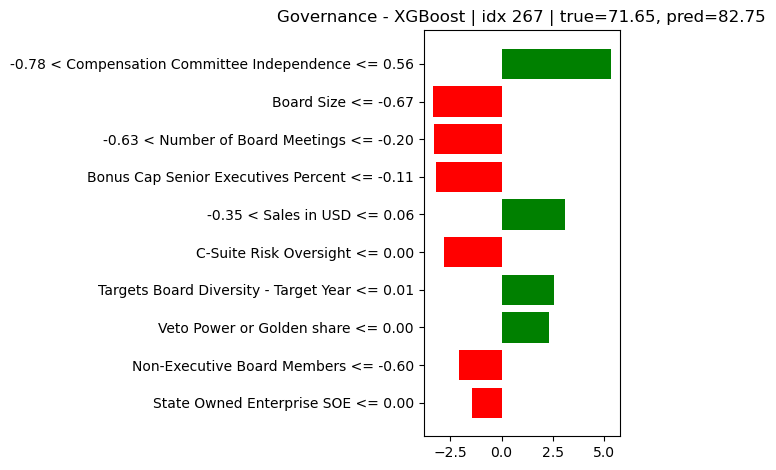

  idx=507 | y_true=76.788 | y_pred=76.809
   Top contributions:
     -0.43 < Sales in USD <= -0.35: -6.4416
     -0.78 < Compensation Committee Independence <= 0.56: +5.6278
     Non-Executive Board Members > 0.50: +3.6612
     -0.63 < Number of Board Meetings <= -0.20: -3.6485
     Bonus Cap Senior Executives Percent <= -0.11: -3.4853
     0.00 < C-Suite Risk Oversight <= 1.00: +3.2196
     Targets Board Diversity - Target Set Year <= 0.12: -2.4558
     UNPRI Signatory <= 0.00: +2.1176
     State Owned Enterprise SOE <= 0.00: -1.7723
     Current CEO Chairman Duality <= 0.00: -1.3935


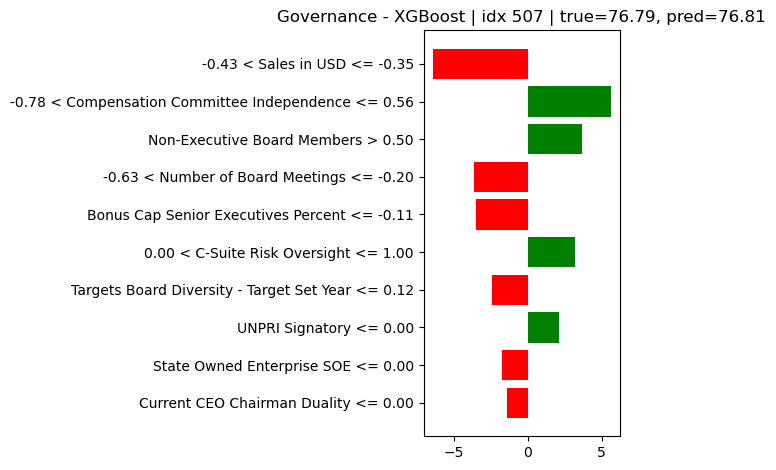

  idx=457 | y_true=54.597 | y_pred=73.474
   Top contributions:
     Sales in USD <= -0.43: -6.0533
     -0.78 < Compensation Committee Independence <= 0.56: +4.9991
     Bonus Cap Senior Executives Percent <= -0.11: -3.8710
     -0.63 < Number of Board Meetings <= -0.20: -3.4943
     Nomination Committee Involvement <= -0.17: +2.8031
     C-Suite Risk Oversight <= 0.00: -2.6891
     Targets Board Diversity - Target Year <= 0.01: +2.3965
     0.02 < Independent Board Members <= 0.65: +1.8879
     year_2022.0 <= 0.00: +1.6794
     year_2024.0 <= 0.00: +1.6765


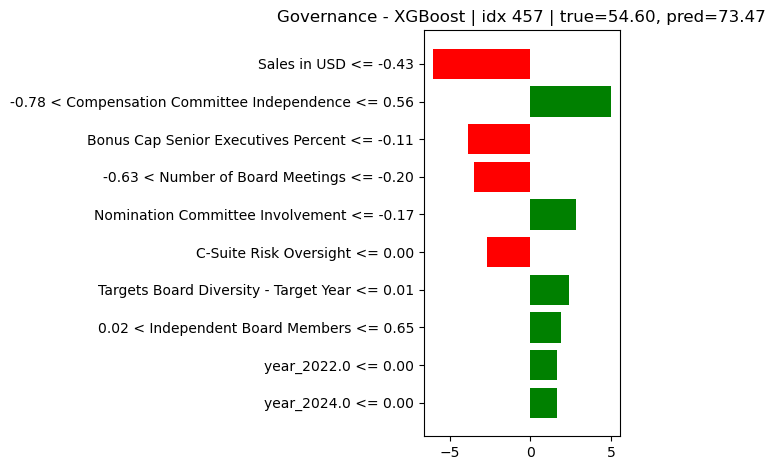

  idx=402 | y_true=65.905 | y_pred=70.802
   Top contributions:
     -0.43 < Sales in USD <= -0.35: -6.3312
     -0.78 < Compensation Committee Independence <= 0.56: +4.9453
     Non-Executive Board Members > 0.50: +3.8208
     -0.63 < Number of Board Meetings <= -0.20: -3.6577
     0.00 < C-Suite Risk Oversight <= 1.00: +3.1594
     Average Board Tenure > 0.49: +2.6748
     Tax Breakdown by Country > 0.00: +2.3926
     -0.67 < Board Size <= -0.20: +2.1588
     Bonus Cap Senior Executives Percent <= -0.11: -1.8894
     Chief Legal Officer Report to Board <= 0.00: -1.5935


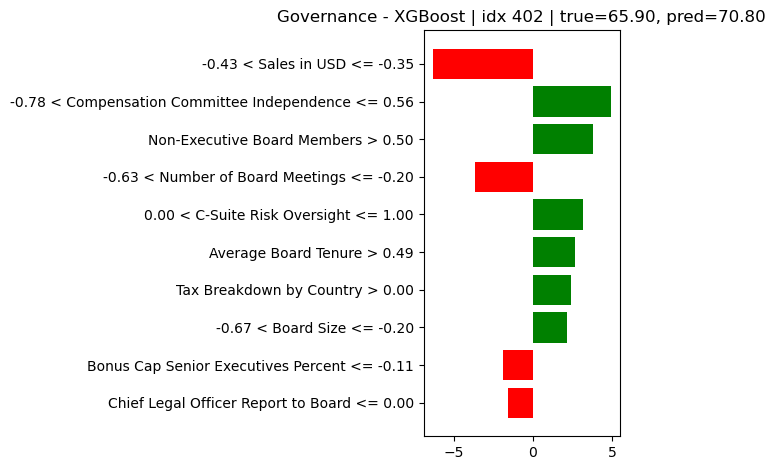


[Social] LIME for RandomForest on 5 test instances.
  idx=499 | y_true=85.135 | y_pred=84.609
   Top contributions:
     0.00 < Improvement Tools Business Ethics <= 1.00: +6.0791
     Alcohol 5% Revenues <= 0.00: -5.7223
     Corporate Responsibility Awards <= 0.00: -5.1480
     Intellectual Property Controversies <= -0.05: +4.5799
     Contractor Lost Working Days <= -0.07: +3.5241
     Thermal Coal Producer Revenue Percent <= 0.05: +2.7299
     Employees Health & Safety Controversies <= -0.06: +2.6726
     Gambling Operator and Producer <= 0.00: +2.6612
     White - Ethnic Minorities Managers Percentage <= 0.03: -2.5637
     Recent Anti-Competition Controversy <= -0.07: +1.5848


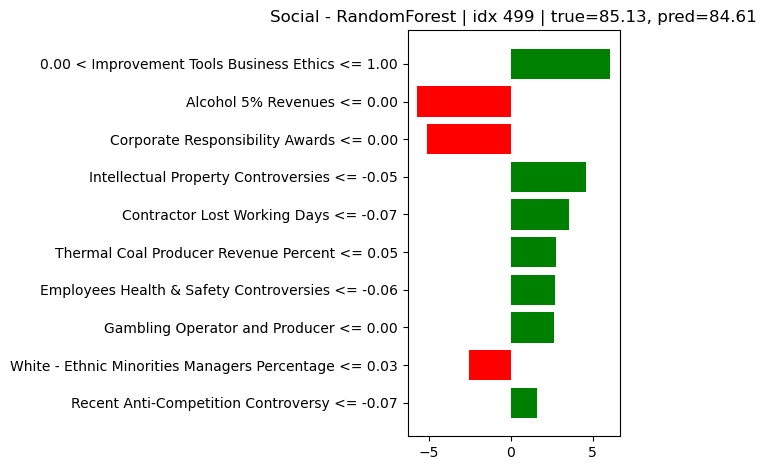

  idx=267 | y_true=75.957 | y_pred=70.541
   Top contributions:
     0.00 < Improvement Tools Business Ethics <= 1.00: +6.7300
     Nuclear Power Generation <= 0.00: -5.4148
     Corporate Responsibility Awards <= 0.00: -4.9809
     Gambling <= 0.00: +3.5795
     Thermal Coal Producer <= 0.00: +2.8576
     Product Responsibility Monitoring <= 0.00: -2.8136
     HIV-AIDS Program <= 0.00: -2.6515
     Number of Employees  from CSR reporting > 0.24: +2.4340
     Thermal Coal Producer Revenue Percent <= 0.05: +2.2032
     Recent Anti-Competition Controversy <= -0.07: +0.8773


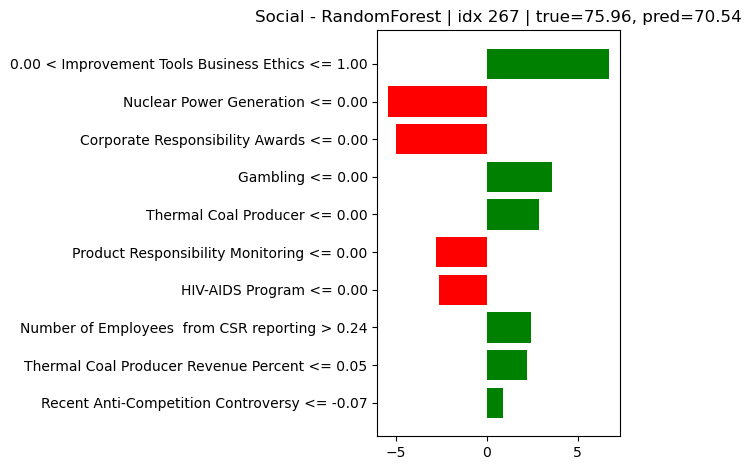

  idx=507 | y_true=65.660 | y_pred=69.789
   Top contributions:
     0.00 < Improvement Tools Business Ethics <= 1.00: +5.8764
     Corporate Responsibility Awards <= 0.00: -5.0111
     Product Responsibility Monitoring <= 0.00: -2.8252
     HIV-AIDS Program <= 0.00: -2.8036
     0.00 < Policy Fair Competition <= 1.00: +2.3935
     Employees Health & Safety Controversies <= -0.06: -2.1905
     Gambling Operator and Producer <= 0.00: -1.9936
     Gambling <= 0.00: -1.8705
     Thermal Coal Producer Revenue Percent <= 0.05: +1.6574
     Recent Anti-Competition Controversy <= -0.07: -1.5706


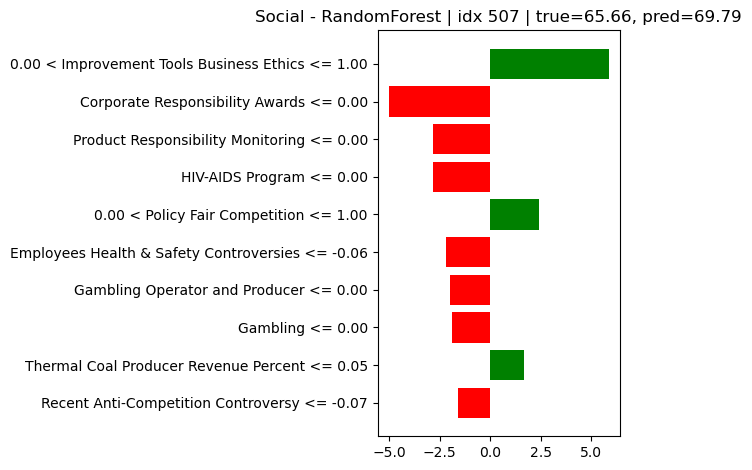

  idx=457 | y_true=51.575 | y_pred=65.363
   Top contributions:
     Improvement Tools Business Ethics <= 0.00: -6.2209
     0.00 < Corporate Responsibility Awards <= 1.00: +5.0328
     0.00 < Policy Fair Competition <= 1.00: +2.8963
     HIV-AIDS Program <= 0.00: -2.8689
     Thermal Coal Producer Revenue <= -0.07: +2.7442
     Thermal Coal Producer <= 0.00: +2.6068
     Product Responsibility Monitoring <= 0.00: -2.4144
     Gambling <= 0.00: -1.8476
     Adult Entertainment Producer <= 0.00: +1.3366
     Intellectual Property Controversies <= -0.05: -0.3140


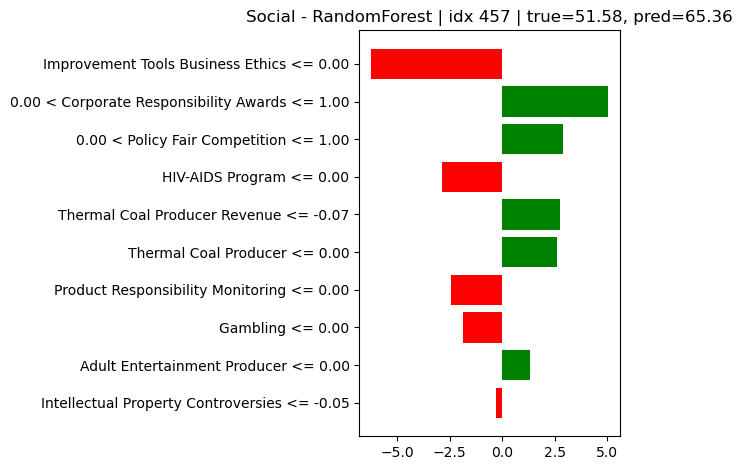

  idx=402 | y_true=59.696 | y_pred=55.109
   Top contributions:
     Improvement Tools Business Ethics <= 0.00: -6.6739
     0.00 < Corporate Responsibility Awards <= 1.00: +4.9597
     Thermal Coal Producer Revenue Percent <= 0.05: +4.4218
     Retailing Responsibility <= 0.00: -3.9412
     Thermal Coal Producer Revenue <= -0.07: -3.7856
     Oil and Gas Producer Revenue Percent <= -0.06: -3.4049
     Policy Fair Competition <= 0.00: -2.7826
     HIV-AIDS Program <= 0.00: -2.7288
     Alcohol 5% Revenues <= 0.00: +1.9921
     Gambling Operator and Producer <= 0.00: -1.3531


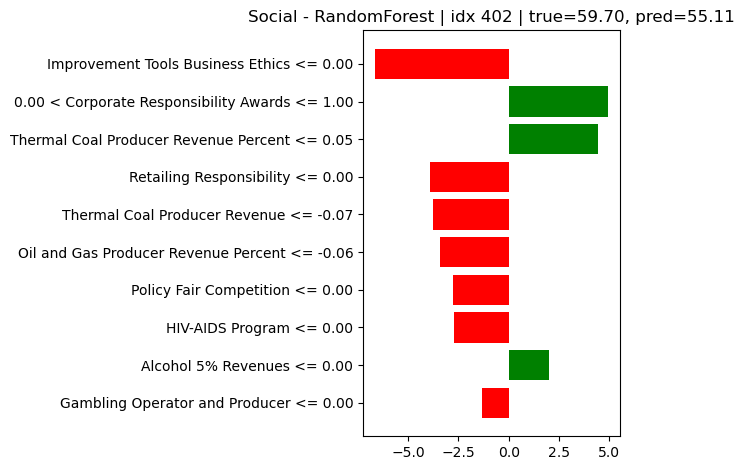


[Social] LIME for XGBoost on 5 test instances.
  idx=499 | y_true=85.135 | y_pred=87.789
   Top contributions:
     0.00 < Improvement Tools Business Ethics <= 1.00: +10.3117
     -0.60 < Women Managers <= 0.17: -7.7649
     Recent Anti-Competition Controversy <= -0.07: -5.0152
     Day Care Services > 0.00: +4.9520
     Retailing Responsibility <= 0.00: +4.9229
     Armaments <= 0.00: -4.8112
     0.00 < Targets Diversity and Opportunity <= 1.00: +3.0830
     Alcohol Producer Ownership Percent <= -0.17: +2.9079
     ISO 9000 > 0.00: +2.3761
     Alcohol 5% Revenues <= 0.00: +2.2048


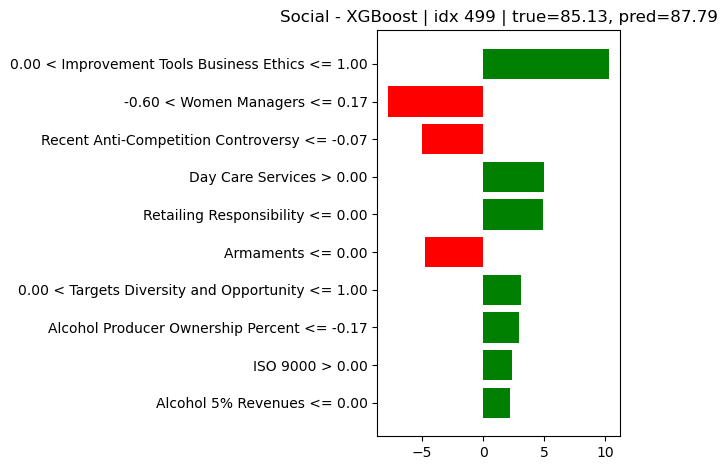

  idx=267 | y_true=75.957 | y_pred=71.852
   Top contributions:
     0.17 < Women Managers <= 0.62: +10.6053
     0.00 < Improvement Tools Business Ethics <= 1.00: +9.8566
     Public Health Controversies <= -0.07: +5.1145
     Gambling Operator and Producer <= 0.00: -5.0628
     Retailing Responsibility <= 0.00: -5.0301
     Tax Fraud Controversies <= -0.11: +4.7748
     Diversity and Opportunity Controversies <= -0.07: +4.3177
     Day Care Services <= 0.00: -4.1343
     Customer Satisfaction > 0.05: +3.6185
     Critical Countries Controversies <= -0.10: -2.8456


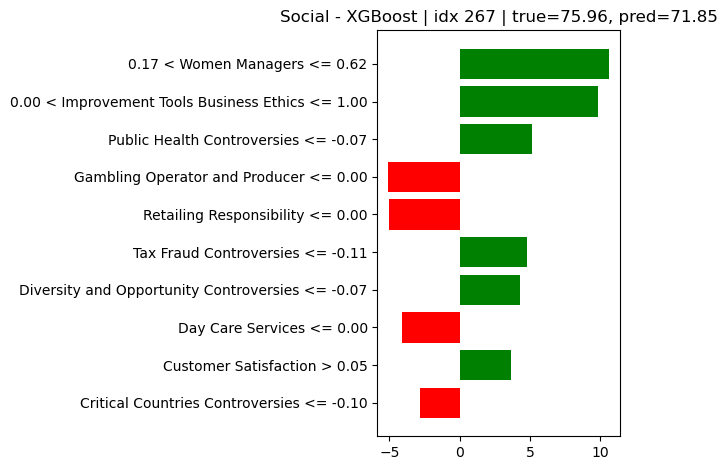

  idx=507 | y_true=65.660 | y_pred=69.986
   Top contributions:
     Women Managers <= -0.60: -12.3911
     0.00 < Improvement Tools Business Ethics <= 1.00: +10.5161
     Day Care Services <= 0.00: -4.9912
     Alcohol 5% Revenues <= 0.00: +4.5837
     Armaments <= 0.00: -4.0118
     Oil and Gas Producer Revenue Percent <= -0.06: -3.2890
     Targets Diversity and Opportunity <= 0.00: -3.0885
     ISO 9000 > 0.00: +2.9372
     0.00 < Policy Customer Health & Safety <= 1.00: +2.9123
     Armaments Revenues <= -0.03: -2.0333


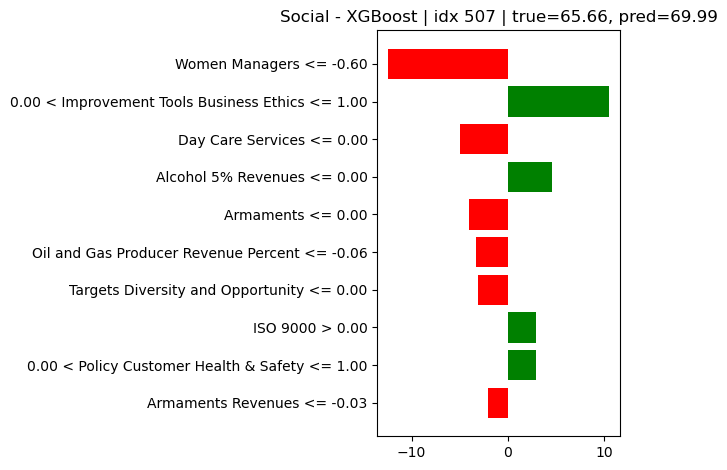

  idx=457 | y_true=51.575 | y_pred=59.794
   Top contributions:
     Improvement Tools Business Ethics <= 0.00: -9.7868
     -0.60 < Women Managers <= 0.17: -8.0528
     Oil and Gas Producer Revenue Percent <= -0.06: +4.2685
     Intellectual Property Controversies <= -0.05: -4.2663
     0.00 < Targets Diversity and Opportunity <= 1.00: +3.5902
     Critical Countries Controversies <= -0.10: +3.4418
     Day Care Services <= 0.00: -3.4147
     Alcohol 5% Revenues <= 0.00: -3.3377
     Armaments <= 0.00: -3.1370
     Asian - Ethnic Minorities Managers Percentage <= -0.00: +2.0222


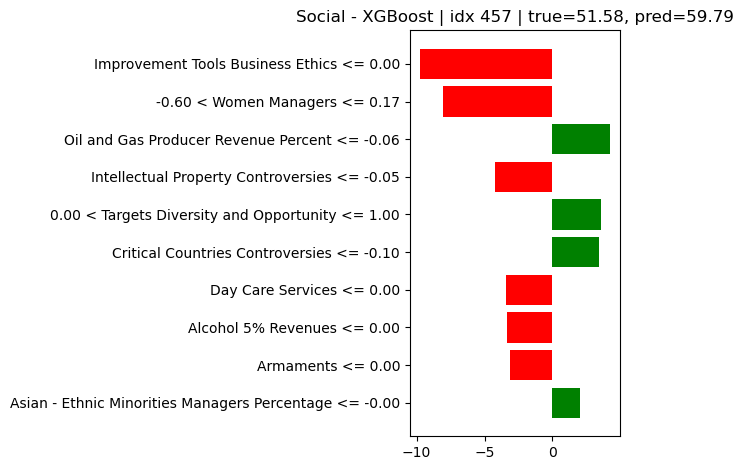

  idx=402 | y_true=59.696 | y_pred=55.525
   Top contributions:
     Improvement Tools Business Ethics <= 0.00: -9.9802
     -0.60 < Women Managers <= 0.17: -8.5510
     Diversity and Opportunity Controversies <= -0.07: -5.2861
     Armaments <= 0.00: -4.3935
     Employees Health & Safety Controversies <= -0.06: -4.0422
     Day Care Services <= 0.00: -3.9448
     0.00 < Targets Diversity and Opportunity <= 1.00: +3.8474
     Asian - Ethnic Minorities Managers Percentage <= -0.00: +3.6120
     Nuclear Weapons <= 0.00: +3.4031
     Oil and Gas Producer Revenue Percent <= -0.06: +3.3951


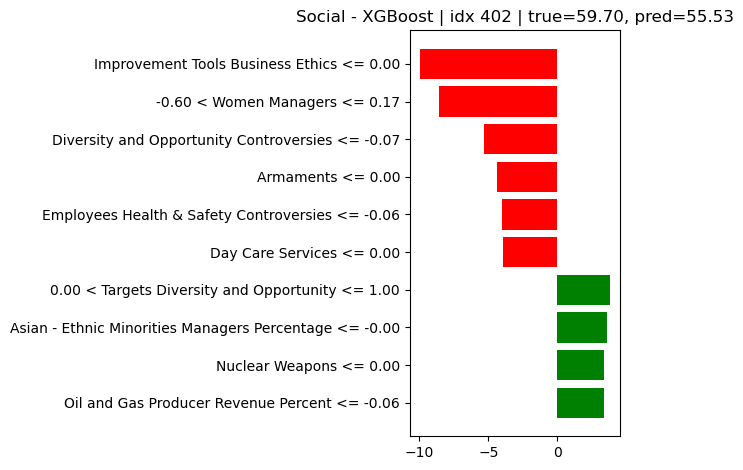


[Environment] LIME for RandomForest on 5 test instances.
  idx=499 | y_true=80.167 | y_pred=78.157
   Top contributions:
     0.00 < Environmental Partnerships <= 1.00: +12.0586
     0.00 < Policy Water Efficiency <= 1.00: +6.4545
     Environmental Expenditures Investments <= 0.00: -3.6518
     Targets Water Efficiency <= 0.00: -2.6937
     Resource Reduction Targets <= 0.00: -2.4144
     0.00 < Env Supply Chain Partnership Termination <= 1.00: +2.3063
     Facilities Water Discharge <= 0.00: +2.1631
     0.00 < Environmental Materials Sourcing <= 1.00: +1.8592
     Electricity Produced from Gas <= -0.07: -1.8022
     Ozone-Depleting Substances To Revenues USD in million <= -0.10: -1.5802


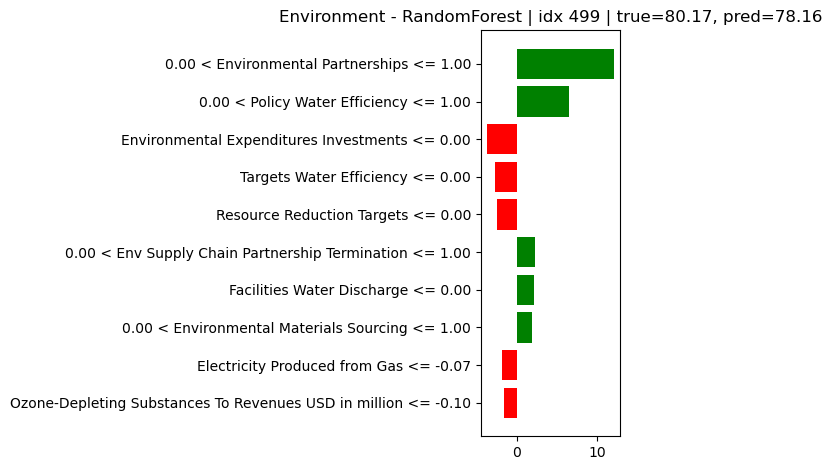

  idx=267 | y_true=81.123 | y_pred=74.278
   Top contributions:
     0.00 < Environmental Partnerships <= 1.00: +11.9415
     Fossil Fuel Debt Finance count <= 0.00: +6.8314
     0.00 < Policy Water Efficiency <= 1.00: +5.8282
     Environmental Expenditures Investments <= 0.00: -3.7446
     0.00 < Resource Reduction Targets <= 1.00: +3.1799
     Electricity Produced from Gas <= -0.07: -3.1210
     Targets Water Efficiency <= 0.00: -3.0131
     Env Supply Chain Partnership Termination <= 0.00: -2.1136
     Target Sustainable Palm Oil Supply Chain <= 0.00: +1.9626
     Hazardous Waste <= -0.15: +1.9347


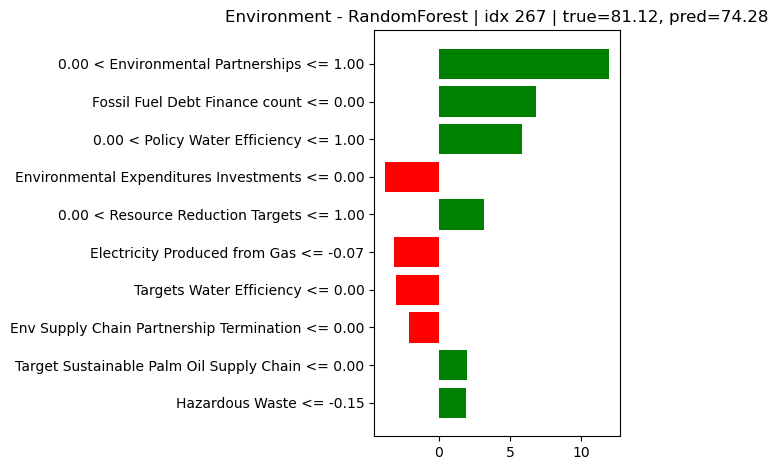

  idx=507 | y_true=66.364 | y_pred=67.410
   Top contributions:
     Environmental Partnerships <= 0.00: -11.8607
     0.00 < Policy Water Efficiency <= 1.00: +5.9405
     Environmental Expenditures Investments <= 0.00: -3.7631
     Resource Reduction Targets <= 0.00: -3.0406
     Total Energy Use from Properties <= -0.02: -2.8670
     Targets Water Efficiency <= 0.00: -2.4351
     0.00 < Env Supply Chain Partnership Termination <= 1.00: +2.2827
     Cost of Pollution and Waste <= 0.00: -1.9553
     Fossil Fuel Debt Finance count <= 0.00: -1.9384
     0.00 < Environmental Materials Sourcing <= 1.00: +1.8479


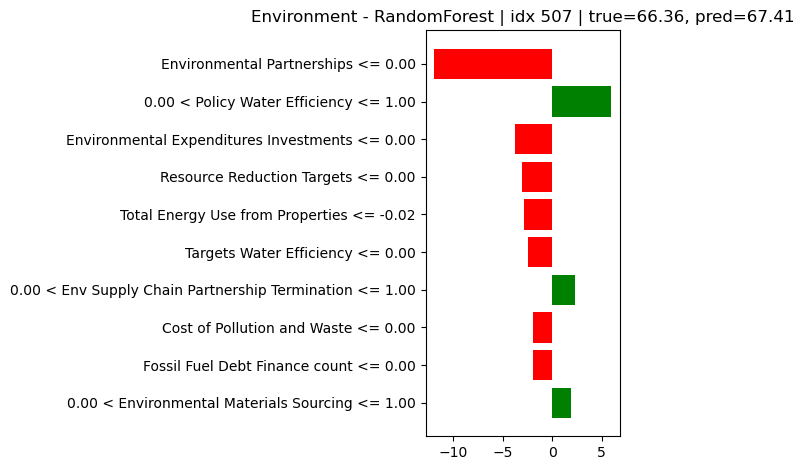

  idx=457 | y_true=49.084 | y_pred=64.315
   Top contributions:
     0.00 < Environmental Partnerships <= 1.00: +11.6986
     0.00 < Policy Water Efficiency <= 1.00: +5.8436
     Total Energy Use from Properties <= -0.02: +4.2311
     0.00 < Environmental Expenditures Investments <= 1.00: +3.7365
     0.00 < Resource Reduction Targets <= 1.00: +3.0368
     Targets Water Efficiency <= 0.00: -2.7816
     Coal Produced (Raw Material in Tonnes) Total <= -0.06: +2.6809
     Facilities Water Withdrawal <= 0.00: -2.6728
     Cost of Pollution and Waste <= 0.00: -2.0393
     Renewable Energy Supply <= -0.13: -1.9322


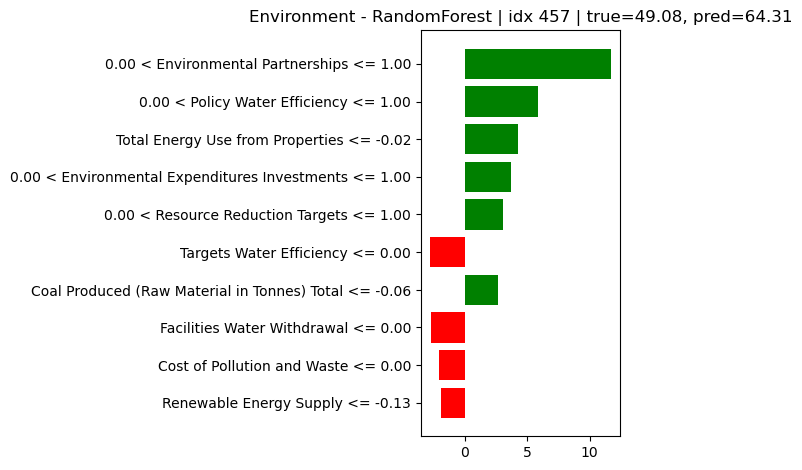

  idx=402 | y_true=78.718 | y_pred=73.456
   Top contributions:
     Environmental Partnerships <= 0.00: -12.2316
     0.00 < Policy Water Efficiency <= 1.00: +5.8526
     0.00 < Resource Reduction Targets <= 1.00: +3.3906
     Fossil Fuel Debt Finance count <= 0.00: -2.9784
     Targets Water Efficiency <= 0.00: -2.9651
     Environmental Expenditures Investments <= 0.00: -2.8076
     Facilities Water Discharge <= 0.00: +2.7678
     Cost of Pollution and Waste <= 0.00: -2.5144
     Hazardous Waste <= -0.15: +2.2904
     Total Energy Use from Properties <= -0.02: +1.4338


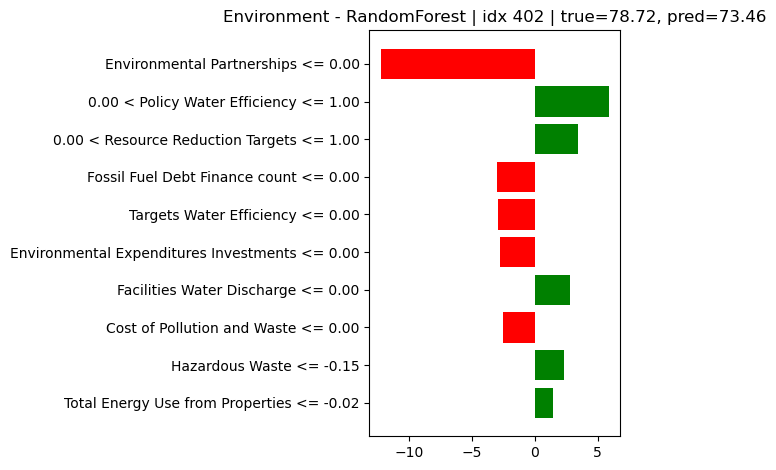


[Environment] LIME for XGBoost on 5 test instances.
  idx=499 | y_true=80.167 | y_pred=73.978
   Top contributions:
     0.00 < Environmental Partnerships <= 1.00: +23.7211
     Environmental Expenditures Investments <= 0.00: -10.6963
     0.00 < Staff Transportation Impact Reduction <= 1.00: +9.5344
     Reporting Against the TCFD Recommendations <= 0.00: -6.1283
     0.00 < Policy Water Efficiency <= 1.00: +5.2097
     year_2024.0 <= 0.00: -2.1788
     Fossil Fuel Debt Finance count <= 0.00: +2.1612
     0.00 < Environment Management Training <= 1.00: -1.4386
     Electricity Produced from Solar <= -0.07: -1.3202
     Hazardous Waste <= -0.15: +1.1743


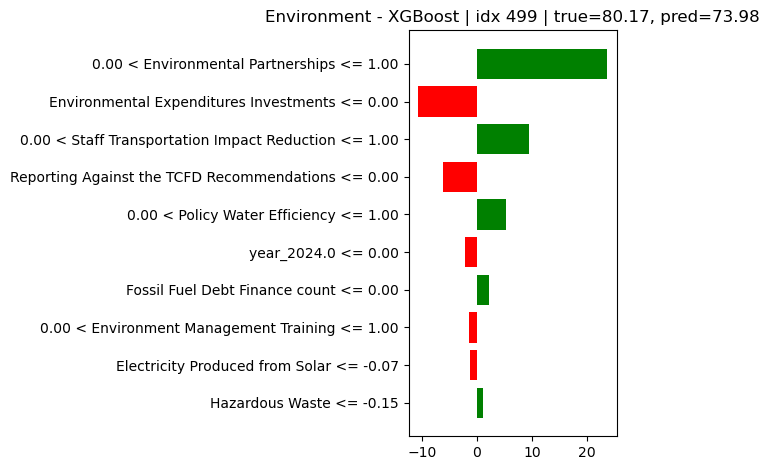

  idx=267 | y_true=81.123 | y_pred=76.010
   Top contributions:
     0.00 < Environmental Partnerships <= 1.00: +23.4828
     Environmental Expenditures Investments <= 0.00: -10.4874
     0.00 < Staff Transportation Impact Reduction <= 1.00: +9.8889
     Reporting Against the TCFD Recommendations <= 0.00: -5.9774
     0.00 < Policy Water Efficiency <= 1.00: +4.8735
     Policy Nuclear Safety <= 0.00: +2.0711
     year_2024.0 <= 0.00: -1.9345
     Total Waste To EVIC USD in million > -0.20: -1.4813
     0.00 < Environment Management Training <= 1.00: -1.1983
     Hazardous Waste <= -0.15: +1.1230


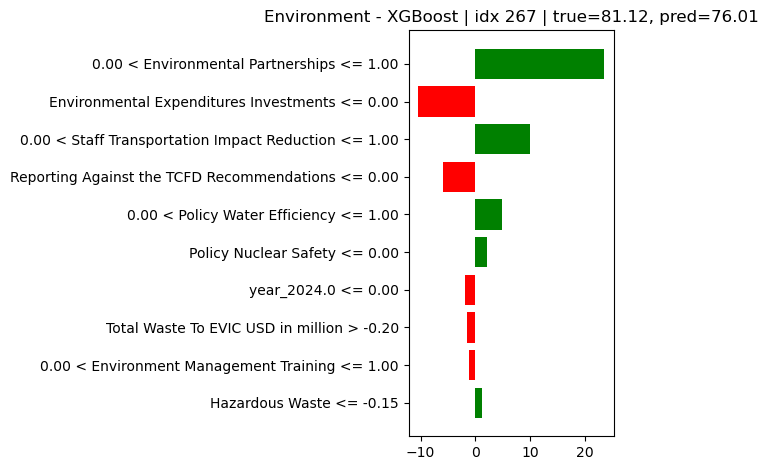

  idx=507 | y_true=66.364 | y_pred=69.321
   Top contributions:
     Environmental Partnerships <= 0.00: -23.4380
     Environmental Expenditures Investments <= 0.00: -10.6623
     Staff Transportation Impact Reduction <= 0.00: -9.6888
     0.00 < Reporting Against the TCFD Recommendations <= 1.00: +6.3692
     0.00 < Policy Water Efficiency <= 1.00: +4.8723
     year_2024.0 <= 0.00: -1.8649
     Hazardous Waste <= -0.15: +1.5404
     Coal Produced (Raw Material in Tonnes) Total <= -0.06: -1.4696
     Renewable Electricity Produced Without Bifurcation > -0.06: +1.3970
     -0.18 < Waste Recycled To Total Waste <= 0.08: -1.3902


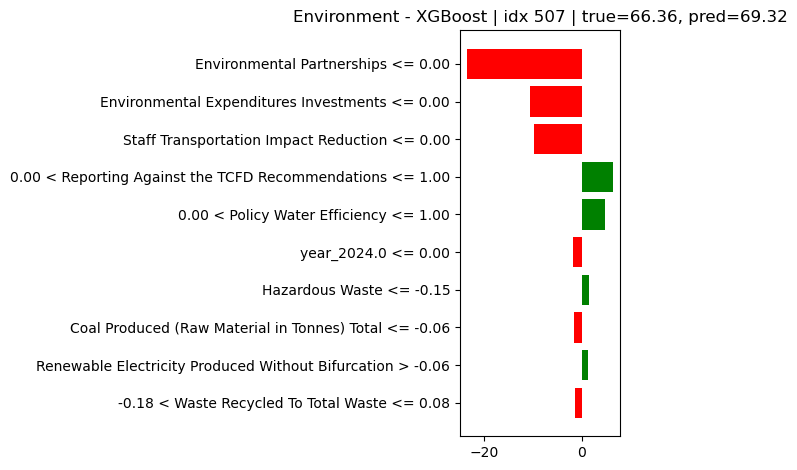

  idx=457 | y_true=49.084 | y_pred=64.984
   Top contributions:
     0.00 < Environmental Partnerships <= 1.00: +23.6869
     0.00 < Environmental Expenditures Investments <= 1.00: +10.3625
     0.00 < Staff Transportation Impact Reduction <= 1.00: +9.6063
     0.00 < Reporting Against the TCFD Recommendations <= 1.00: +5.9043
     0.00 < Policy Water Efficiency <= 1.00: +5.1518
     year_2024.0 <= 0.00: -1.6705
     -0.18 < Waste Recycled To Total Waste <= 0.08: -1.6617
     Policy Nuclear Safety <= 0.00: -1.3489
     Hazardous Waste <= -0.15: +1.2947
     Cost of Pollution and Waste <= 0.00: -0.3761


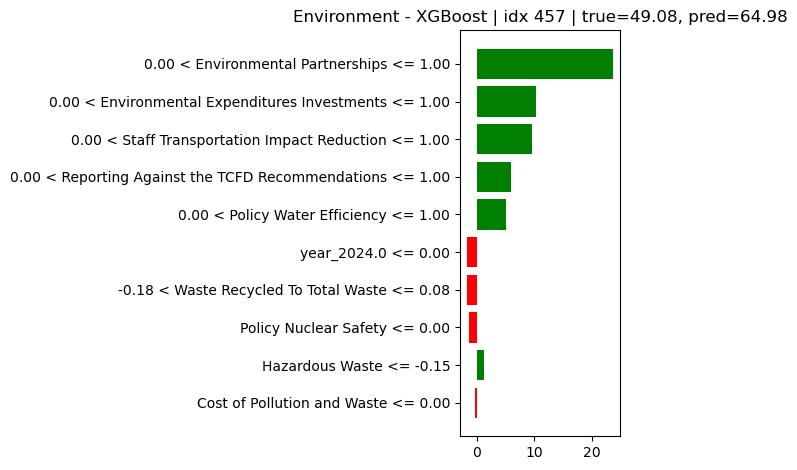

  idx=402 | y_true=78.718 | y_pred=71.185
   Top contributions:
     Environmental Partnerships <= 0.00: -23.2779
     Environmental Expenditures Investments <= 0.00: -10.6788
     0.00 < Staff Transportation Impact Reduction <= 1.00: +10.0816
     Reporting Against the TCFD Recommendations <= 0.00: -6.0182
     0.00 < Policy Water Efficiency <= 1.00: +5.0415
     year_2024.0 <= 0.00: -1.8322
     Hazardous Waste <= -0.15: +1.1154
     0.00 < Policy Waste <= 1.00: +0.9989
     0.00 < Env Supply Chain Partnership Termination <= 1.00: +0.8974
     Electricity Produced from Biomass <= -0.07: -0.7779


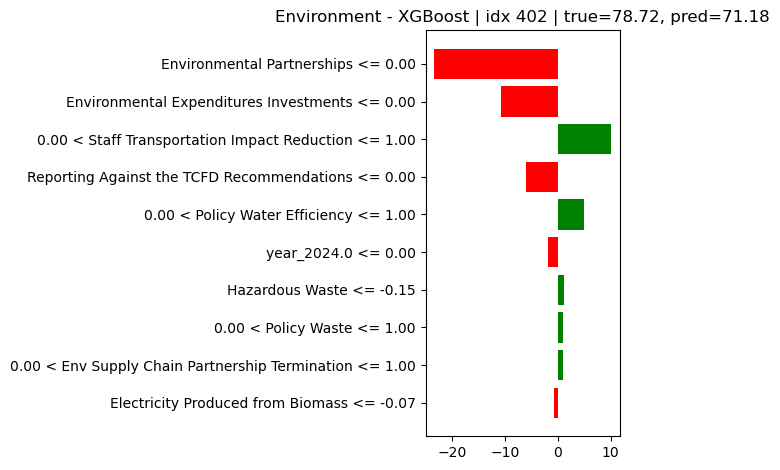

In [83]:

try:
    from lime.lime_tabular import LimeTabularExplainer
except ModuleNotFoundError:
    %pip install lime
    from lime.lime_tabular import LimeTabularExplainer
except Exception as e:
    raise RuntimeError("LIME is required. Install with `pip install lime`") from e

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def _to_numpy(X):
    return X.values if hasattr(X, "values") else np.asarray(X)


def _align_test(X_test, X_train):
    try:
        return X_test[X_train.columns]
    except Exception:
        return X_test


def explain_with_lime(group_name, X_train, X_test, y_test, models, k_instances=5, num_features=10, num_samples=1500, random_state=42):
    if X_train is None or X_test is None or y_test is None:
        print(f"[{group_name}] Missing data. Skipping.")
        return
    if len(X_test) == 0:
        print(f"[{group_name}] Empty test set. Skipping.")
        return

    # Ensure alignment and numpy arrays for LIME
    X_test = _align_test(X_test, X_train)
    Xtr_np = _to_numpy(X_train).astype(float)
    feature_names = list(X_train.columns)

    explainer = LimeTabularExplainer(
        training_data=Xtr_np,
        feature_names=feature_names,
        mode='regression',
        discretize_continuous=True,
        sample_around_instance=True,
        random_state=random_state
    )

    rng = np.random.RandomState(random_state)
    k = min(k_instances, len(X_test))
    idxs = rng.choice(np.arange(len(X_test)), size=k, replace=False)

    for model_name, model in models.items():
        if model is None:
            print(f"[{group_name}] {model_name}: model not found. Skipping.")
            continue

        print(f"\n[{group_name}] LIME for {model_name} on {k} test instances.")
        def pred_fn(a):
            # Re-wrap to DataFrame so column order is preserved for model
            X_df = pd.DataFrame(a, columns=feature_names, index=None)
            return model.predict(X_df)

        for i in idxs:
            x0 = _to_numpy(X_test.iloc[[i]]).ravel()
            y_true = float(y_test.iloc[i])
            y_pred = float(model.predict(X_test.iloc[[i]])[0])

            exp = explainer.explain_instance(
                data_row=x0,
                predict_fn=pred_fn,
                num_features=num_features,
                num_samples=num_samples
            )

            # Print top contributions
            print(f"  idx={X_test.index[i]} | y_true={y_true:.3f} | y_pred={y_pred:.3f}")
            print("   Top contributions:")
            for feat, w in exp.as_list()[:num_features]:
                print(f"     {feat}: {w:+.4f}")

            # Plot explanation
            fig = exp.as_pyplot_figure()
            plt.title(f"{group_name} - {model_name} | idx {X_test.index[i]} | true={y_true:.2f}, pred={y_pred:.2f}")
            plt.tight_layout()
            plt.show()


# Prepare mappings from existing variables
gov_models = {"RandomForest": globals().get("rf_gov"), "XGBoost": globals().get("xgb_gov")}
soc_models = {"RandomForest": globals().get("rf_soc"), "XGBoost": globals().get("xgb_soc")}
env_models = {"RandomForest": globals().get("rf_env"), "XGBoost": globals().get("xgb_env")}

# Explain each group
explain_with_lime(
    "Governance",
    globals().get("Xtr_gov_vif"),
    globals().get("Xte_gov_vif"),
    globals().get("yte_gov"),
    gov_models,
    k_instances=5,
    num_features=10,
    num_samples=1500
)

explain_with_lime(
    "Social",
    globals().get("Xtr_soc_vif"),
    globals().get("Xte_soc_vif"),
    globals().get("yte_soc"),
    soc_models,
    k_instances=5,
    num_features=10,
    num_samples=1500
)

explain_with_lime(
    "Environment",
    globals().get("Xtr_env_vif"),
    globals().get("Xte_env_vif"),
    globals().get("yte_env"),
    env_models,
    k_instances=5,
    num_features=10,
    num_samples=1500
)

SHAP vs LIME comparative analysis (fidelity, stability, robustness, simplicity, efficiency)


In [84]:
import os, time, tracemalloc
from copy import deepcopy
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.base import clone

try:
    import shap
except Exception as e:
    raise RuntimeError("Install SHAP: pip install shap") from e

try:
    from lime.lime_tabular import LimeTabularExplainer
except Exception as e:
    raise RuntimeError("Install LIME: pip install lime") from e

def ensure_dir(path: str):
    os.makedirs(path, exist_ok=True)

def shap_explain(model, X_train: pd.DataFrame, X: pd.DataFrame, bg_size=256):
    X_bg = X_train.sample(min(bg_size, len(X_train)), random_state=42)
    try:
        explainer = shap.Explainer(model, X_bg)
    except Exception:
        explainer = shap.TreeExplainer(
            model, data=X_bg, feature_perturbation="interventional", model_output="raw"
        )
    sv = explainer(X, check_additivity=False)
    vals = np.asarray(sv.values)
    contrib_df = pd.DataFrame(vals, columns=X.columns, index=X.index)
    return contrib_df, explainer, sv

def lime_explainer(X_train: pd.DataFrame, feature_names):
    Xtr_np = np.asarray(X_train).astype(float)
    return LimeTabularExplainer(
        training_data=Xtr_np,
        feature_names=list(feature_names),
        mode='regression',
        discretize_continuous=True,
        sample_around_instance=True,
        random_state=42
    )

def lime_contribs(model, X_train: pd.DataFrame, X: pd.DataFrame, num_features=10, num_samples=5000):
    expl = lime_explainer(X_train, X.columns)
    rows = []
    for i in range(len(X)):
        xi = X.iloc[[i]]
        def pred_fn(a):
            return model.predict(pd.DataFrame(a, columns=X.columns))
        exp = expl.explain_instance(
            data_row=xi.values.ravel(),
            predict_fn=pred_fn,
            num_features=num_features,
            num_samples=num_samples
        )
        # Aggregate weights back to base column names
        w = {}
        for feat, weight in exp.as_list():
            base = feat.split(' ')[0]
            w[base] = w.get(base, 0.0) + weight
        s = pd.Series(0.0, index=X.columns, dtype=float)
        for k, v in w.items():
            if k in s.index:
                s[k] = v
        rows.append(s)
    return pd.DataFrame(rows, index=X.index)

def topk_from_contribs(df_contribs: pd.DataFrame, k=3):
    return df_contribs.abs().apply(
        lambda s: list(s.nlargest(min(k, max(1, (s.abs() > 0).sum()))).index), axis=1
    )

def jaccard(a, b):
    a, b = set(a), set(b)
    if not a and not b:
        return 1.0
    if not a or not b:
        return 0.0
    return len(a & b) / len(a | b)

def roar_fidelity(base_model, Xtr, ytr, Xte, yte, topk_lists, global_k=3):
    # Use the most frequent top-k features across the sample
    flat = pd.Series([f for lst in topk_lists for f in lst]).value_counts().index.tolist()
    kset = set(flat[:min(global_k, len(flat))])
    if len(kset) == 0:
        return np.nan, np.nan, []
    keep_cols = [c for c in Xtr.columns if c not in kset]
    model2 = clone(base_model)
    model2.fit(Xtr[keep_cols], ytr)
    base_pred = base_model.predict(Xte)
    new_pred = model2.predict(Xte[keep_cols])
    base_rmse = float(np.sqrt(mean_squared_error(yte, base_pred)))
    new_rmse = float(np.sqrt(mean_squared_error(yte, new_pred)))
    base_r2 = float(r2_score(yte, base_pred))
    new_r2 = float(r2_score(yte, new_pred))
    return (new_rmse - base_rmse), (new_r2 - base_r2), list(kset)

def run_compare(group, Xtr, ytr, Xte, yte, model, sample_n=100, k=3, noise_std=0.1, outdir="reports/xai"):
    if any(v is None for v in [Xtr, ytr, Xte, yte, model]) or len(Xte) == 0:
        print(f"[{group}] Missing inputs.")
        return None

    outdir = os.path.abspath(outdir)
    ensure_dir(outdir)

    # Sample a manageable subset for explanation
    rng = np.random.RandomState(42)
    idx = Xte.index if len(Xte) <= sample_n else rng.choice(Xte.index, size=sample_n, replace=False)
    Xs = Xte.loc[idx]
    ys = yte.loc[idx] if hasattr(yte, 'loc') else pd.Series(yte, index=idx)

    # SHAP
    tracemalloc.start()
    t0 = time.time()
    shap_df, shap_expl, shap_vals = shap_explain(model, Xtr, Xs)
    shap_time = time.time() - t0
    shap_mem = sum(m.size for m in tracemalloc.take_snapshot().traces) if hasattr(tracemalloc, 'take_snapshot') else np.nan
    tracemalloc.stop()
    # Save one summary + one waterfall
    try:
        shap.summary_plot(shap_vals, Xs, plot_type="dot", max_display=20, show=False)
        shap_sum_path = os.path.join(outdir, f"{group}_SHAP_summary.png")
        import matplotlib.pyplot as plt
        plt.tight_layout()
        plt.savefig(shap_sum_path, dpi=150, bbox_inches='tight')
        plt.close()
        try:
            shap.plots.waterfall(shap_vals[0], max_display=20, show=False)
            shap_wf_path = os.path.join(outdir, f"{group}_SHAP_waterfall_0.png")
            plt.tight_layout()
            plt.savefig(shap_wf_path, dpi=150, bbox_inches='tight')
            plt.close()
        except Exception:
            pass
    except Exception:
        pass

    # LIME
    tracemalloc.start()
    t0 = time.time()
    lime_df = lime_contribs(model, Xtr, Xs, num_features=10, num_samples=5000)
    lime_time = time.time() - t0
    lime_mem = sum(m.size for m in tracemalloc.take_snapshot().traces) if hasattr(tracemalloc, 'take_snapshot') else np.nan
    tracemalloc.stop()
    # Save one LIME figure for first instance
    try:
        exp = lime_explainer(Xtr, Xtr.columns).explain_instance(
            data_row=Xs.iloc[0].values.ravel(),
            predict_fn=lambda a: model.predict(pd.DataFrame(a, columns=Xtr.columns)),
            num_features=10,
            num_samples=5000
        )
        fig = exp.as_pyplot_figure()
        fig.suptitle(f"{group} LIME (idx={Xs.index[0]})")
        lime_fig_path = os.path.join(outdir, f"{group}_LIME_0.png")
        import matplotlib.pyplot as plt
        plt.tight_layout()
        fig.savefig(lime_fig_path, dpi=150, bbox_inches='tight')
        plt.close(fig)
    except Exception:
        pass

    # Perturbation for stability/robustness
    Xpert = Xs.copy()
    for c in Xpert.columns:
        s = float(Xtr[c].std(ddof=0))
        if s > 0:
            Xpert[c] = Xpert[c] + rng.normal(0, noise_std * s, size=len(Xpert))

    # Recompute explanations on perturbed
    shap_df_pert, _, _ = shap_explain(model, Xtr, Xpert)
    lime_df_pert = lime_contribs(model, Xtr, Xpert, num_features=10, num_samples=5000)

    # Metrics per method
    rows = []
    for name, contribs, contribs_pert, t, mem in [
        ("SHAP", shap_df, shap_df_pert, shap_time, shap_mem),
        ("LIME", lime_df, lime_df_pert, lime_time, lime_mem),
    ]:
        topk = topk_from_contribs(contribs, k=k)
        topk_pert = topk_from_contribs(contribs_pert, k=k)
        stability = float(np.mean([jaccard(a, b) for a, b in zip(topk, topk_pert)]))
        robustness = float(np.mean(np.abs(contribs.values - contribs_pert.values)))
        simplicity = float((contribs.abs() > 1e-9).sum(axis=1).mean())
        d_rmse, d_r2, dropped = roar_fidelity(model, Xtr, ytr, Xte, yte, list(topk), global_k=k)
        rows.append({
            "Group": group,
            "Method": name,
            "Stability_Jaccard": stability,
            "Robustness_MAE_Δcontrib": robustness,
            "Simplicity_avg_nonzero_feats": simplicity,
            "Efficiency_time_s": t,
            "Efficiency_mem_bytes": mem,
            "Fidelity_ΔRMSE_after_drop": d_rmse,
            "Fidelity_ΔR2_after_drop": d_r2,
            "Dropped_feats_for_ROAR": ", ".join(dropped[:k])
        })

    df = pd.DataFrame(rows)
    display(df)
    csv_path = os.path.join(outdir, f"{group}_xai_compare.csv")
    df.to_csv(csv_path, index=False)
    print(f"[{group}] Saved metrics -> {csv_path}")
    return df

# Run per pillar using tuned RandomForest if available, else XGBoost
groups = [
    ("Governance",  globals().get("Xtr_gov_vif"), globals().get("ytr_gov"), globals().get("Xte_gov_vif"), globals().get("yte_gov"), globals().get("rf_gov") or globals().get("xgb_gov")),
    ("Social",      globals().get("Xtr_soc_vif"), globals().get("ytr_soc"), globals().get("Xte_soc_vif"), globals().get("yte_soc"), globals().get("rf_soc") or globals().get("xgb_soc")),
    ("Environment", globals().get("Xtr_env_vif"), globals().get("ytr_env"), globals().get("Xte_env_vif"), globals().get("yte_env"), globals().get("rf_env") or globals().get("xgb_env")),
]

all_res = []
for g, Xtr, ytr, Xte, yte, mdl in groups:
    res = run_compare(g, Xtr, ytr, Xte, yte, mdl, sample_n=100, k=3, noise_std=0.1, outdir="/Users/tobifadeyi/Documents/Thesis code/reports/xai")
    if isinstance(res, pd.DataFrame):
        all_res.append(res)

if all_res:
    summary = pd.concat(all_res, ignore_index=True)
    display(summary)

,Group,Method,Stability_Jaccard,Robustness_MAE_Δcontrib,Simplicity_avg_nonzero_feats,Efficiency_time_s,Efficiency_mem_bytes,Fidelity_ΔRMSE_after_drop,Fidelity_ΔR2_after_drop,Dropped_feats_for_ROAR
0,Governance,SHAP,0.854737,0.027820,90.031579,1.715516,3552271,0.039131,-0.002487,"Compensation Committee Independence, Independe..."
1,Governance,LIME,0.989474,0.000241,0.010526,28.284813,328565,-0.096736,0.006106,"year_2024.0, ESG Reporting Scope"


[Governance] Saved metrics -> /Users/tobifadeyi/Documents/Thesis code/reports/xai/Governance_xai_compare.csv


,Group,Method,Stability_Jaccard,Robustness_MAE_Δcontrib,Simplicity_avg_nonzero_feats,Efficiency_time_s,Efficiency_mem_bytes,Fidelity_ΔRMSE_after_drop,Fidelity_ΔR2_after_drop,Dropped_feats_for_ROAR
0,Social,SHAP,0.884211,0.024921,134.800000,6.424672,15483958,0.013963,-0.000639,"Policy Business Ethics, Corporate Responsibili..."
1,Social,LIME,0.763158,0.005564,0.210526,48.447813,276801,-0.032137,0.001466,"Temporary Staff Proportion, Gambling, Alcohol"


[Social] Saved metrics -> /Users/tobifadeyi/Documents/Thesis code/reports/xai/Social_xai_compare.csv


,Group,Method,Stability_Jaccard,Robustness_MAE_Δcontrib,Simplicity_avg_nonzero_feats,Efficiency_time_s,Efficiency_mem_bytes,Fidelity_ΔRMSE_after_drop,Fidelity_ΔR2_after_drop,Dropped_feats_for_ROAR
0,Environment,SHAP,0.716842,0.10994,82.010526,6.205677,14645513,-0.767542,0.039452,"Environmental Partnerships, Renewable Energy P..."
1,Environment,LIME,1.000000,0.00000,0.000000,43.420304,220371,-0.056382,0.002985,Total Water Usage Properties


[Environment] Saved metrics -> /Users/tobifadeyi/Documents/Thesis code/reports/xai/Environment_xai_compare.csv


,Group,Method,Stability_Jaccard,Robustness_MAE_Δcontrib,Simplicity_avg_nonzero_feats,Efficiency_time_s,Efficiency_mem_bytes,Fidelity_ΔRMSE_after_drop,Fidelity_ΔR2_after_drop,Dropped_feats_for_ROAR
0,Governance,SHAP,0.854737,0.027820,90.031579,1.715516,3552271,0.039131,-0.002487,"Compensation Committee Independence, Independe..."
1,Governance,LIME,0.989474,0.000241,0.010526,28.284813,328565,-0.096736,0.006106,"year_2024.0, ESG Reporting Scope"
2,Social,SHAP,0.884211,0.024921,134.800000,6.424672,15483958,0.013963,-0.000639,"Policy Business Ethics, Corporate Responsibili..."
3,Social,LIME,0.763158,0.005564,0.210526,48.447813,276801,-0.032137,0.001466,"Temporary Staff Proportion, Gambling, Alcohol"
4,Environment,SHAP,0.716842,0.109940,82.010526,6.205677,14645513,-0.767542,0.039452,"Environmental Partnerships, Renewable Energy P..."
5,Environment,LIME,1.000000,0.000000,0.000000,43.420304,220371,-0.056382,0.002985,Total Water Usage Properties
